## 1. Build Base Train Runs

Load only cleaned `RBC_1` files, rebuild compatible train features, and order runs by start timestamp.

In [ ]:
from pathlib import Path
import pandas as pd
import re
import numpy as np

# Build the base train files used by the later traffic-generation and STG dataset cells.
#
# Inputs:
# - Raw_BPL/ containing the source RBC traces.
# - cell_gnb_relation.csv defining the railway cells kept in the study section.
#
# Outputs:
# - _base_train_runs/train*.csv
# - ensured dataset folders for STGdata_A, STGdata_B, and STGdata_C
#
# Main steps:
# - discover cleaned RBC_1 files
# - filter each file to the mapped railway cells
# - rebuild common fields used later in the notebook
# - sort the resulting runs by start timestamp
# - write the base train files and prepare the downstream folder structure
#
# Paths and folder settings.
RAW_ROOT = Path("Raw_BPL")
STG_ROOT = Path(".")
BASE_TRAIN_DIR = Path("_base_train_runs")
CELL_GNB_PATH = Path("cell_gnb_relation.csv")
RBC_PATTERN = "train*/**/RBC_1_*.csv"

DATASET_FOLDERS = {
    "A": STG_ROOT / "STGdata_A",
    "B": STG_ROOT / "STGdata_B",
    "C": STG_ROOT / "STGdata_C",
}
for ds_root in DATASET_FOLDERS.values():
    (ds_root / "data").mkdir(parents=True, exist_ok=True)
    (ds_root / "input_trains").mkdir(parents=True, exist_ok=True)
BASE_TRAIN_DIR.mkdir(parents=True, exist_ok=True)

# CQI-to-SNR lookup used when rebuilding radio quality features.
# Values follow the perfect-channel-estimation mapping proposed in:
#A. K. Thyagarajan et al., “SNR-CQI Mapping for 5G Downlink Network,” in 2021 IEEE Asia Pacific Conference on Wireless and Mobile (APWiMob), Apr. 2021.

CQI_TO_SNR_DB = {
    1: -11.2,
    2: -9.1,
    3: -6.9,
    4: -4.4,
    5: -2.2,
    6: 0.7,
    7: 2.7,
    8: 4.3,
    9: 6.9,
    10: 8.5,
    11: 10.6,
    12: 12.4,
    13: 14.4,
    14: 17.5,
    15: 20.9,
}

KEEP_COLS_FINAL = [
    "msg_idx", "Timestamp", "CI",
    "D_LRBG", "HO_state", "Neighbor_Cell", "CQI_wb", "UL_SNR_wb", "CES", "EStop",
    "V_TRAIN", "NID_BG", "M_MODE", "DL Rxqual", "UL Rxqual",
]

RBC_RE = re.compile(r"^RBC_(\d+)_.*\.csv$", flags=re.IGNORECASE)


def extract_rbc_number(path: Path) -> int:
    m = RBC_RE.match(path.name)
    if not m:
        raise ValueError(f"Unexpected RBC filename: {path.name}")
    return int(m.group(1))


def discover_rbc1_files(root: Path):
    files = sorted(root.glob(RBC_PATTERN), key=lambda p: (str(p.parent), p.name.lower()))
    return files


def load_allowed_ci(cell_path: Path) -> set[int]:
    df = pd.read_csv(cell_path)
    col = "CI" if "CI" in df.columns else df.columns[0]
    ci = pd.to_numeric(df[col], errors="coerce").dropna().astype(int)
    return set(ci.tolist())


def get_start_timestamp(df: pd.DataFrame):
    if "Timestamp" not in df.columns:
        return pd.NaT
    ts = pd.to_datetime(df["Timestamp"], errors="coerce", dayfirst=True, utc=False)
    if ts.notna().any():
        return ts.min()
    return pd.NaT


def build_neighbor_cell(ci_series: pd.Series) -> pd.Series:
    runs = (ci_series != ci_series.shift()).cumsum()
    first_ci_per_run = ci_series.groupby(runs, sort=False).first()
    next_ci_per_run = first_ci_per_run.shift(-1)
    return runs.map(next_ci_per_run).fillna(-1).astype("Int64")


def prepare_clean_rbc1(df: pd.DataFrame, allowed_ci: set[int]) -> pd.DataFrame:
    out = df.copy()
    out.columns = [str(c).strip() for c in out.columns]

    if "Timestamp" not in out.columns or "CI" not in out.columns:
        raise ValueError("RBC_1 file must contain at least Timestamp and CI")

    if "Timestamp" in out.columns:
        ts = pd.to_datetime(out["Timestamp"], errors="coerce", dayfirst=True)
        if ts.notna().any():
            out = (
                out.assign(_ts_sort=ts)
                   .sort_values("_ts_sort", kind="stable")
                   .drop(columns=["_ts_sort"])
                   .reset_index(drop=True)
            )

    for cname in ["M_MODE", "DL Rxqual", "UL Rxqual"]:
        if cname in out.columns:
            out[cname] = out[cname].replace("", np.nan).ffill().bfill()

    if "V_TRAIN (Km/h)" in out.columns:
        out = out.rename(columns={"V_TRAIN (Km/h)": "V_TRAIN"})

    out["CI"] = pd.to_numeric(out["CI"], errors="coerce")
    out = out[out["CI"].notna()].copy()
    out["CI"] = out["CI"].astype(int)

    if allowed_ci:
        out = out[out["CI"].isin(allowed_ci)].reset_index(drop=True)
        if out.empty:
            raise ValueError("No allowed CI rows remain after filtering to the railway section")

    RQ_TO_PAIR = {
        7: (1, 2), 6: (3, 4), 5: (5, 6), 4: (7, 8), 3: (9, 10),
        2: (11, 12), 1: (13, 14), 0: (15, 15),
    }
    _DWELL_MIN = 2
    _TAU = 0.25

    def _estimate_cqi_from_rxqual(rx_series: pd.Series, ci_series: pd.Series) -> pd.Series:
        rx = pd.to_numeric(rx_series, errors="coerce")
        cqi = []
        dwell_cnt = 0
        prev_cqi = None
        prev_bucket = None
        prev_ci = None

        def bucket_for_rq(rq_val):
            if pd.isna(rq_val):
                return None
            rq_int = int(rq_val)
            return RQ_TO_PAIR.get(rq_int, None)

        for i in range(len(rx)):
            rq_t = rx.iat[i]
            ci_t = ci_series.iat[i] if len(ci_series) else None

            prev1 = rx.iat[i - 1] if i - 1 >= 0 else np.nan
            prev2 = rx.iat[i - 2] if i - 2 >= 0 else np.nan
            d1 = (rq_t - prev1) if (not pd.isna(rq_t) and not pd.isna(prev1)) else 0.0
            d2 = (rq_t - prev2) if (not pd.isna(rq_t) and not pd.isna(prev2)) else 0.0
            trend = 0.6 * (-d1) + 0.4 * (-d2)

            pair = bucket_for_rq(rq_t)
            bucket_changed = (pair != prev_bucket)
            ci_changed = (ci_t != prev_ci)

            if pair is None:
                candidate = prev_cqi
            else:
                lo, hi = pair
                if lo == hi:
                    candidate = lo
                else:
                    if trend > _TAU:
                        candidate = hi
                    elif trend < -_TAU:
                        candidate = lo
                    else:
                        candidate = prev_cqi if prev_cqi in (lo, hi) else lo

            if (
                prev_cqi is not None
                and candidate != prev_cqi
                and not bucket_changed
                and dwell_cnt < _DWELL_MIN
                and not ci_changed
            ):
                cqi.append(prev_cqi)
                dwell_cnt += 1
            else:
                cqi.append(candidate)
                if (prev_cqi != candidate) or bucket_changed or ci_changed:
                    dwell_cnt = 0
                else:
                    dwell_cnt = min(dwell_cnt + 1, _DWELL_MIN)

            prev_cqi = cqi[-1]
            prev_bucket = pair
            prev_ci = ci_t

        return pd.Series(cqi, index=rx_series.index).astype("Int64")

    ci_series = out["CI"] if "CI" in out.columns else pd.Series([None] * len(out), index=out.index)
    if "DL Rxqual" in out.columns:
        out["CQI_wb"] = _estimate_cqi_from_rxqual(out["DL Rxqual"], ci_series)
    else:
        out["CQI_wb"] = pd.Series([pd.NA] * len(out), dtype="Int64")

    if "UL Rxqual" in out.columns:
        ul_cqi_tmp = _estimate_cqi_from_rxqual(out["UL Rxqual"], ci_series)
        out["UL_SNR_wb"] = ul_cqi_tmp.map(CQI_TO_SNR_DB).astype(float)
    else:
        out["UL_SNR_wb"] = np.nan

    out["Neighbor_Cell"] = build_neighbor_cell(out["CI"])

    if "V_TRAIN" in out.columns:
        out["V_TRAIN"] = (
            pd.to_numeric(out["V_TRAIN"], errors="coerce")
            .interpolate(method="linear", limit_direction="both")
            .rolling(window=3, min_periods=1)
            .mean().round(0)
        )

    out["msg_idx"] = np.arange(1, len(out) + 1, dtype=int)

    present = [c for c in KEEP_COLS_FINAL if c in out.columns]
    missing = [c for c in KEEP_COLS_FINAL if c not in out.columns]
    if missing:
        print(f"[info] missing derived columns for current file: {missing}")

    return out.loc[:, present].copy()

rbc1_files = discover_rbc1_files(RAW_ROOT)
print(f"Found {len(rbc1_files)} cleaned RBC_1 file(s) in {RAW_ROOT.resolve()}")

allowed_ci = load_allowed_ci(CELL_GNB_PATH)
kept = []
for path in rbc1_files:
    try:
        df = pd.read_csv(path)
        clean = prepare_clean_rbc1(df, allowed_ci)
        start_ts = get_start_timestamp(clean)
        kept.append({"path": path, "df": clean, "start_ts": start_ts})
    except Exception as e:
        print(f"[skip] {path.relative_to(RAW_ROOT)} -> {e}")

kept_sorted = sorted(kept, key=lambda d: (pd.isna(d["start_ts"]), d["start_ts"], str(d["path"])))

for old in BASE_TRAIN_DIR.glob("train*.csv"):
    old.unlink()

for i, item in enumerate(kept_sorted, start=1):
    out_csv = BASE_TRAIN_DIR / f"train{i}.csv"
    item["df"].to_csv(out_csv, index=False)
    print(f"[ok] {out_csv.name} | start={item['start_ts']} | from={item['path'].relative_to(RAW_ROOT)}")

print(f"\nBase train runs prepared in: {BASE_TRAIN_DIR.resolve()}")


Found 214 cleaned RBC_1 file(s) in /home/me/contrib3/FRMCS_traffic_STGDdataset/Raw_BPL
[skip] train3016/0110/RBC_1_2025-01-10_21-58-53-244_train3016.csv -> No allowed CI rows remain after filtering to the railway section
[skip] train3018/0110/RBC_1_2025-01-10_05-36-44-512_train3018.csv -> No allowed CI rows remain after filtering to the railway section
[skip] train3018/0210/RBC_1_2025-02-10_05-37-14-056_train3018.csv -> No allowed CI rows remain after filtering to the railway section
[skip] train3018/0310/RBC_1_2025-03-10_05-36-47-995_train3018.csv -> No allowed CI rows remain after filtering to the railway section
[skip] train3018/0710/RBC_1_2025-07-10_05-36-56-770_train3018.csv -> No allowed CI rows remain after filtering to the railway section
[skip] train3018/0810/RBC_1_2025-08-10_05-37-05-477_train3018.csv -> No allowed CI rows remain after filtering to the railway section
[skip] train3019/0110/RBC_1_2025-01-10_16-35-26-271_train3019.csv -> No allowed CI rows remain after filterin

## 1A. Base Train Cell Coverage Check

In [2]:
from collections import Counter

# Review the CI coverage of the generated base train files.
# This cell counts how many train files include each CI at least once.
# It is a quick structural check before trimming and direction inference.
trains_dir = Path("_base_train_runs")  # base train files built from filtered RBC_1 traces

ci_file_count = Counter()
files_used = 0
files_missing_ci = []
files_failed = []

for f in sorted(trains_dir.glob("train*.csv")):
    try:
        df = pd.read_csv(f)
        if "CI" not in df.columns:
            files_missing_ci.append(f.name)
            continue

        # count each CI at most once per file
        unique_ci = (
            pd.to_numeric(df["CI"], errors="coerce")
            .dropna()
            .astype(int)
            .unique()
        )
        ci_file_count.update(set(unique_ci.tolist()))
        files_used += 1

    except Exception as e:
        files_failed.append((f.name, str(e)))

# Build a CI summary table.
result = (
    pd.DataFrame(ci_file_count.items(), columns=["CI", "n_files"])
    .sort_values(["n_files", "CI"], ascending=[False, True])
    .reset_index(drop=True)
)

print(f"Files read (with CI): {files_used}")
print(f"Distinct CI count: {len(result)}")
print(result.to_string(index=False))


if files_missing_ci:
    print("\nFiles with no CI column:")
    print(files_missing_ci)

if files_failed:
    print("\nFiles failed to read:")
    for name, err in files_failed:
        print(f"- {name}: {err}")


Files read (with CI): 183
Distinct CI count: 16
 CI  n_files
  9      117
 11      117
 13      117
 15      117
  5      116
  7      116
  1      115
  3      115
  2       68
  4       68
  6       67
  8       67
 10       66
 12       66
 14       66
 16       66


## 1B. Trim Railway Cells and Infer Directions

In [3]:
from pathlib import Path
import pandas as pd
import numpy as np

# Trim the base train files to the mapped railway section and assign direction labels.
#
# Inputs:
# - _base_train_runs/train*.csv created by the previous cell
# - cell_gnb_relation.csv used to define the allowed railway cells
#
# Outputs:
# - overwrites _base_train_runs/train*.csv with trimmed and renumbered files
#
# Processing outline:
# - load the allowed railway cells
# - keep only the contiguous section between the first and last valid cell
# - remove any remaining rows outside the railway section
# - infer direction from the CI trend
# - sort the retained runs by timestamp and rewrite the train numbering
#
# Paths.
trains_dir = Path("_base_train_runs")
cell_gnb_path = Path("cell_gnb_relation.csv")

# Load the allowed railway cells.
cell_df = pd.read_csv(cell_gnb_path)
ci_col = "CI" if "CI" in cell_df.columns else cell_df.columns[0]
allowed_ci = set(pd.to_numeric(cell_df[ci_col], errors="coerce").dropna().astype(int).tolist())

# Determine direction from the CI trend.
# Rule:
#   descending CI => "up"
#   ascending  CI => "dn"
def infer_direction(ci_series: pd.Series) -> str:
    x = pd.to_numeric(ci_series, errors="coerce").dropna().astype(int).to_numpy()
    if x.size < 2:
        return "dn"  # default if not enough info
    # Remove consecutive duplicates to reduce noise.
    x2 = [x[0]]
    for v in x[1:]:
        if v != x2[-1]:
            x2.append(v)
    if len(x2) < 2:
        return "dn"
    first, last = x2[0], x2[-1]
    if last < first:
        return "up"
    if last > first:
        return "dn"
    # If the endpoints are equal, use the median delta.
    md = np.median(np.diff(np.array(x2)))
    return "up" if md < 0 else "dn"

# Read each train file, trim it to the railway section, and collect ordering metadata.
items = []
for f in sorted(trains_dir.glob("train*.csv")):
    try:
        df = pd.read_csv(f)

        if "CI" not in df.columns:
            print(f"SKIP (no CI col): {f.name}")
            continue
        if "Timestamp" not in df.columns:
            print(f"SKIP (no Timestamp col): {f.name}")
            continue

        # Convert CI to numeric and build the railway-cell mask.
        ci_num = pd.to_numeric(df["CI"], errors="coerce")
        mask_allowed = ci_num.isin(allowed_ci)

        if not mask_allowed.any():
            print(f"SKIP (no allowed CI): {f.name}")
            continue

        # Trim the file to the first and last allowed CI.
        first_idx = mask_allowed.idxmax()  # first True
        last_idx = mask_allowed[mask_allowed].index[-1]
        df_trim = df.loc[first_idx:last_idx].copy()

        # Keep only rows that belong to the railway section.
        ci_num_trim = pd.to_numeric(df_trim["CI"], errors="coerce")
        df_keep = df_trim.loc[ci_num_trim.isin(allowed_ci)].reset_index(drop=True)

        if df_keep.empty:
            print(f"SKIP (became empty after keep-only): {f.name}")
            continue

        # Record the first valid timestamp after trimming.
        ts = pd.to_datetime(df_keep["Timestamp"], errors="coerce", dayfirst=True)
        start_ts = ts.dropna().iloc[0] if ts.notna().any() else pd.NaT

        # Infer direction from the retained CI sequence.
        direction = infer_direction(df_keep["CI"])

        items.append({
            "src": f,
            "df": df_keep,
            "start_ts": start_ts,
            "direction": direction,
        })

    except Exception as e:
        print(f"FAILED reading {f.name}: {e}")

# Sort the trimmed files by first timestamp and reassign train IDs.
items_sorted = sorted(items, key=lambda d: (pd.isna(d["start_ts"]), d["start_ts"]))

# Clear the output folder before writing the reordered files.
trains_dir.mkdir(parents=True, exist_ok=True)
for p in trains_dir.glob("*"):
    if p.is_file():
        p.unlink()

# Write the reordered files as train<ID>_<direction>.csv.
for i, it in enumerate(items_sorted, start=1):
    out_name = f"train{i}_{it['direction']}.csv"
    out_path = trains_dir / out_name
    it["df"].to_csv(out_path, index=False)
    print(f"WROTE {out_name} | start_ts={it['start_ts']} | from={it['src'].name}")

print(f"\nDone. Wrote {len(items_sorted)} file(s) into {trains_dir.resolve()}")


WROTE train1_dn.csv | start_ts=2025-01-10 05:03:18.644000 | from=train1.csv
WROTE train2_dn.csv | start_ts=2025-01-10 06:39:31.625000 | from=train2.csv
WROTE train3_dn.csv | start_ts=2025-01-10 07:52:43.602000 | from=train3.csv
WROTE train4_up.csv | start_ts=2025-01-10 07:58:07.222000 | from=train4.csv
WROTE train5_up.csv | start_ts=2025-01-10 08:09:09.182000 | from=train5.csv
WROTE train6_dn.csv | start_ts=2025-01-10 08:44:32.100000 | from=train6.csv
WROTE train7_up.csv | start_ts=2025-01-10 09:05:28.034000 | from=train7.csv
WROTE train8_dn.csv | start_ts=2025-01-10 09:40:30.219000 | from=train8.csv
WROTE train9_up.csv | start_ts=2025-01-10 10:05:32.270000 | from=train9.csv
WROTE train10_up.csv | start_ts=2025-01-10 10:11:53.840000 | from=train10.csv
WROTE train11_dn.csv | start_ts=2025-01-10 10:17:32.348000 | from=train11.csv
WROTE train12_up.csv | start_ts=2025-01-10 11:08:36.472000 | from=train12.csv
WROTE train13_dn.csv | start_ts=2025-01-10 11:42:24.412000 | from=train13.csv
WROT

## 2. Event-Based Traffic Generation

In [4]:
# train_traffic_combined.py
#
# Generate application-level traffic and slice totals for each base train file.
#
# Inputs:
# - _base_train_runs/train*.csv
# - railway state variables already present in the base train files
#   such as CI, speed, M_MODE, CES, EStop, CQI_wb, UL_SNR_wb, and HO_state
#
# Outputs:
# - enriches each train file in _base_train_runs with per-application traffic columns
# - adds slice totals: critical_DL, critical_UL, perform_DL, perform_UL
#
# Processing outline:
# 1. build radio and mobility scaling factors from signal quality, speed, balise distance, and handover context
# 2. build priority scaling factors from CES and EStop events
# 3. build application activity signals from train state transitions and trigger events
# 4. convert nominal service rates to per-row traffic values
# 5. aggregate application traffic into critical and performance slices

# Base input and output folders.
BASE_DIR = Path("_base_train_runs")
OUT_DIR = BASE_DIR
OUT_DIR.mkdir(parents=True, exist_ok=True)

ROW_INTERVAL_S = 0.25  # 250 ms per row

# Nominal application rates in kb/s for the high-speed scenario.
RATES_KBPS = {
    # Critical services.
    "voice":                {"DL": 23.85,  "UL": 23.85},
    "etcs":                 {"DL": 5.00,   "UL": 1.25},
    "ato":                  {"DL": 1.00,   "UL": 0.25},
    "remote_engine_ctrl":   {"DL": 25.00,  "UL": 100.00},
    "pub_warn":             {"DL": 2.00,   "UL": 2.00},

    # Performance services.
    "telemetry_nc":         {"DL": 1.00,   "UL": 5.00},
    "equip_ctl":            {"DL": 1.00,   "UL": 1.00},
    "asset_tel":            {"DL": 4.00,   "UL": 4.00},
    "pis":                  {"DL": 5.00,   "UL": 5.00},
    "video_surv":           {"DL": 300.0,  "UL": 3000.0},
}

# Event window lengths expressed in rows.
# These windows define how long event-driven bursts remain active after a trigger.
VOICE_BURST_ROWS      = 120
PUB_WARN_BURST_ROWS   = 40
VIDEO_BURST_ROWS      = 100
PIS_STATION_ROWS      = 8

# Speed thresholds used to detect station arrival for PIS traffic.
ARRIVE_HIGH_SPEED_KMH = 30.0
ARRIVE_LOW_SPEED_KMH  = 5.0

# Priority multipliers applied when CES or EStop is active.
# Critical services are boosted while performance services are reduced.
CES_CRIT_MULT   = 1.15
ESTOP_CRIT_MULT = 1.45
CES_PERF_MULT   = 0.925
ESTOP_PERF_MULT = 0.65

RANDOM_SEED = 42
rng = np.random.default_rng(RANDOM_SEED)

# Radio and mobility factor model.

def apply_jitter(f):
    """Apply ±5% jitter ONLY where factor != ~1.0."""
    eps = rng.uniform(-0.05, 0.05, size=f.shape)
    mask = np.abs(f - 1.0) > 1e-12
    out = f.copy()
    out[mask] = out[mask] * (1.0 + eps[mask])
    return out

def combine_average(factor_list):
    """Average multiple per-row factors. Clip to [0,3]."""
    arr = np.vstack(factor_list)
    out = np.mean(arr, axis=0)
    return np.clip(out, 0.0, 3.0)

def factor_preho(df):
    """
    Pre–handover dip: 2 samples BEFORE HO_state == 3.
    Force capacity down to [0.90, then 0.60] for DL & UL.
    """
    n = len(df)
    f_dl = np.ones(n, dtype=float)
    f_ul = np.ones(n, dtype=float)
    if "HO_state" not in df.columns:
        return f_dl, f_ul

    ho = pd.to_numeric(df["HO_state"], errors="coerce").fillna(0).astype(int).to_numpy()
    ho3_idx = np.where(ho == 3)[0]
    for i in ho3_idx:
        if i - 2 >= 0:
            f_dl[i-2] = min(f_dl[i-2], 0.90)
            f_ul[i-2] = min(f_ul[i-2], 0.90)
        if i - 1 >= 0:
            f_dl[i-1] = min(f_dl[i-1], 0.60)
            f_ul[i-1] = min(f_ul[i-1], 0.60)
    return f_dl, f_ul

def factor_hodone(df):
    """Post–handover rebound: +10% then +5% for the next two samples."""
    n = len(df)
    f_dl = np.ones(n, dtype=float)
    f_ul = np.ones(n, dtype=float)
    if "HO_state" not in df.columns:
        return f_dl, f_ul

    ho = pd.to_numeric(df["HO_state"], errors="coerce").fillna(0).astype(int).to_numpy()
    ho3_idx = np.where(ho == 3)[0]
    for i in ho3_idx:
        if i + 1 < n:
            f_dl[i+1] = max(f_dl[i+1], 1.10)
            f_ul[i+1] = max(f_ul[i+1], 1.10)
        if i + 2 < n:
            f_dl[i+2] = max(f_dl[i+2], 1.05)
            f_ul[i+2] = max(f_ul[i+2], 1.05)
    return f_dl, f_ul

def factor_cqi(df):
    """CQI adaptation: scale = clip(0.55 + 0.045 * CQI, 0.55, 1.25)."""
    n = len(df)
    f_dl = np.ones(n, dtype=float)
    f_ul = np.ones(n, dtype=float)
    cqi_col = next((c for c in ["CQI_wb", "CQI", "cqi"] if c in df.columns), None)
    if cqi_col is None:
        return f_dl, f_ul
    cqi = pd.to_numeric(df[cqi_col], errors="coerce").fillna(0).to_numpy()
    scale = np.clip(0.55 + 0.045 * cqi, 0.55, 1.25)
    return apply_jitter(scale), apply_jitter(scale)

def factor_speed(df):
    """Slow speed (<100 km/h) → slightly reduced efficiency (0.925)."""
    n = len(df)
    f_dl = np.ones(n, dtype=float)
    f_ul = np.ones(n, dtype=float)
    if "V_TRAIN" not in df.columns:
        return f_dl, f_ul
    v = pd.to_numeric(df["V_TRAIN"], errors="coerce").fillna(np.inf).to_numpy()
    low = v < 100.0
    f_dl[low] = 0.925
    f_ul[low] = 0.925
    return apply_jitter(f_dl), apply_jitter(f_ul)

def factor_balise(df):
    """
    Balise / LRBG pass:
    Trigger when NID_BG changes or |D_LRBG| <= 1 m
    Uplink spike (~+6%), DL ~1.
    """
    n = len(df)
    f_dl = np.ones(n, dtype=float)
    f_ul = np.ones(n, dtype=float)
    trig = np.zeros(n, dtype=bool)

    if "NID_BG" in df.columns:
        nid = df["NID_BG"].to_numpy()
        trig |= np.hstack(([False], nid[1:] != nid[:-1]))

    if "D_LRBG" in df.columns:
        d = pd.to_numeric(df["D_LRBG"], errors="coerce").to_numpy()
        trig |= (np.isfinite(d) & (np.abs(d) <= 1.0))

    f_ul[trig] = 1.06
    return apply_jitter(f_dl), apply_jitter(f_ul)

def build_radio_factors(df):
    """Combine preHO, postHO, CQI, speed, balise (with jitter) by averaging."""
    f_pre_dl, f_pre_ul = factor_preho(df)
    f_ho_dl,  f_ho_ul  = factor_hodone(df)
    f_cqi_dl, f_cqi_ul = factor_cqi(df)
    f_spd_dl, f_spd_ul = factor_speed(df)
    f_bal_dl, f_bal_ul = factor_balise(df)

    f_common_dl = combine_average([f_pre_dl, f_ho_dl, f_cqi_dl, f_spd_dl, f_bal_dl])
    f_common_ul = combine_average([f_pre_ul, f_ho_ul, f_cqi_ul, f_spd_ul, f_bal_ul])
    return f_common_dl, f_common_ul

# Priority scaling from CES and EStop.

def build_priority_factors(df):
    """
    Return per-row scaling arrays for critical and performance apps.
    CES / EStop => critical boosted, performance squeezed.
    """
    n = len(df)
    ces = pd.to_numeric(df.get("CES", pd.Series(np.zeros(n))), errors="coerce").fillna(0).astype(int).to_numpy()
    est = pd.to_numeric(df.get("EStop", pd.Series(np.zeros(n))), errors="coerce").fillna(0).astype(int).to_numpy()

    crit_dl = np.ones(n, dtype=float)
    crit_ul = np.ones(n, dtype=float)
    perf_dl = np.ones(n, dtype=float)
    perf_ul = np.ones(n, dtype=float)

    ces_mask = ces == 1
    est_mask = est == 1

    crit_dl[ces_mask] *= CES_CRIT_MULT
    crit_ul[ces_mask] *= CES_CRIT_MULT
    perf_dl[ces_mask] *= CES_PERF_MULT
    perf_ul[ces_mask] *= CES_PERF_MULT

    crit_dl[est_mask] *= ESTOP_CRIT_MULT
    crit_ul[est_mask] *= ESTOP_CRIT_MULT
    perf_dl[est_mask] *= ESTOP_PERF_MULT
    perf_ul[est_mask] *= ESTOP_PERF_MULT

    return (
        apply_jitter(crit_dl),
        apply_jitter(crit_ul),
        apply_jitter(perf_dl),
        apply_jitter(perf_ul),
    )

# Application activity model.

def rolling_burst_from_edges(n, edge_idx_list, length_rows, base_level=1.0):
    """Build an activity array with bursts after trigger edges."""
    act = np.zeros(n, dtype=float)
    for idx in edge_idx_list:
        end = min(n, idx + length_rows)
        act[idx:end] = np.maximum(act[idx:end], base_level)
    return act

def build_activity_signals(df):
    """
    Per-app activity profiles (0..1 scaling) for DL/UL.
    """
    n = len(df)
    out = {}

    ces_arr = pd.to_numeric(df.get("CES", pd.Series(np.zeros(n))), errors="coerce").fillna(0).astype(int).to_numpy()
    est_arr = pd.to_numeric(df.get("EStop", pd.Series(np.zeros(n))), errors="coerce").fillna(0).astype(int).to_numpy()
    m_mode  = df.get("M_MODE", pd.Series([""] * n)).astype(str).fillna("").to_numpy()
    speed   = pd.to_numeric(df.get("V_TRAIN", pd.Series(np.zeros(n))), errors="coerce").ffill().bfill().fillna(0).to_numpy()

    # Detect the rising edge of emergency conditions.
    emerg_now  = ((ces_arr == 1) | (est_arr == 1)).astype(int)
    emerg_prev = np.zeros(n, dtype=int)
    emerg_prev[1:] = emerg_now[:-1]
    emerg_edge_idx = np.where((emerg_now == 1) & (emerg_prev == 0))[0]

    # Detect station-arrival transitions from the speed profile.
    sp_prev = np.zeros(n, dtype=float)
    sp_prev[1:] = speed[:-1]
    arrive_edge_idx = np.where((sp_prev > ARRIVE_HIGH_SPEED_KMH) & (speed < ARRIVE_LOW_SPEED_KMH))[0]

    # Voice traffic increases after an emergency trigger.
    voice_act = rolling_burst_from_edges(n, emerg_edge_idx, VOICE_BURST_ROWS, base_level=1.0)
    out["voice"] = {"DL": voice_act.copy(), "UL": voice_act.copy()}

    # ETCS traffic remains active across the full run.
    etcs_act = np.ones(n, dtype=float)
    out["etcs"] = {"DL": etcs_act.copy(), "UL": etcs_act.copy()}

    # ATO traffic is active only in Full Supervision.
    ato_mask = (pd.Series(m_mode) == "Full Supervision").astype(float).to_numpy()
    out["ato"] = {"DL": ato_mask.copy(), "UL": ato_mask.copy()}

    # Remote engine control is disabled in this scenario.
    rem_eng_act = np.zeros(n, dtype=float)
    out["remote_engine_ctrl"] = {"DL": rem_eng_act.copy(), "UL": rem_eng_act.copy()}

    # Public warning traffic bursts after an emergency trigger.
    pub_warn_act = rolling_burst_from_edges(n, emerg_edge_idx, PUB_WARN_BURST_ROWS, base_level=1.0)
    out["pub_warn"] = {"DL": pub_warn_act.copy(), "UL": pub_warn_act.copy()}

    # Telemetry, equipment control, and asset telemetry remain active.
    tele_nc_act = np.ones(n, dtype=float)
    out["telemetry_nc"] = {"DL": tele_nc_act.copy(), "UL": tele_nc_act.copy()}

    equip_act = np.ones(n, dtype=float)
    out["equip_ctl"] = {"DL": equip_act.copy(), "UL": equip_act.copy()}

    asset_act = np.ones(n, dtype=float)
    out["asset_tel"] = {"DL": asset_act.copy(), "UL": asset_act.copy()}

    # PIS includes a low background load and a stronger arrival burst.
    pis_base_dl = np.full(n, 0.1, dtype=float)
    pis_base_ul = np.full(n, 0.05, dtype=float)
    pis_burst_dl = rolling_burst_from_edges(n, arrive_edge_idx, PIS_STATION_ROWS, base_level=1.0)
    pis_burst_ul = rolling_burst_from_edges(n, arrive_edge_idx, PIS_STATION_ROWS, base_level=0.3)
    pis_act_dl = np.maximum(pis_base_dl, pis_burst_dl)
    pis_act_ul = np.maximum(pis_base_ul, pis_burst_ul)
    out["pis"] = {"DL": pis_act_dl, "UL": pis_act_ul}

    # Video surveillance emphasizes the uplink during emergency-triggered bursts.
    video_ul = rolling_burst_from_edges(n, emerg_edge_idx, VIDEO_BURST_ROWS, base_level=1.0)
    video_dl = np.zeros(n, dtype=float)
    if len(emerg_edge_idx) > 0:
        video_dl = rolling_burst_from_edges(n, emerg_edge_idx, VIDEO_BURST_ROWS, base_level=0.1)
    out["video_surv"] = {"DL": video_dl, "UL": video_ul}

    return out

# Per-application traffic synthesis in kb per row.

def synthesize_app_traffic(df):
    """
    Adds columns: <app>_DL_kb, <app>_UL_kb (kilobits per row).
    """
    n = len(df)
    f_common_dl, f_common_ul = build_radio_factors(df)
    crit_dl, crit_ul, perf_dl, perf_ul = build_priority_factors(df)
    activities = build_activity_signals(df)

    critical_apps = {"voice", "etcs", "ato", "remote_engine_ctrl", "pub_warn"}

    def per_app_dir(app_name, direction):
        base_kbps = RATES_KBPS[app_name][direction]
        base_per_row_kb = base_kbps * ROW_INTERVAL_S
        act_arr = activities[app_name][direction]
        rf_arr = f_common_dl if direction == "DL" else f_common_ul

        if app_name in critical_apps:
            pr_arr = crit_dl if direction == "DL" else crit_ul
        else:
            pr_arr = perf_dl if direction == "DL" else perf_ul

        raw = base_per_row_kb * act_arr * rf_arr * pr_arr
        return np.clip(raw, 0.0, 3.0 * base_per_row_kb)

    result = df.copy()
    for app_name in RATES_KBPS.keys():
        result[f"{app_name}_DL_kb"] = per_app_dir(app_name, "DL")
        result[f"{app_name}_UL_kb"] = per_app_dir(app_name, "UL")
    return result

# Slice-level aggregation in kb per row.

CRITICAL_APPS = ["voice", "etcs", "ato", "remote_engine_ctrl", "pub_warn"]
PERFORMANCE_APPS = ["telemetry_nc", "equip_ctl", "asset_tel", "pis", "video_surv"]

def add_slice_totals_kb(df):
    """Sum per-app kb/row into slice totals (still kb/row)."""
    def sum_dir(apps, direction):
        cols = [f"{a}_{direction}_kb" for a in apps if f"{a}_{direction}_kb" in df.columns]
        if not cols:
            return pd.Series(np.zeros(len(df)), index=df.index, dtype=float)
        return df[cols].sum(axis=1)

    df_out = df.copy()
    df_out["critical_DL"] = sum_dir(CRITICAL_APPS, "DL")
    df_out["critical_UL"] = sum_dir(CRITICAL_APPS, "UL")
    df_out["perform_DL"]  = sum_dir(PERFORMANCE_APPS, "DL")
    df_out["perform_UL"]  = sum_dir(PERFORMANCE_APPS, "UL")
    return df_out

# File-reading helpers.

def find_header_line(path, max_lines=200):
    """For CSVs: detect which line is header (robust to preamble)."""
    probe_cols = [
        "msg_idx", "Timestamp", "User Distance", "Arrow Tooltip", "Arrow Title",
        "LAC", "CI", "HO", "V_TRAIN", "V_TRAIN (Km/h)", "NID_BG", "NID_C/NID_BG",
        "M_MODE", "UL_SNR_wb",
        "D_LRBG", "HO_state", "CQI_wb", "CES", "EStop"
    ]
    norm_keep = [re.sub(r"\s+", "", c) for c in probe_cols]

    lines = []
    with open(path, "r", errors="ignore") as f:
        for _ in range(max_lines):
            try:
                lines.append(next(f))
            except StopIteration:
                break

    best_idx, best_score = 0, -1
    for i, line in enumerate(lines):
        line_norm = re.sub(r"\s+", "", line.strip())
        score = sum(1 for k in norm_keep if k in line_norm)
        score += max(line.count(","), line.count(";"), line.count("\t"), line.count("|")) // 5
        if score > best_score:
            best_idx, best_score = i, score
    return best_idx

def read_csv_generic(path: Path):
    """Try separators ',', ';', '\t' after skipping pre-header garbage."""
    hdr = find_header_line(path)
    last_err = None
    for sep in (",", ";", "\t"):
        try:
            return pd.read_csv(path, sep=sep, header=0, skiprows=hdr)
        except Exception as e:
            last_err = e
            continue
    raise RuntimeError(f"CSV parse failed: {last_err}")

def read_train_file(path: Path) -> pd.DataFrame:
    """
    Read train*.csv.
    Keeps Timestamp column by default (no custom ms rewriting).
    Only does a safe sort if Timestamp is parseable.
    """
    df = read_csv_generic(path)

    # Clean column names
    df.columns = [str(c).strip() for c in df.columns]

    # OPTIONAL safe sort by Timestamp (does not rewrite values)
    if "Timestamp" in df.columns:
        ts = pd.to_datetime(df["Timestamp"], errors="coerce")
        if ts.notna().any():
            # keep original string column; sort using a temporary series
            df = df.assign(_ts_sort=ts).sort_values("_ts_sort", kind="stable").drop(columns=["_ts_sort"])
            df = df.reset_index(drop=True)

    # forward/back fill important cols (same logic as before)
    for col in ["M_MODE", "V_TRAIN", "D_LRBG", "CES", "EStop", "CQI_wb", "HO_state", "NID_BG"]:
        if col in df.columns:
            df[col] = df[col].ffill().bfill()

    return df

# Main processing loop.

def process_all_files():
    train_files = sorted(list(BASE_DIR.glob("train*.csv")), key=lambda p: p.name.lower())

    if not train_files:
        print(f"No train*.csv under {BASE_DIR.resolve()}")
        return

    summary = []
    for f in train_files:
        try:
            print(f"Processing {f.name} ...")
            df_in  = read_train_file(f)
            df_app = synthesize_app_traffic(df_in)
            df_out = add_slice_totals_kb(df_app)

            # Overwrite the file with the enriched version.
            out_csv = OUT_DIR / f.name
            df_out.to_csv(out_csv, index=False)

            summary.append(f"- {f.name} -> OK | rows={len(df_out)} cols={len(df_out.columns)}")
        except Exception as e:
            summary.append(f"- {f.name} -> FAILED | note: {e}")

    print("Summary:")
    print("\n".join(summary))

In [5]:
process_all_files() 

Processing train100_up.csv ...
Processing train101_up.csv ...
Processing train102_dn.csv ...
Processing train103_dn.csv ...
Processing train104_up.csv ...
Processing train105_up.csv ...
Processing train106_dn.csv ...
Processing train107_up.csv ...
Processing train108_dn.csv ...
Processing train109_dn.csv ...
Processing train10_up.csv ...
Processing train110_up.csv ...
Processing train111_up.csv ...
Processing train112_dn.csv ...
Processing train113_dn.csv ...
Processing train114_dn.csv ...
Processing train115_dn.csv ...
Processing train116_up.csv ...
Processing train117_up.csv ...
Processing train118_dn.csv ...
Processing train119_up.csv ...
Processing train11_dn.csv ...
Processing train120_up.csv ...
Processing train121_up.csv ...
Processing train122_up.csv ...
Processing train123_dn.csv ...
Processing train124_dn.csv ...
Processing train125_up.csv ...
Processing train126_dn.csv ...
Processing train127_dn.csv ...
Processing train128_up.csv ...
Processing train129_up.csv ...
Processing

## 2A. Base Train QA Plots

/home/me/.local/lib/python3.10/site-packages/matplotlib/projections/__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "
/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


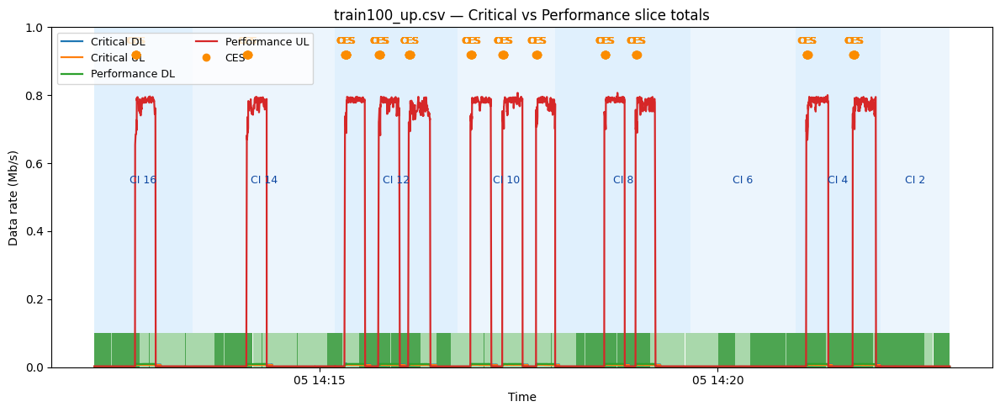

Saved: _base_train_runs/plots/train100_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


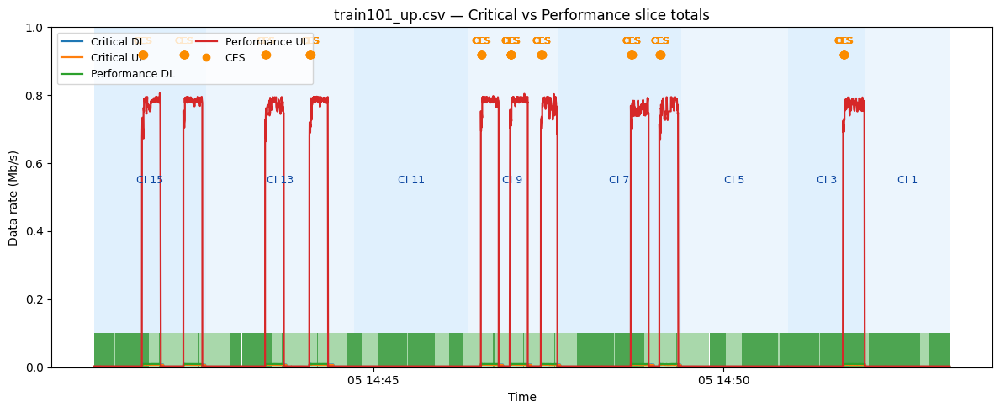

Saved: _base_train_runs/plots/train101_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


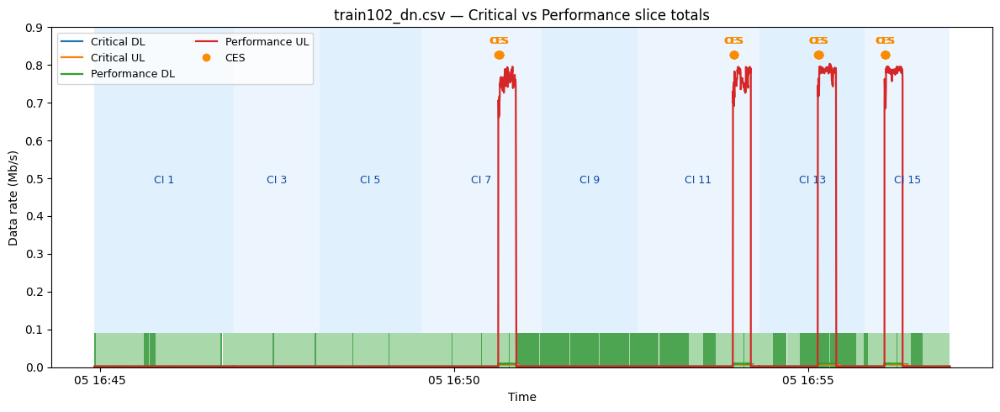

Saved: _base_train_runs/plots/train102_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


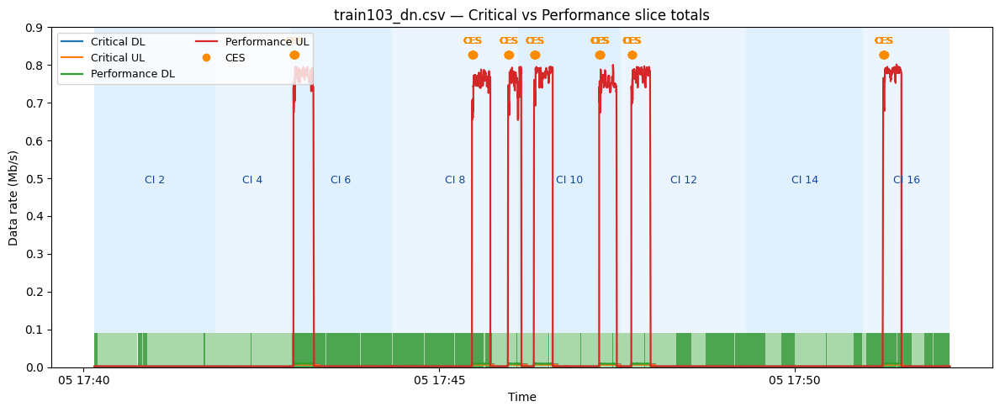

Saved: _base_train_runs/plots/train103_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


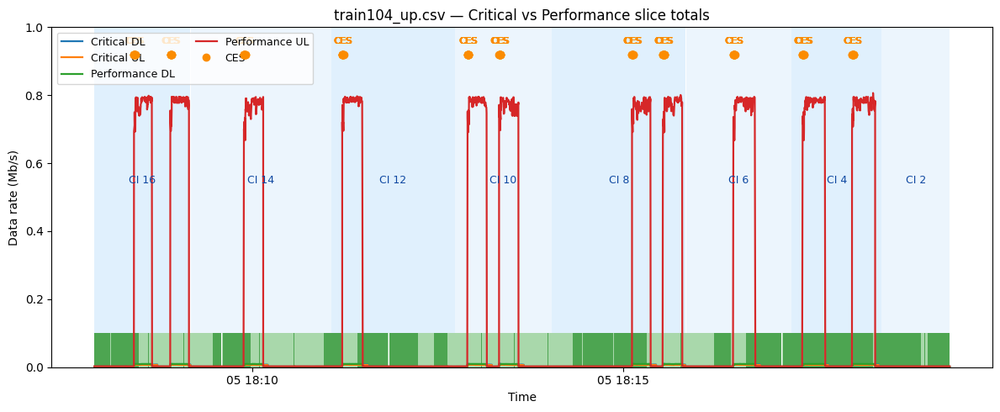

Saved: _base_train_runs/plots/train104_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


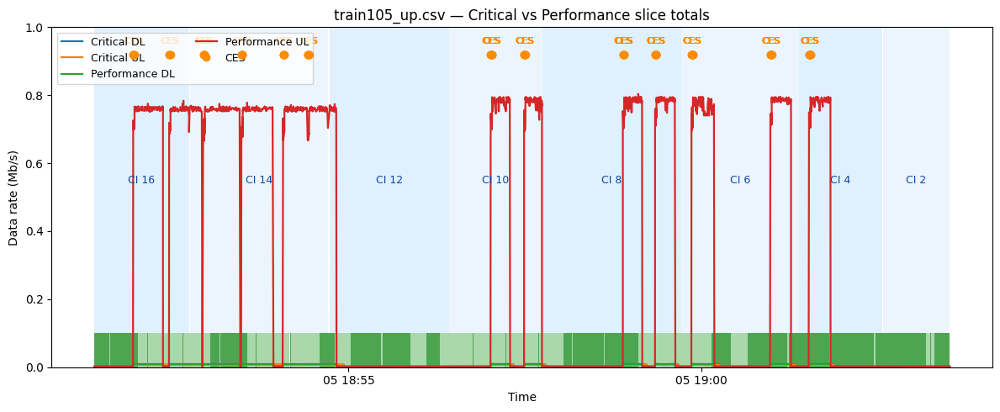

Saved: _base_train_runs/plots/train105_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


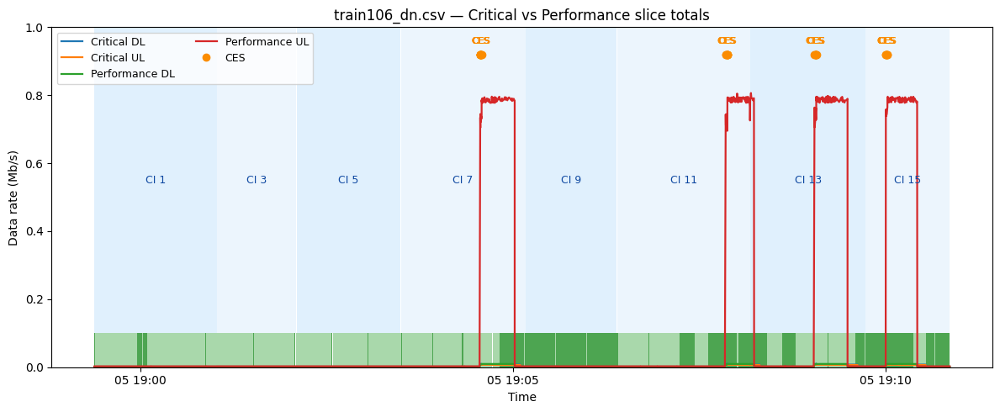

Saved: _base_train_runs/plots/train106_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


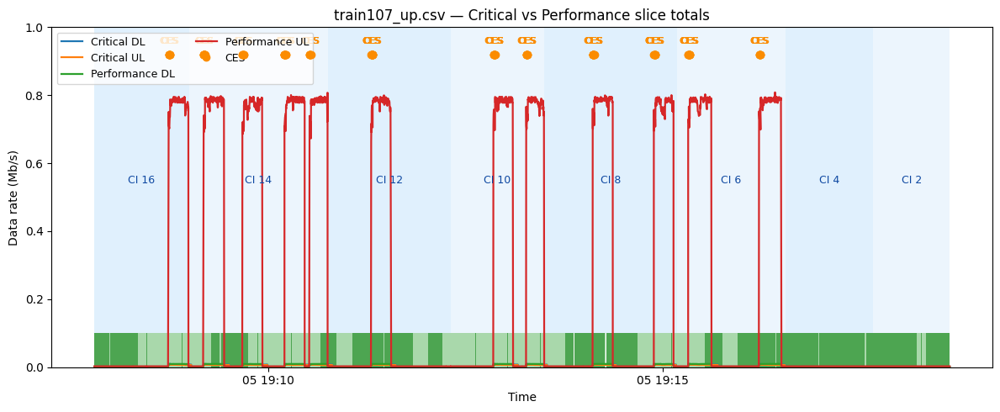

Saved: _base_train_runs/plots/train107_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


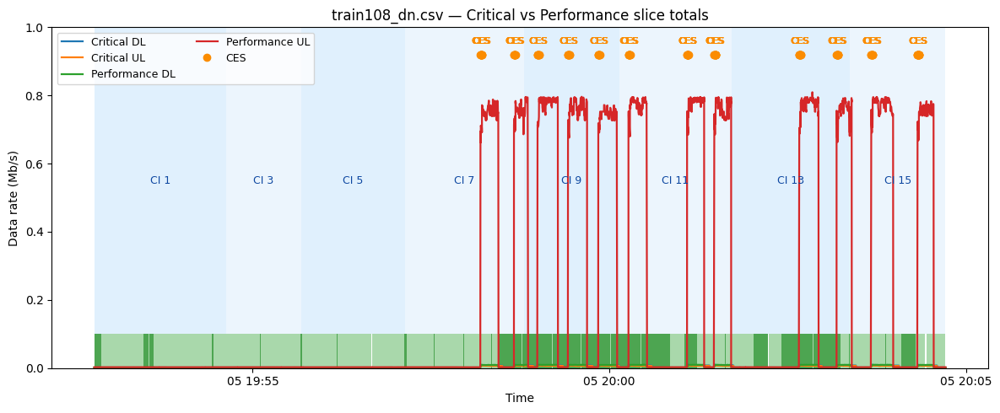

Saved: _base_train_runs/plots/train108_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


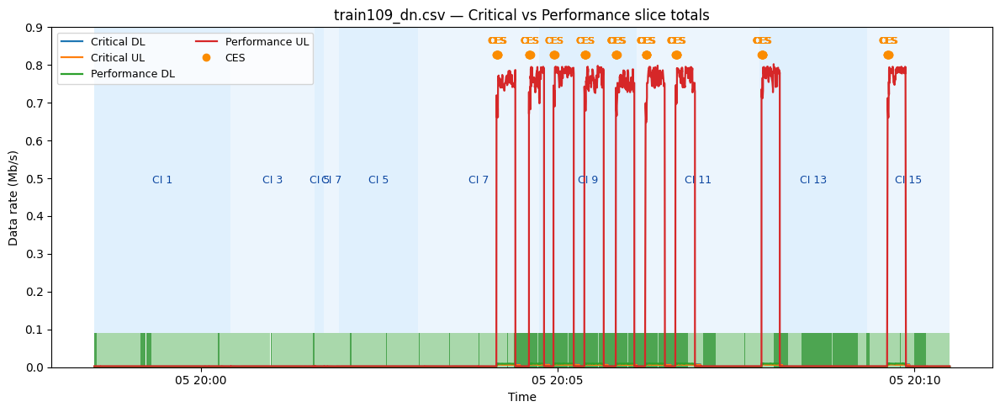

Saved: _base_train_runs/plots/train109_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


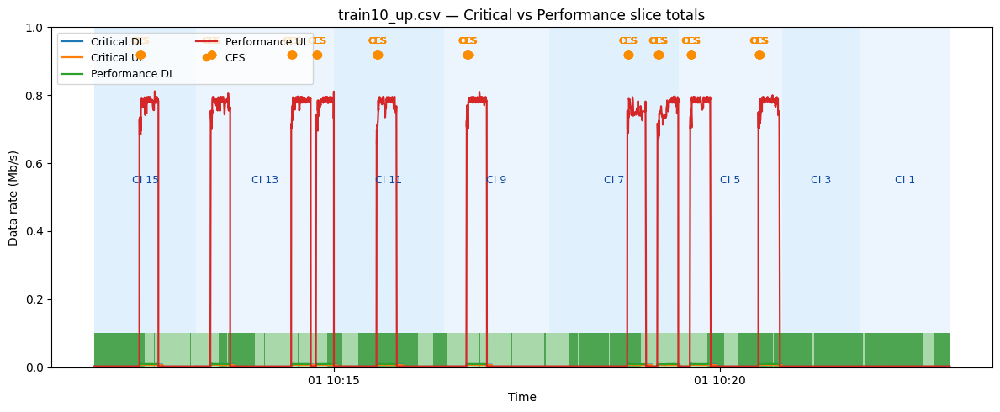

Saved: _base_train_runs/plots/train10_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


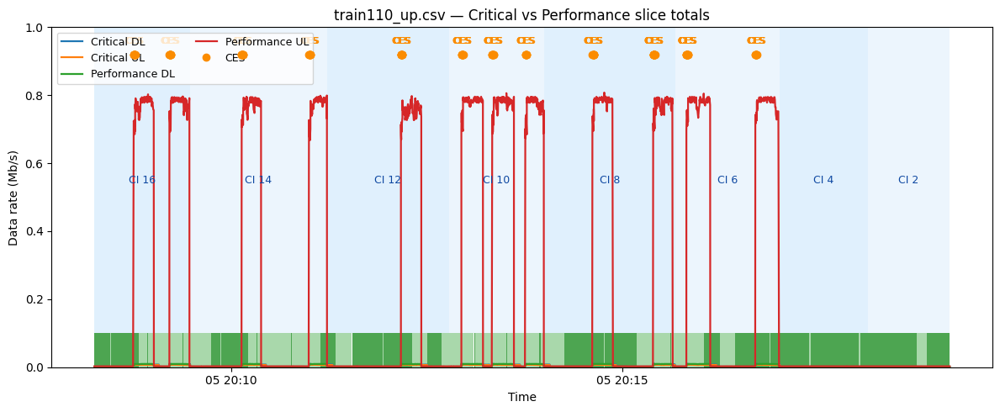

Saved: _base_train_runs/plots/train110_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


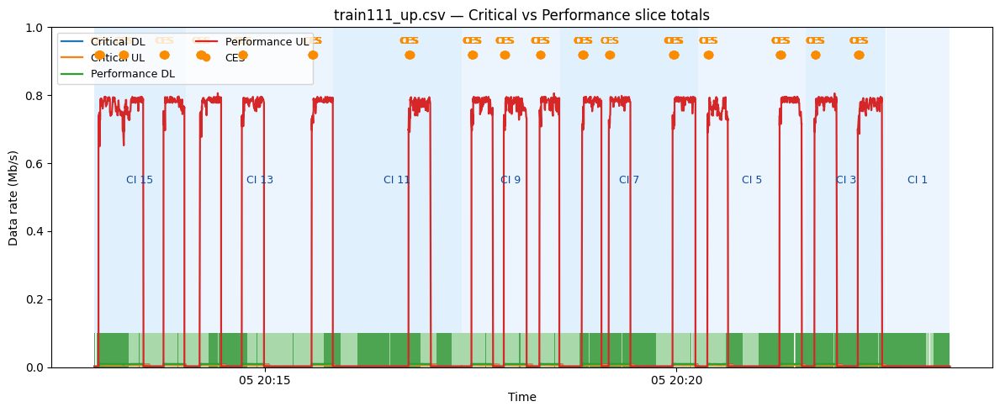

Saved: _base_train_runs/plots/train111_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


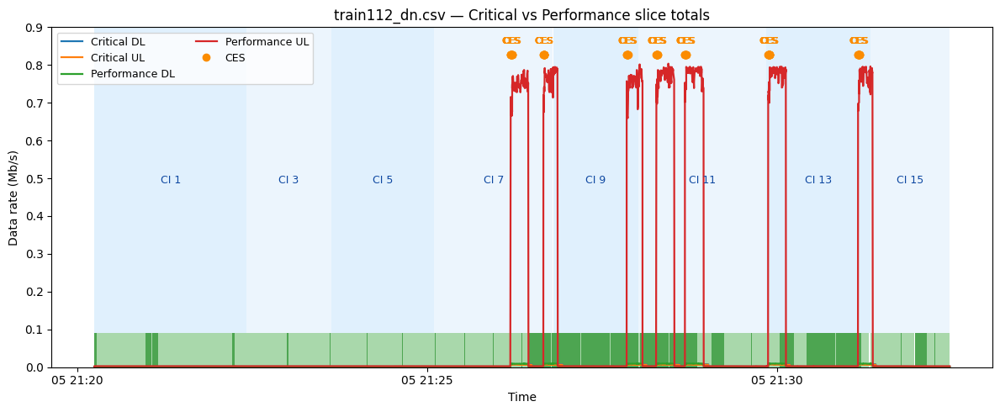

Saved: _base_train_runs/plots/train112_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


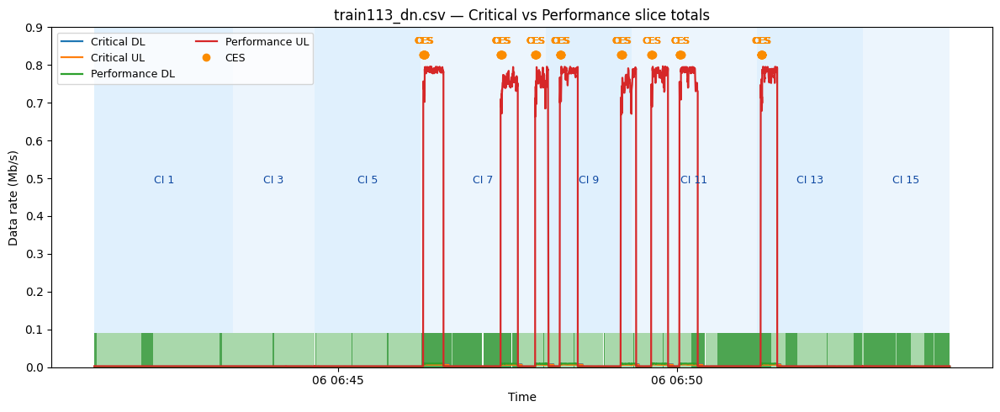

Saved: _base_train_runs/plots/train113_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


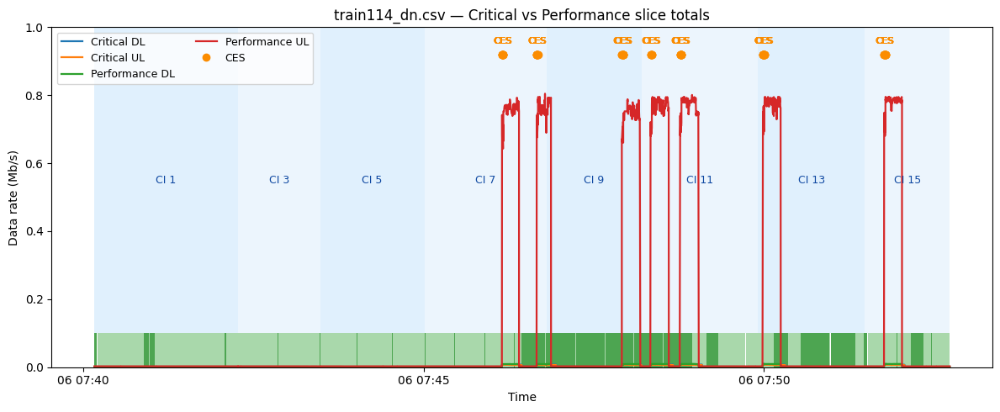

Saved: _base_train_runs/plots/train114_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


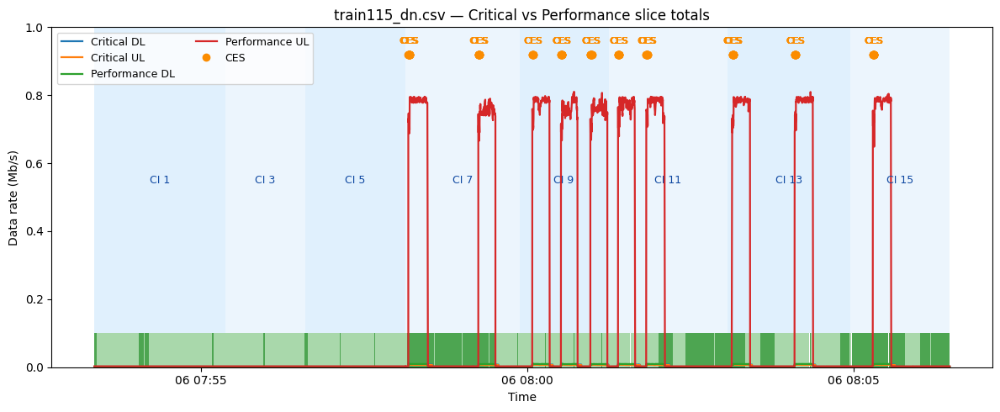

Saved: _base_train_runs/plots/train115_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


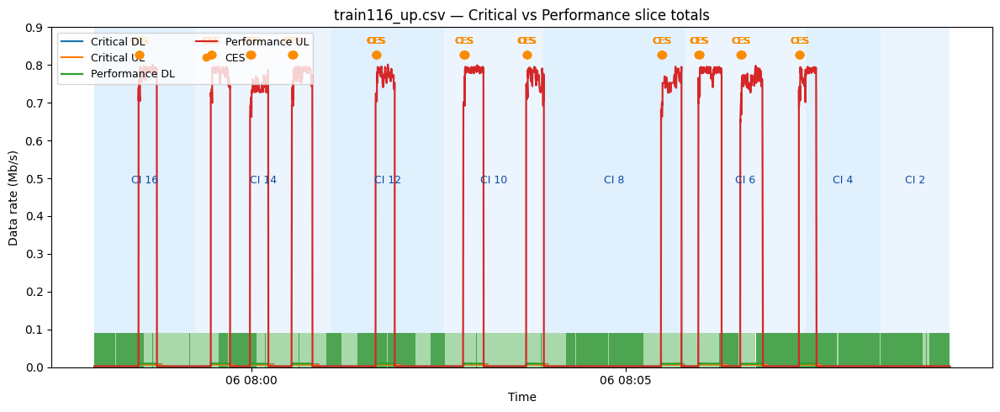

Saved: _base_train_runs/plots/train116_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


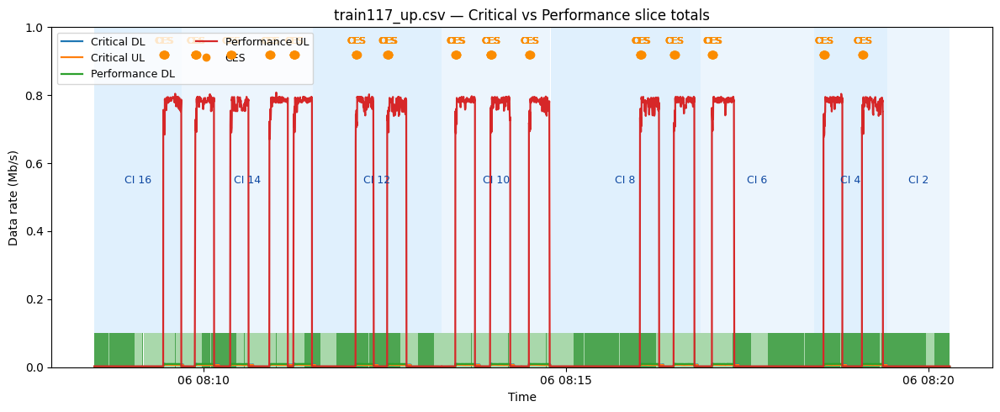

Saved: _base_train_runs/plots/train117_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


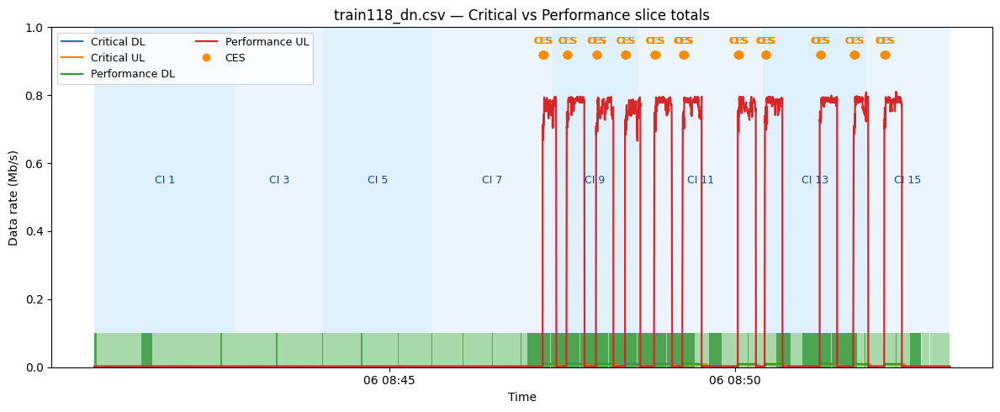

Saved: _base_train_runs/plots/train118_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


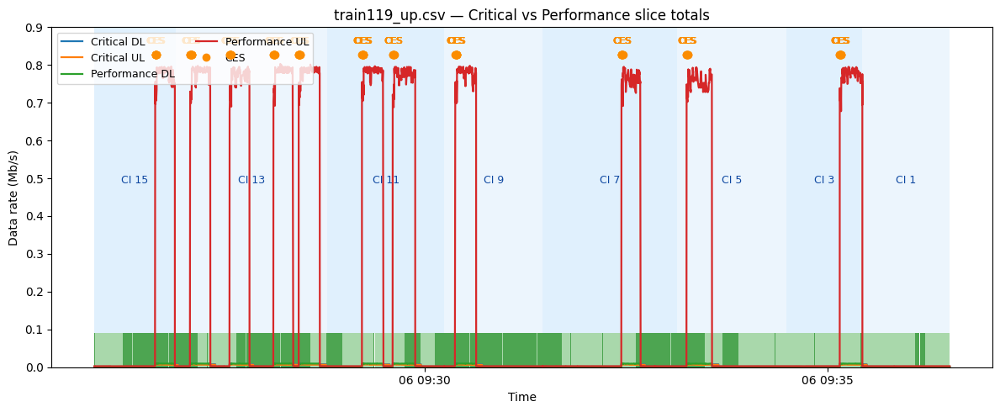

Saved: _base_train_runs/plots/train119_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


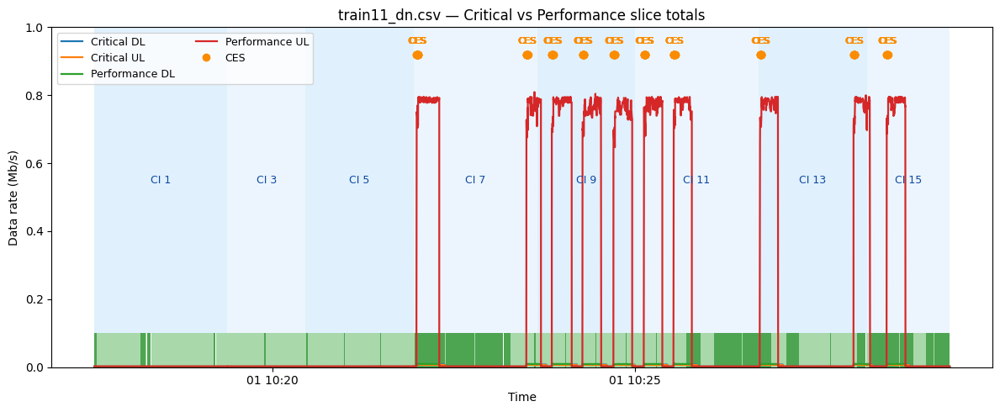

Saved: _base_train_runs/plots/train11_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


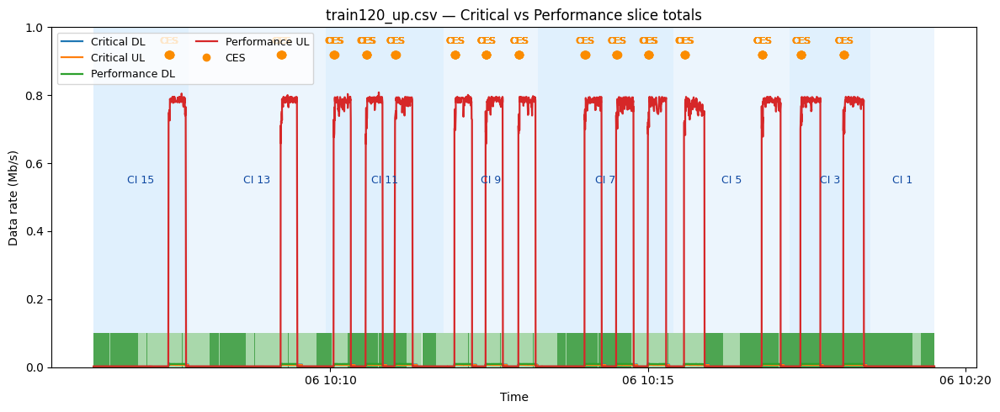

Saved: _base_train_runs/plots/train120_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


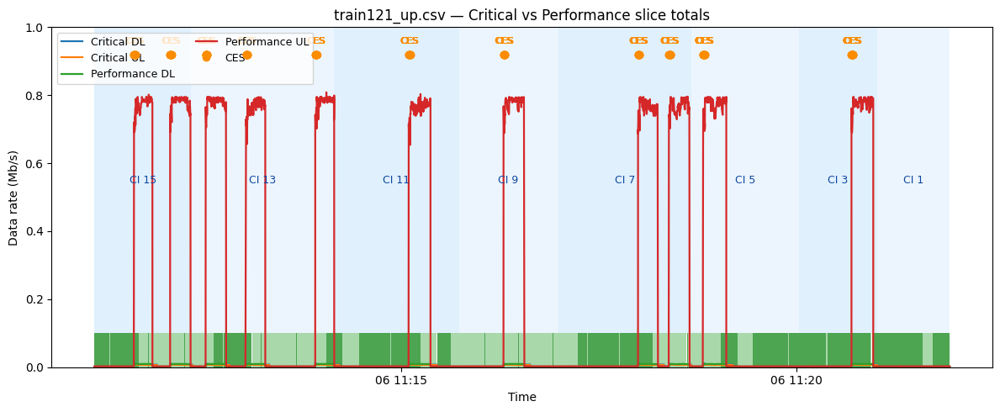

Saved: _base_train_runs/plots/train121_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


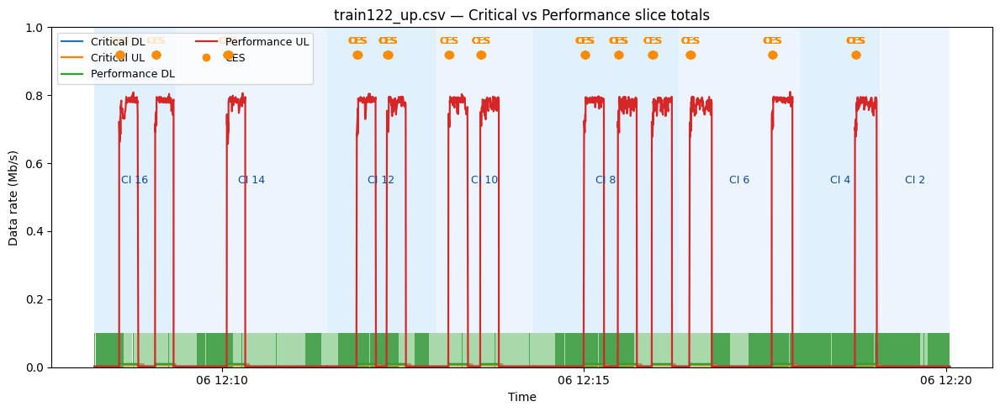

Saved: _base_train_runs/plots/train122_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


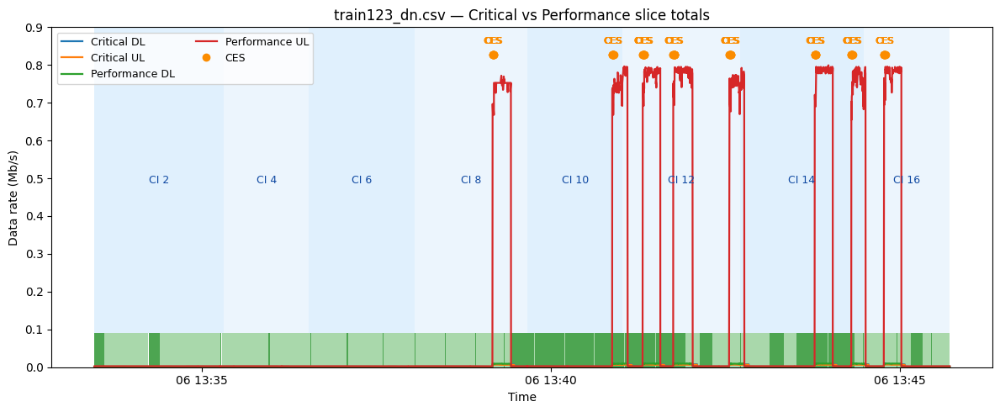

Saved: _base_train_runs/plots/train123_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


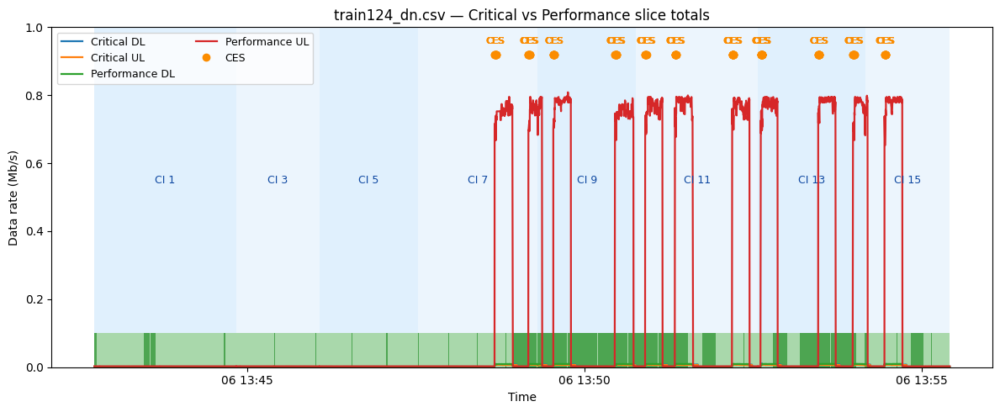

Saved: _base_train_runs/plots/train124_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


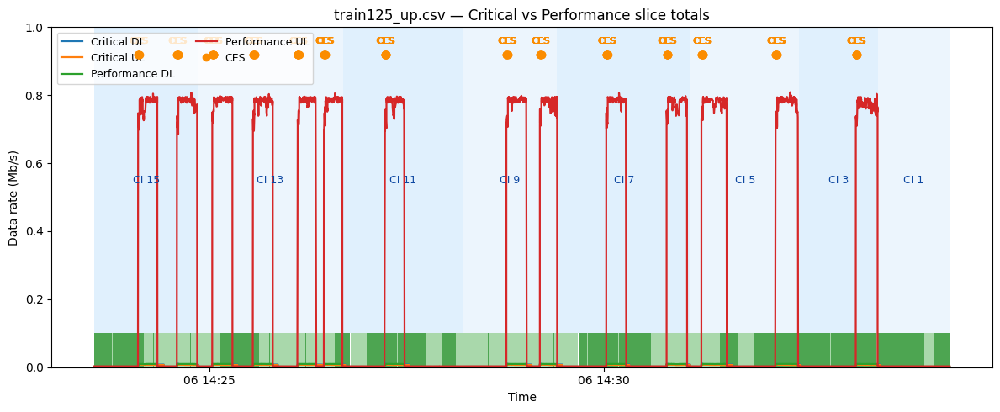

Saved: _base_train_runs/plots/train125_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


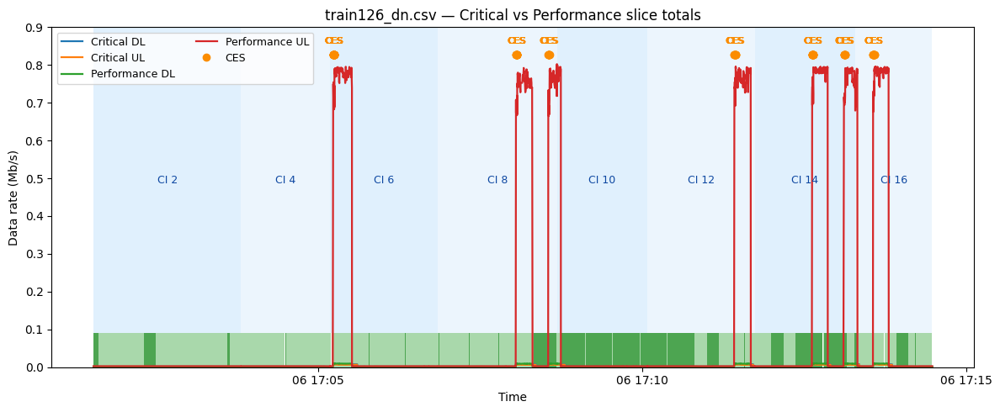

Saved: _base_train_runs/plots/train126_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


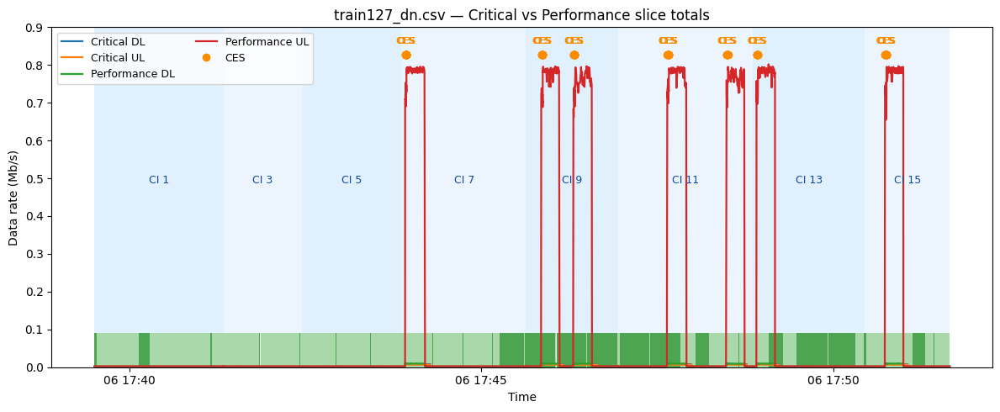

Saved: _base_train_runs/plots/train127_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


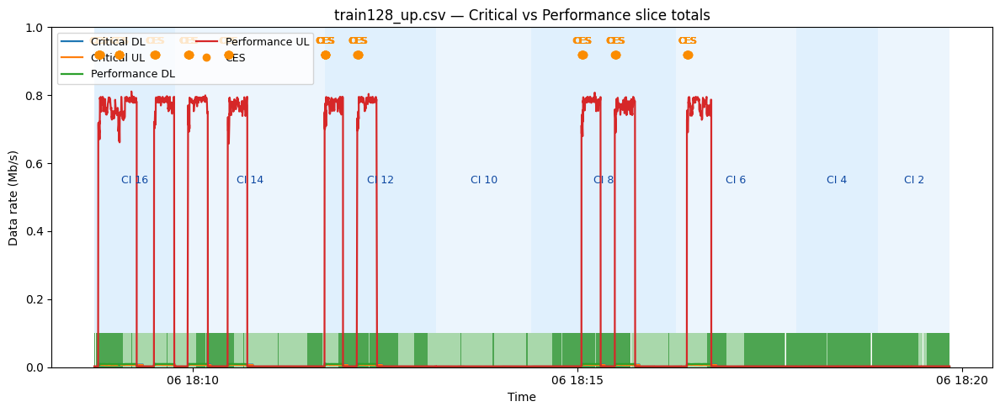

Saved: _base_train_runs/plots/train128_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


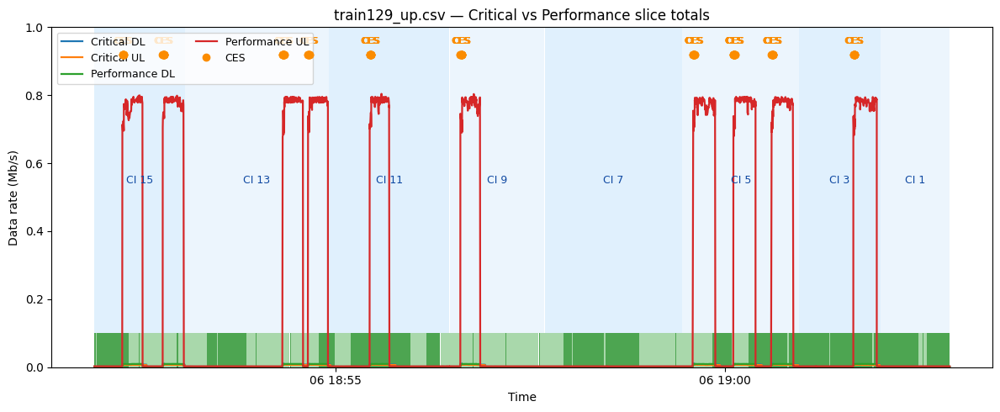

Saved: _base_train_runs/plots/train129_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


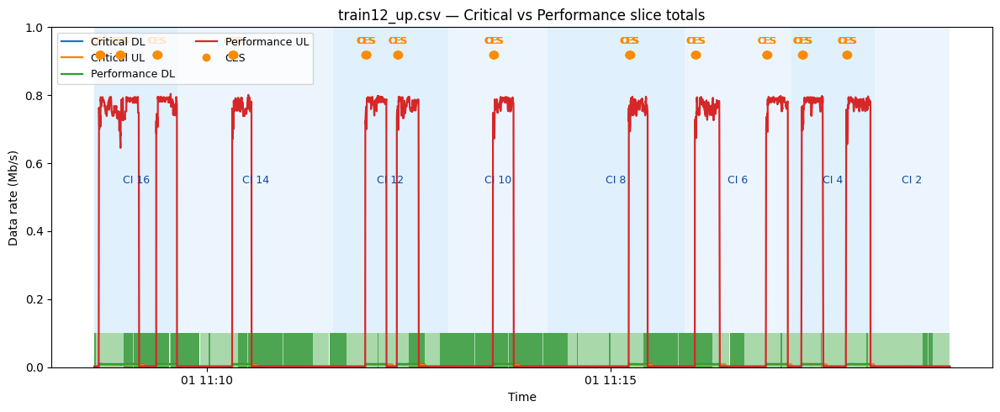

Saved: _base_train_runs/plots/train12_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


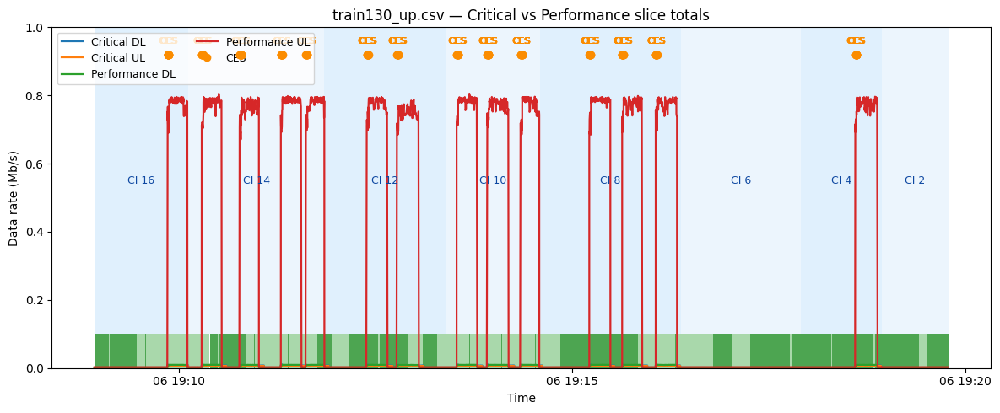

Saved: _base_train_runs/plots/train130_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


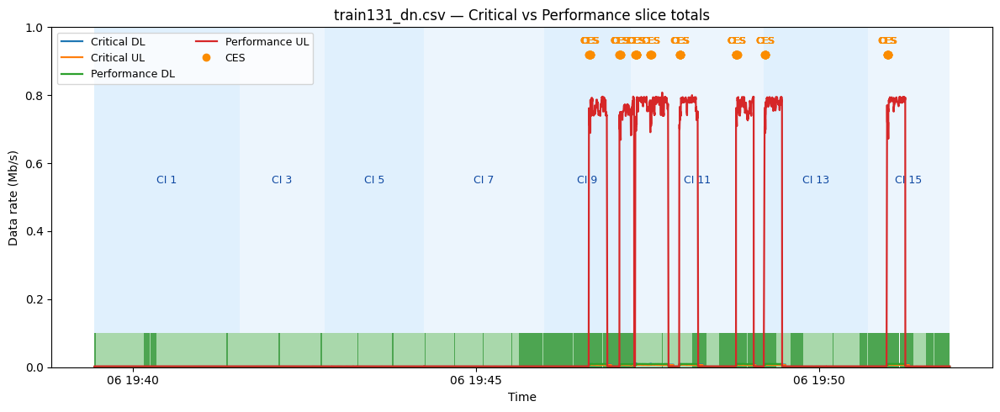

Saved: _base_train_runs/plots/train131_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


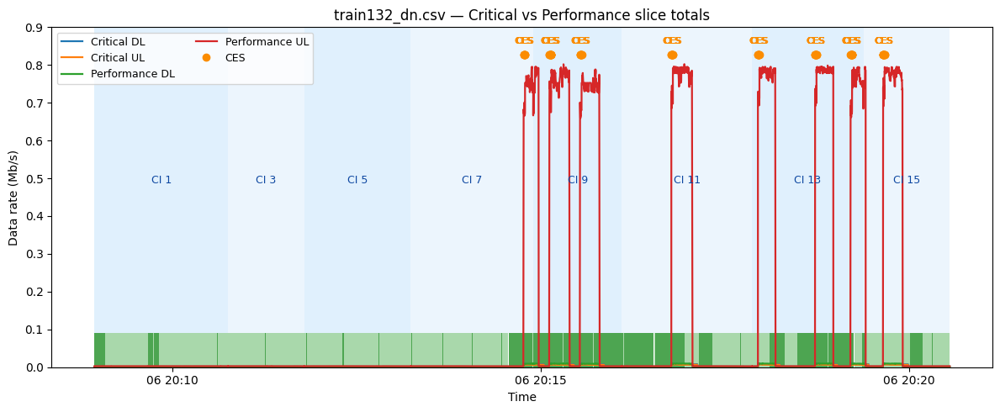

Saved: _base_train_runs/plots/train132_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


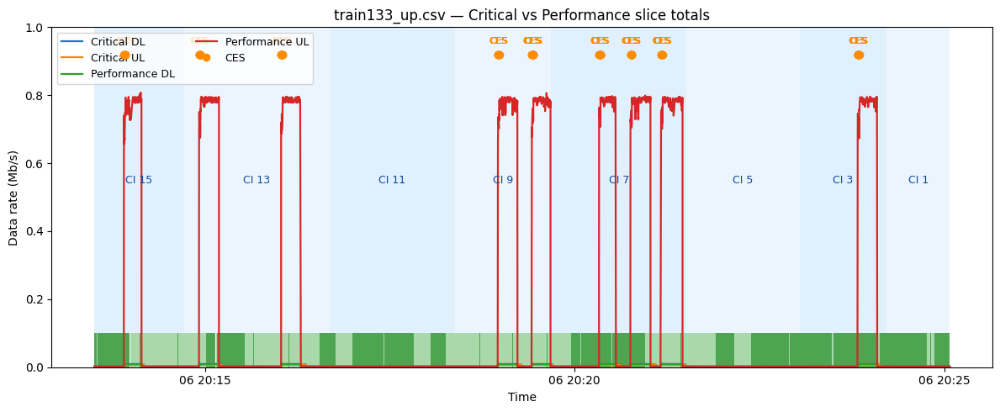

Saved: _base_train_runs/plots/train133_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


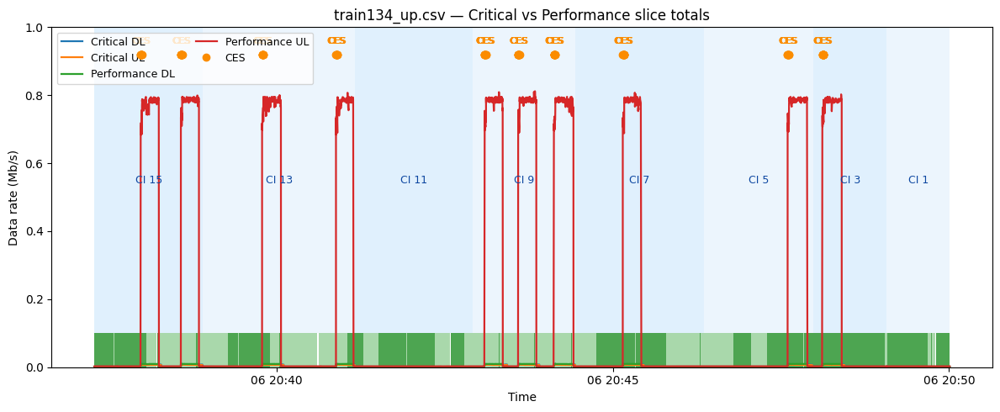

Saved: _base_train_runs/plots/train134_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


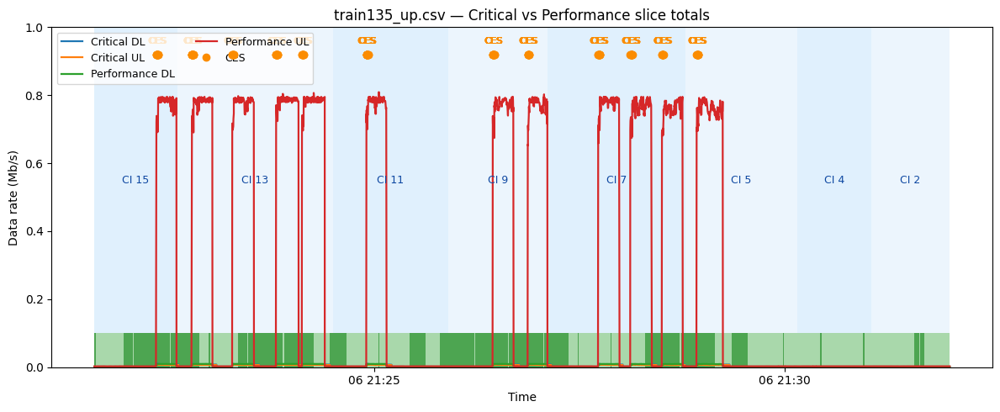

Saved: _base_train_runs/plots/train135_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


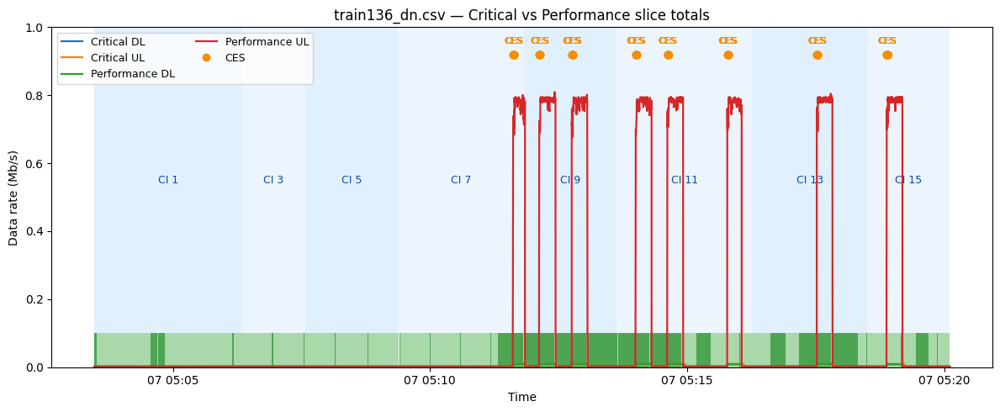

Saved: _base_train_runs/plots/train136_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


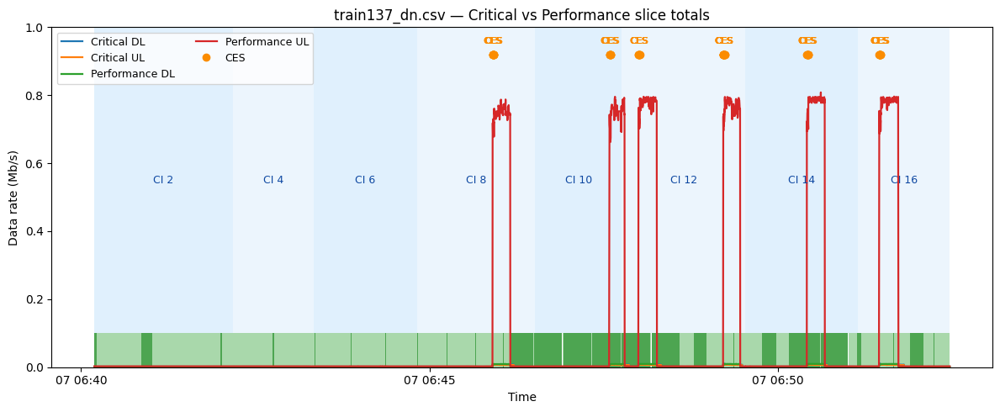

Saved: _base_train_runs/plots/train137_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


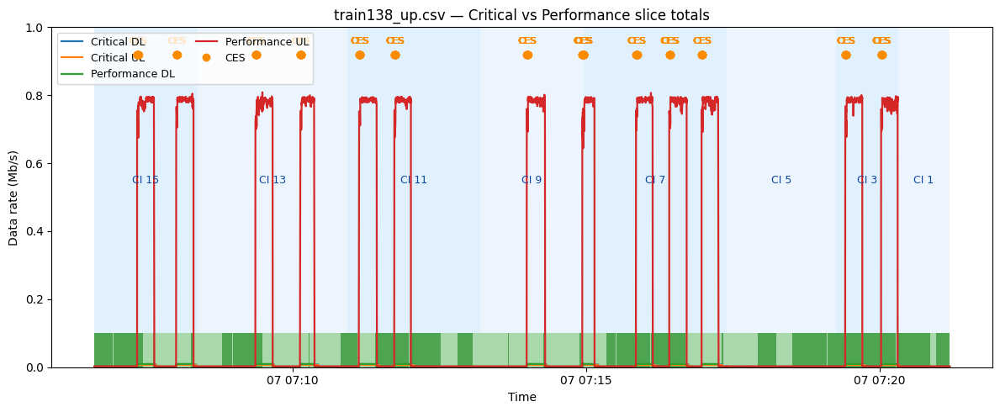

Saved: _base_train_runs/plots/train138_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


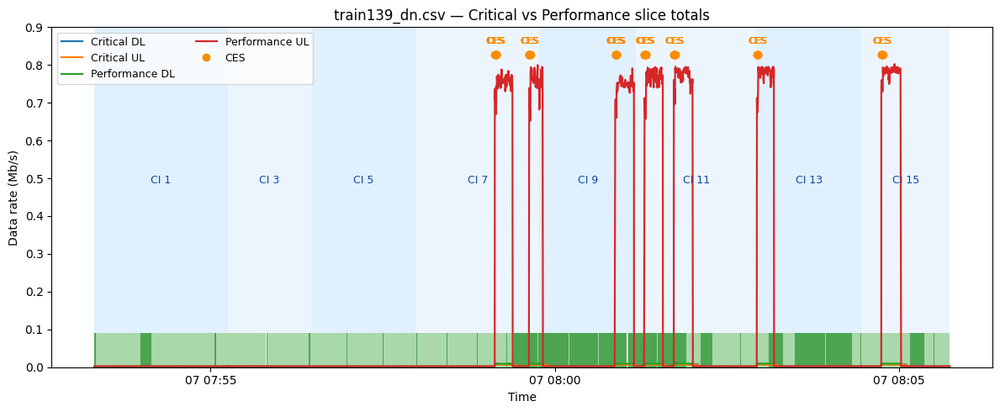

Saved: _base_train_runs/plots/train139_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


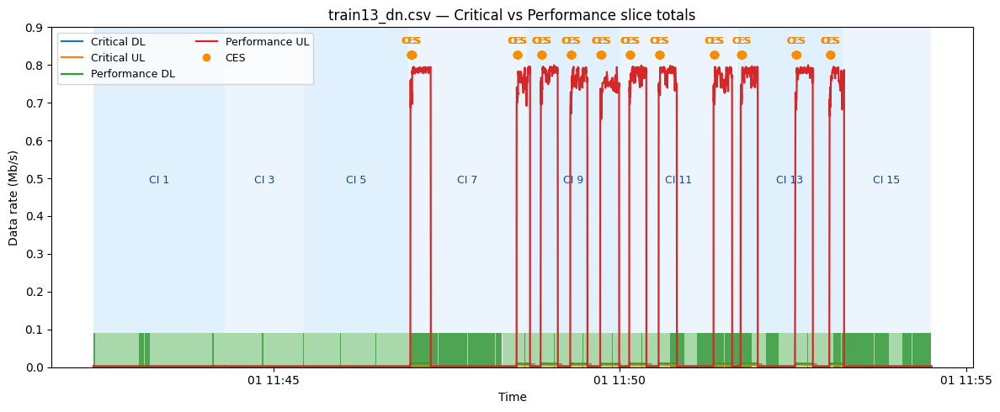

Saved: _base_train_runs/plots/train13_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


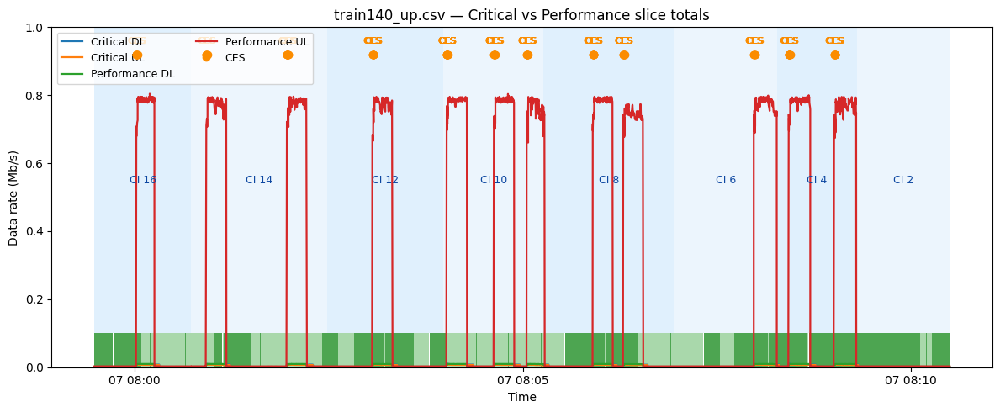

Saved: _base_train_runs/plots/train140_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


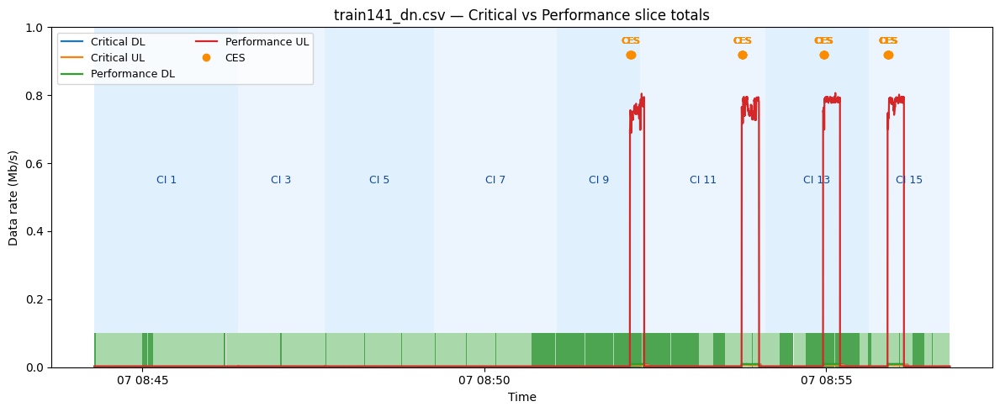

Saved: _base_train_runs/plots/train141_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


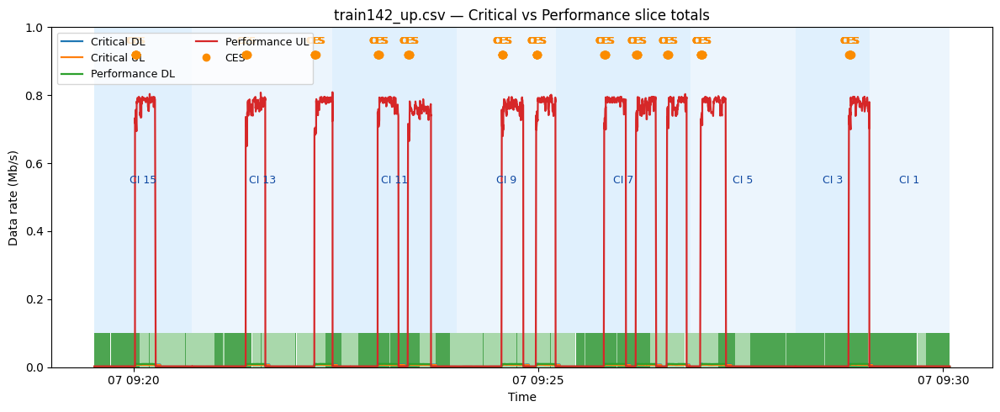

Saved: _base_train_runs/plots/train142_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


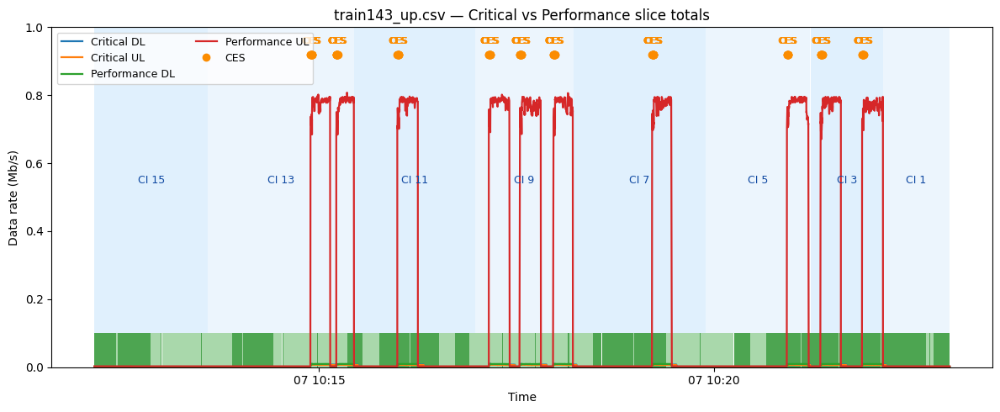

Saved: _base_train_runs/plots/train143_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


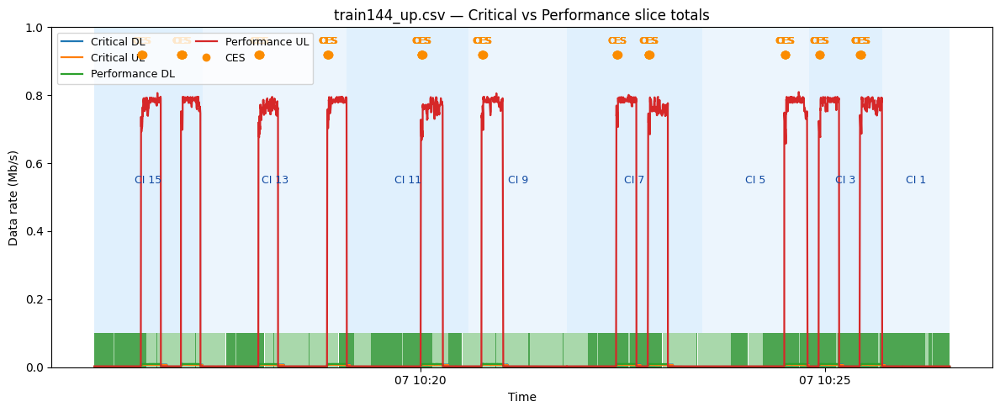

Saved: _base_train_runs/plots/train144_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


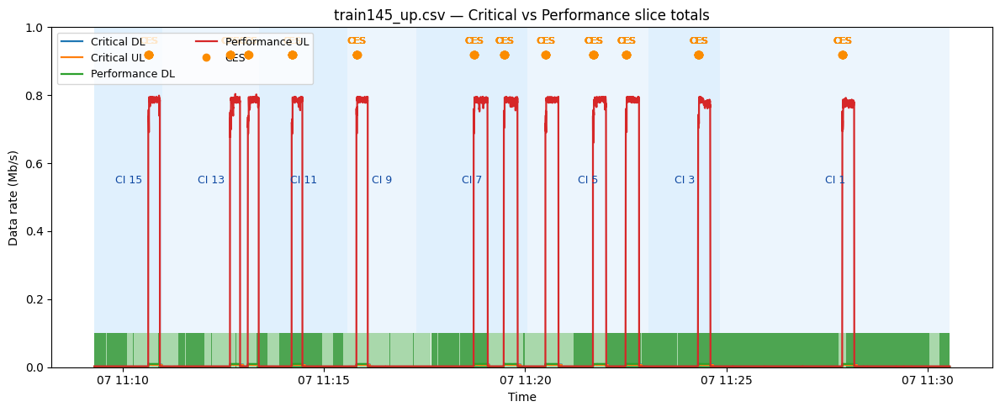

Saved: _base_train_runs/plots/train145_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


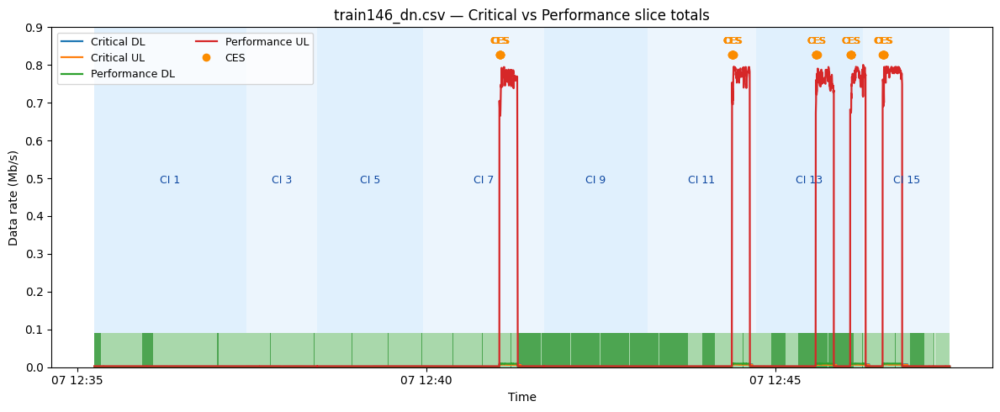

Saved: _base_train_runs/plots/train146_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


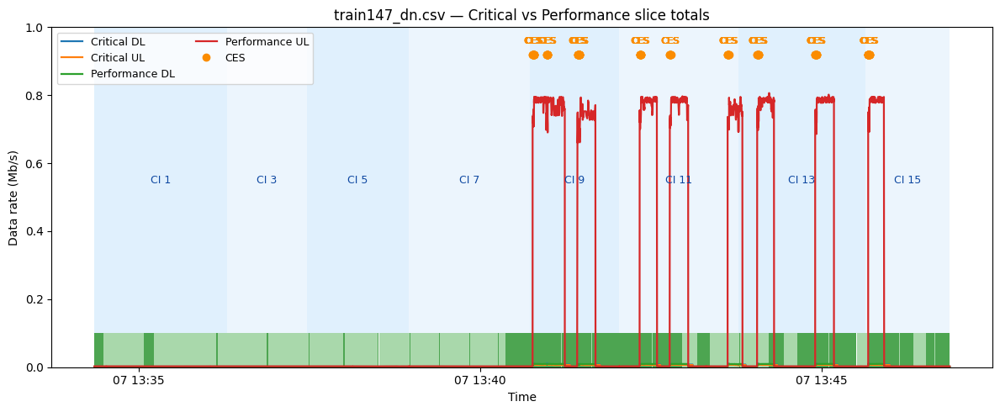

Saved: _base_train_runs/plots/train147_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


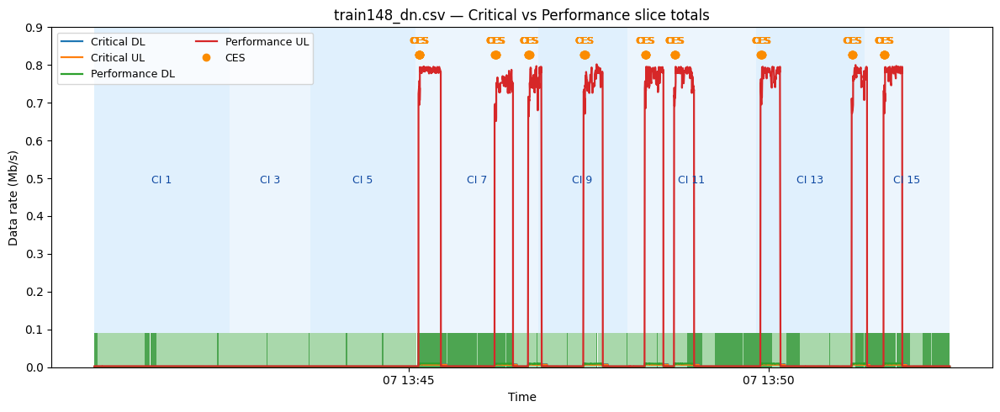

Saved: _base_train_runs/plots/train148_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


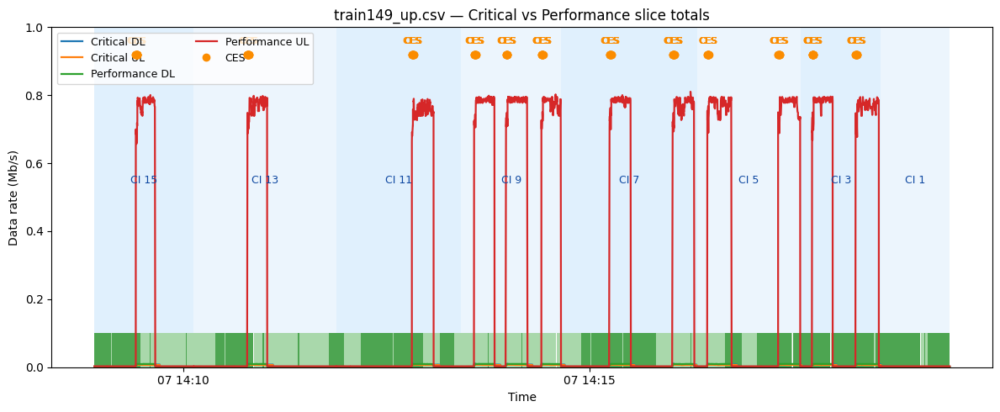

Saved: _base_train_runs/plots/train149_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


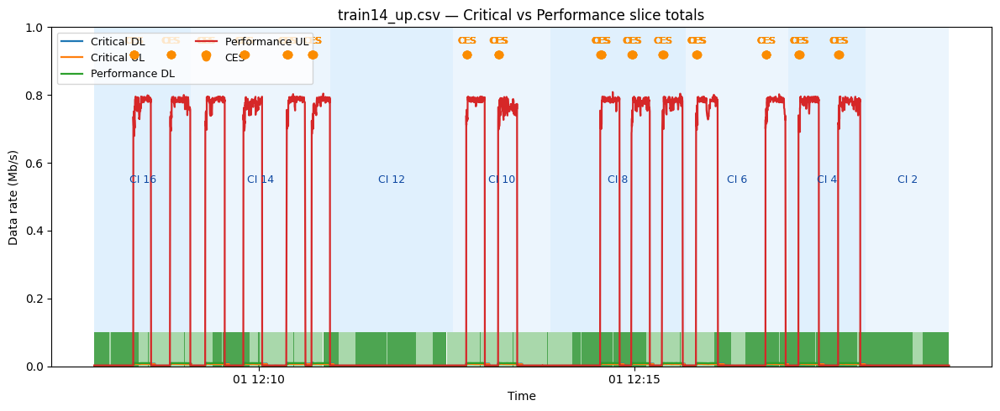

Saved: _base_train_runs/plots/train14_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


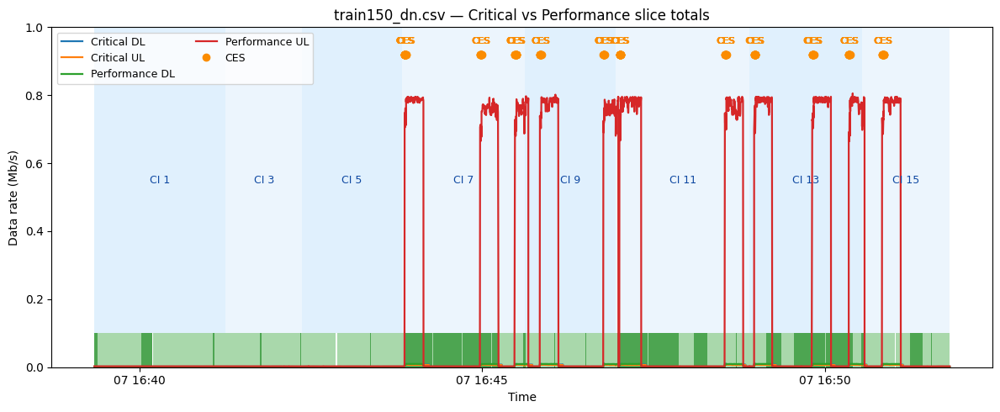

Saved: _base_train_runs/plots/train150_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


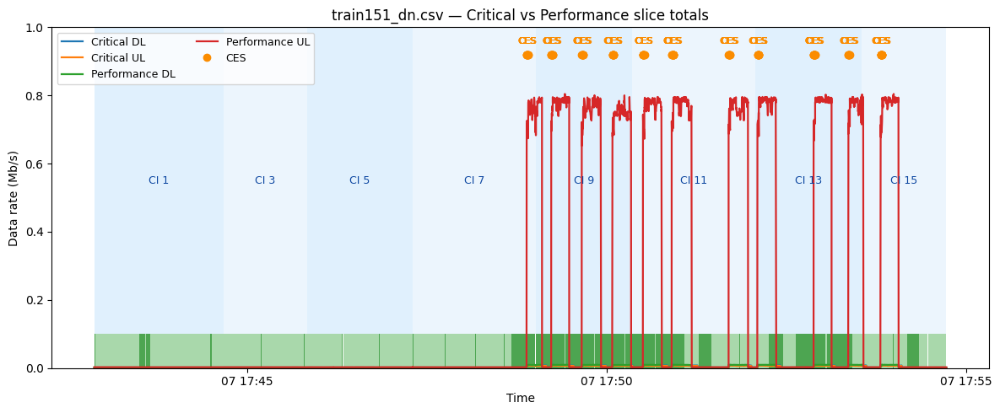

Saved: _base_train_runs/plots/train151_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


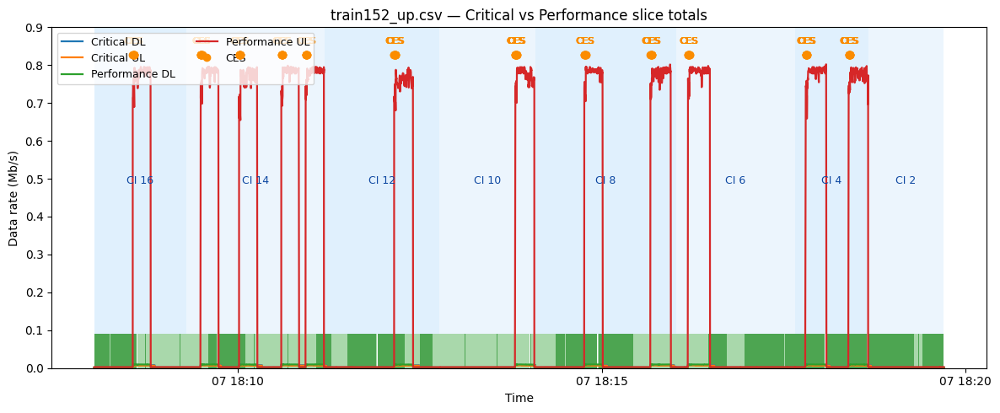

Saved: _base_train_runs/plots/train152_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


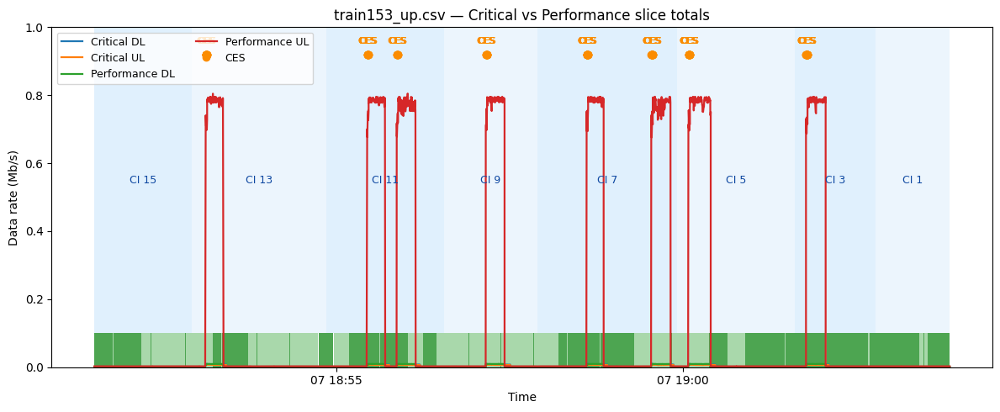

Saved: _base_train_runs/plots/train153_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


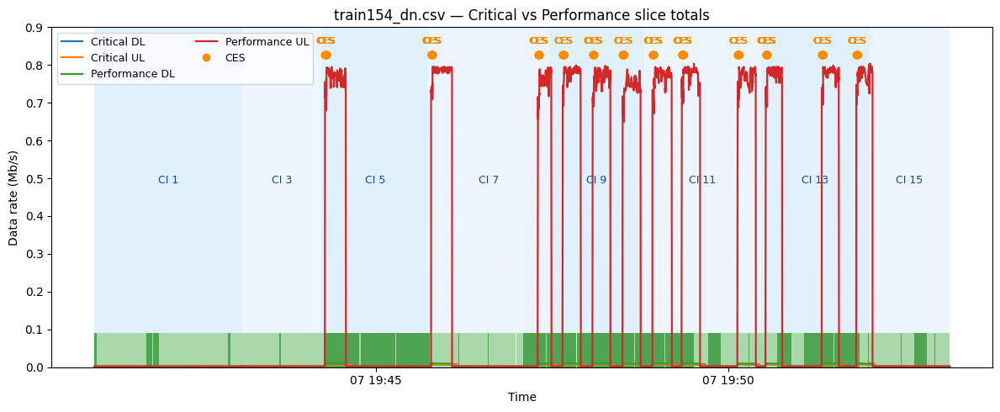

Saved: _base_train_runs/plots/train154_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


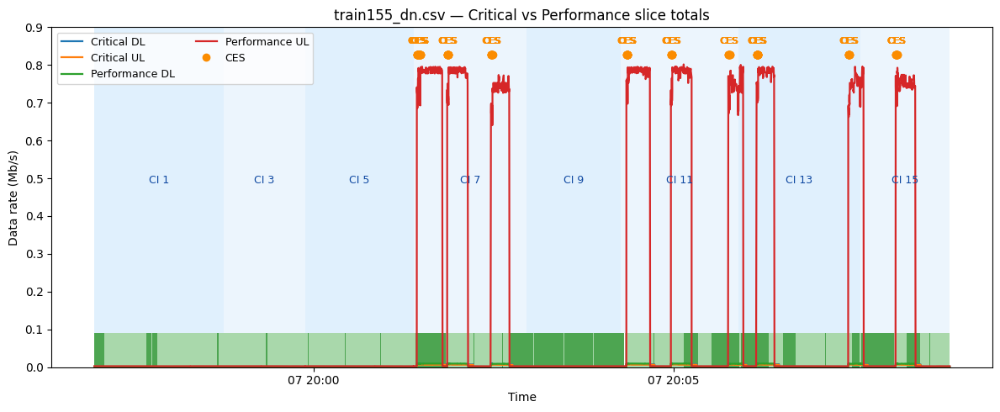

Saved: _base_train_runs/plots/train155_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


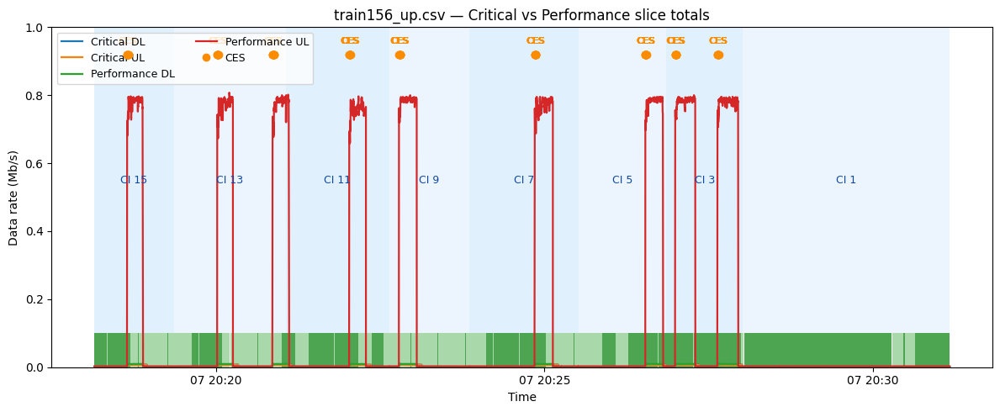

Saved: _base_train_runs/plots/train156_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


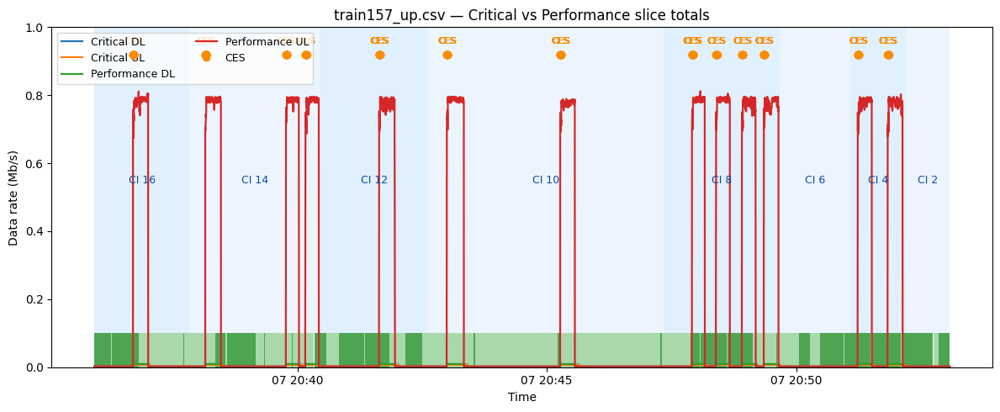

Saved: _base_train_runs/plots/train157_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


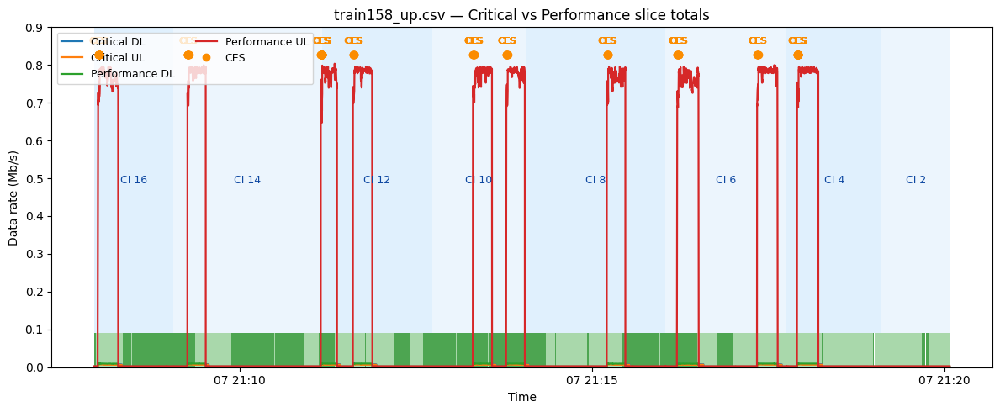

Saved: _base_train_runs/plots/train158_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


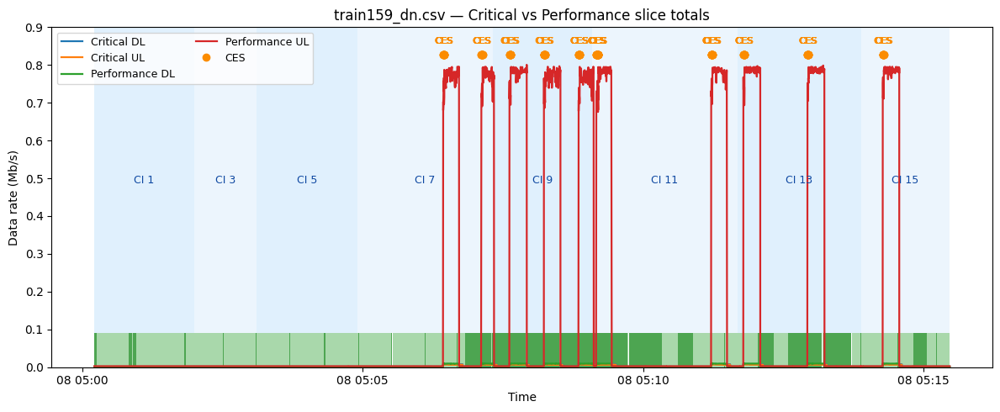

Saved: _base_train_runs/plots/train159_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


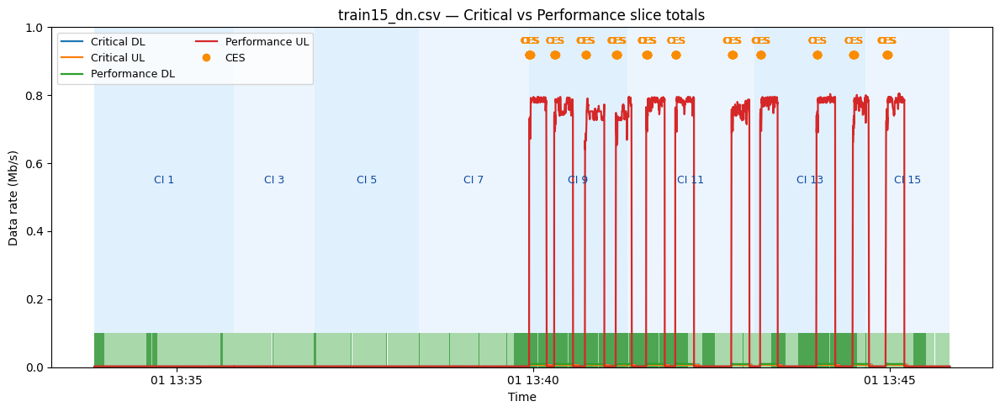

Saved: _base_train_runs/plots/train15_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


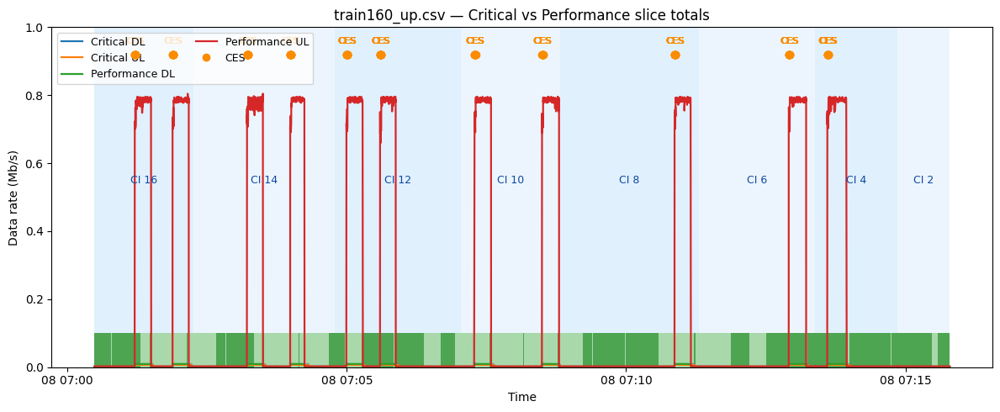

Saved: _base_train_runs/plots/train160_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


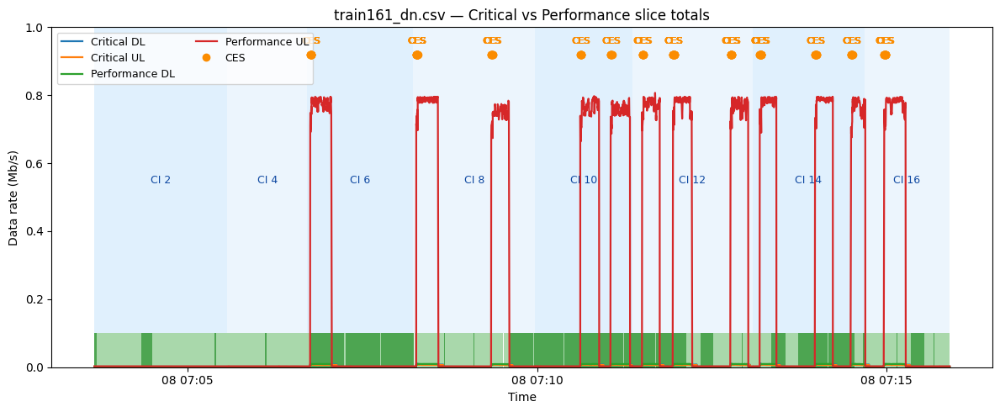

Saved: _base_train_runs/plots/train161_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


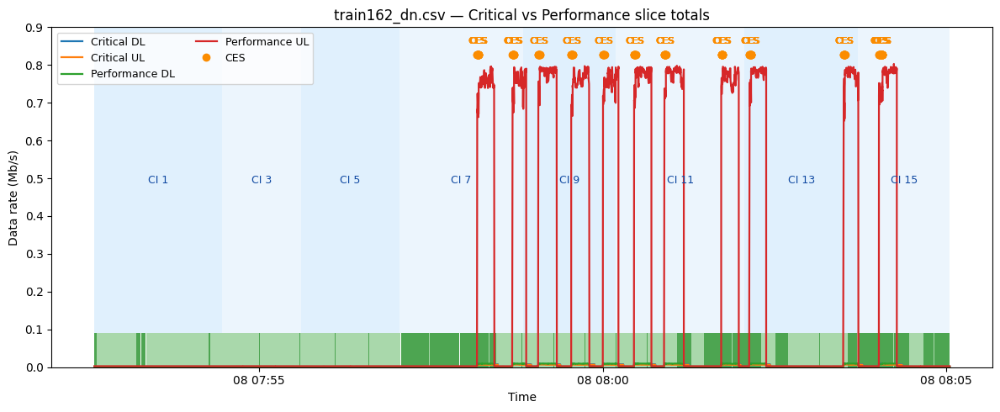

Saved: _base_train_runs/plots/train162_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


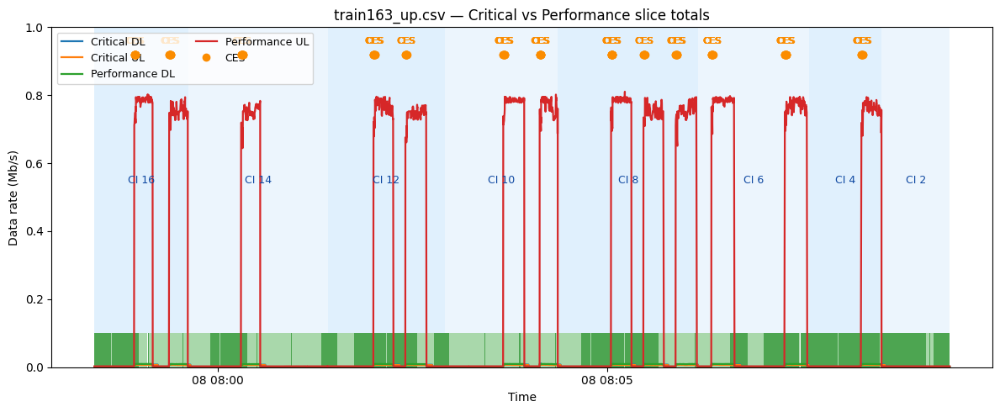

Saved: _base_train_runs/plots/train163_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


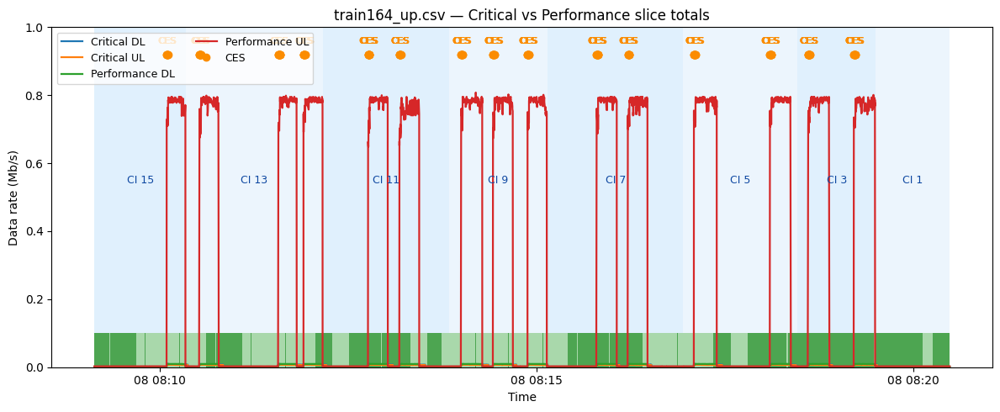

Saved: _base_train_runs/plots/train164_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


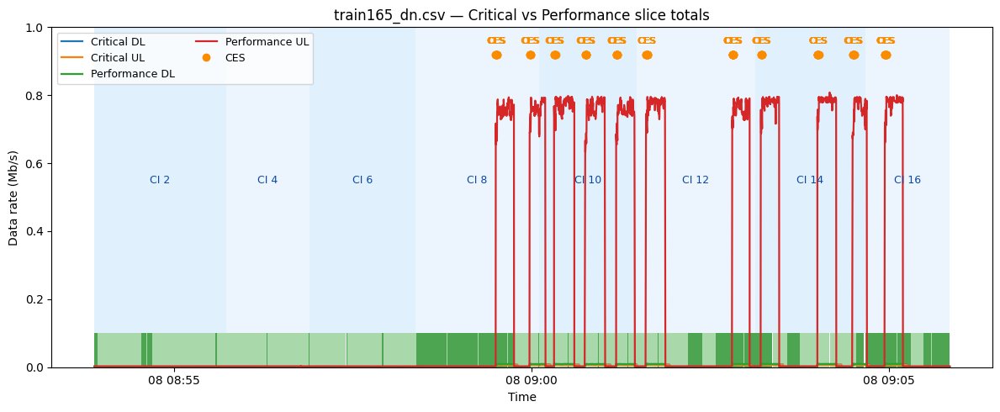

Saved: _base_train_runs/plots/train165_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


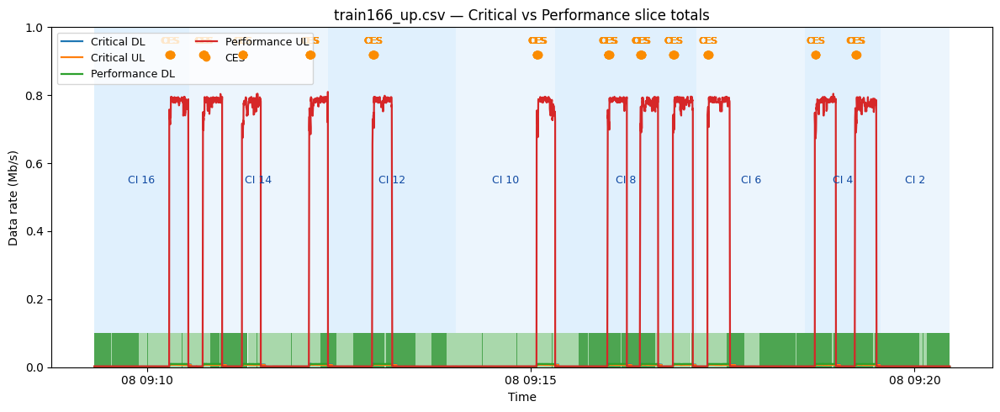

Saved: _base_train_runs/plots/train166_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


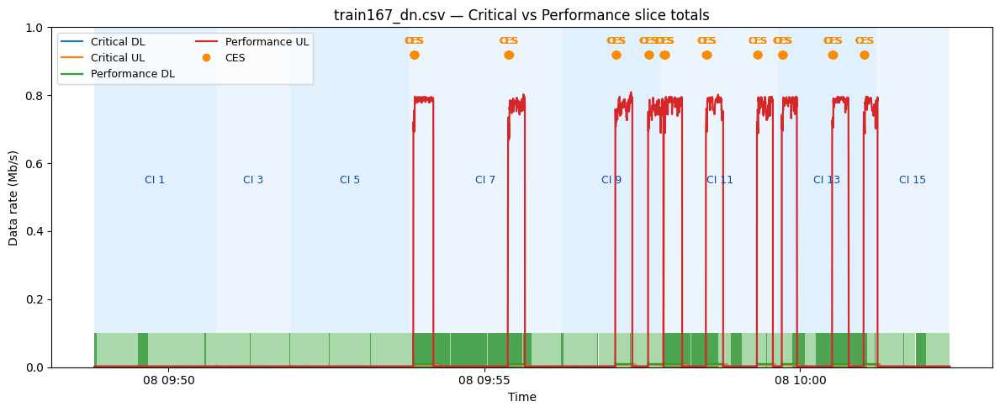

Saved: _base_train_runs/plots/train167_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


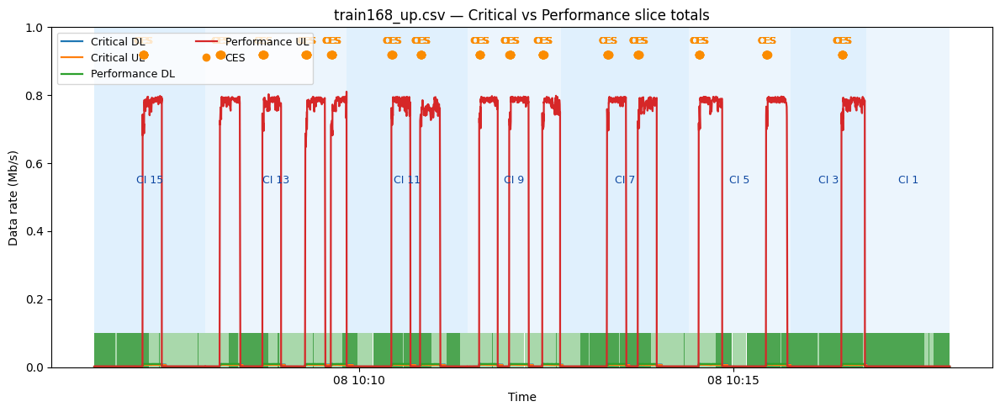

Saved: _base_train_runs/plots/train168_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


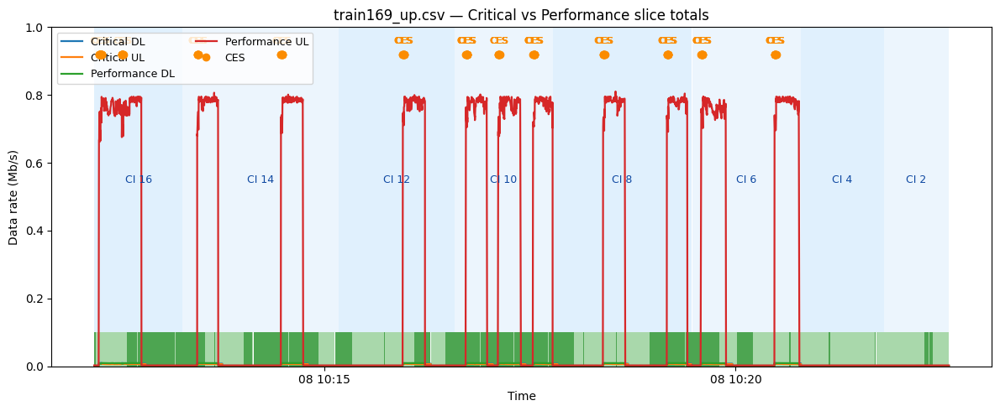

Saved: _base_train_runs/plots/train169_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


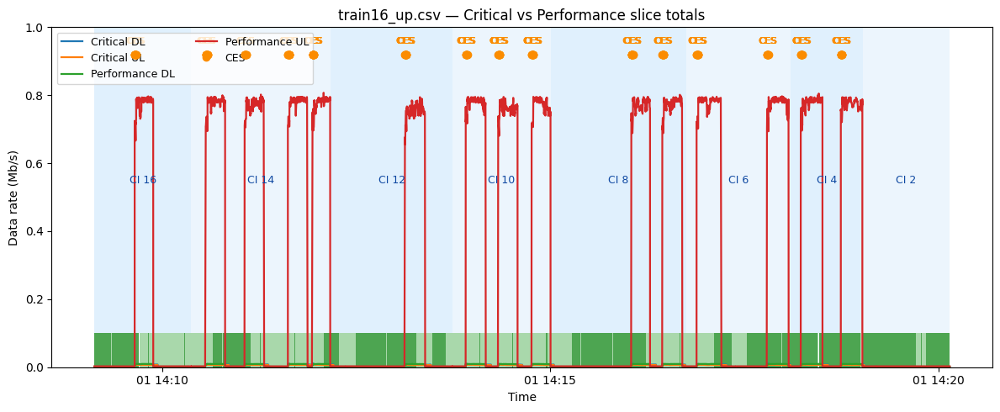

Saved: _base_train_runs/plots/train16_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


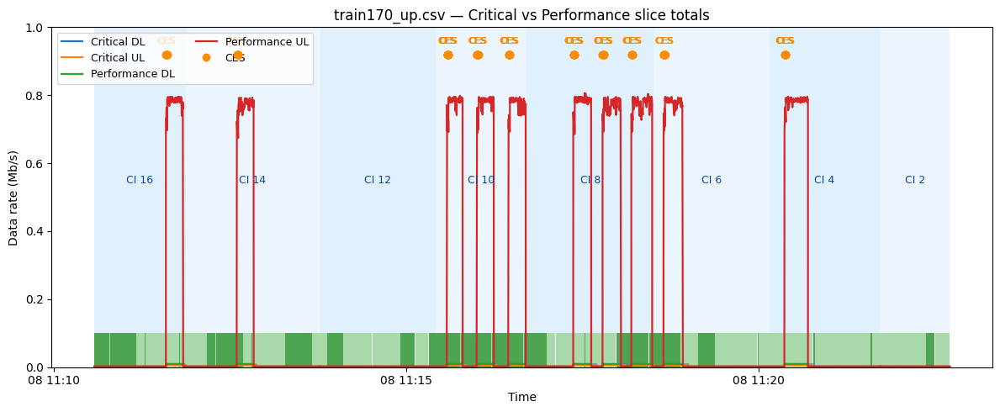

Saved: _base_train_runs/plots/train170_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


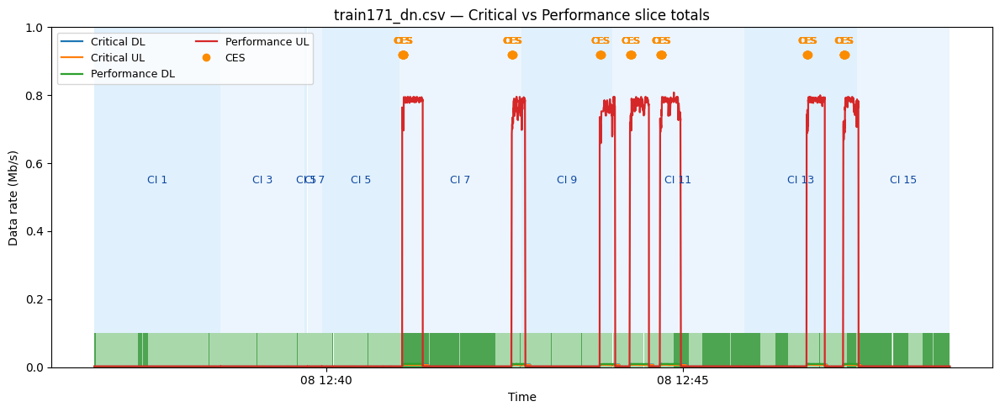

Saved: _base_train_runs/plots/train171_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


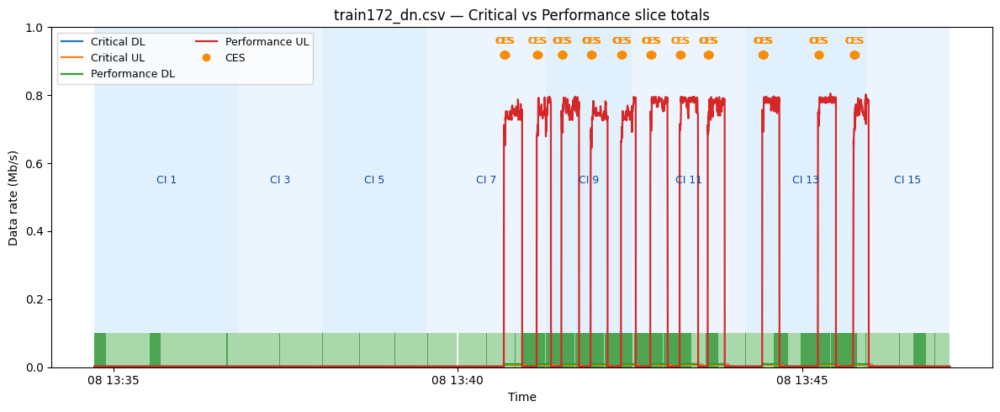

Saved: _base_train_runs/plots/train172_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


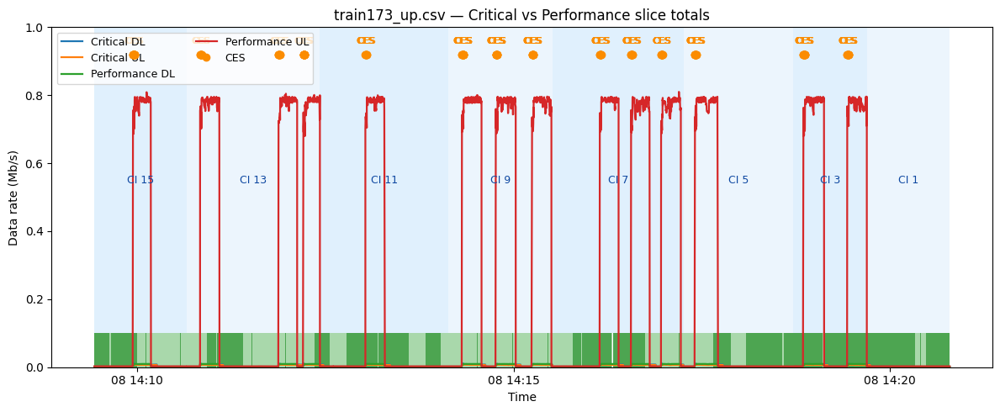

Saved: _base_train_runs/plots/train173_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


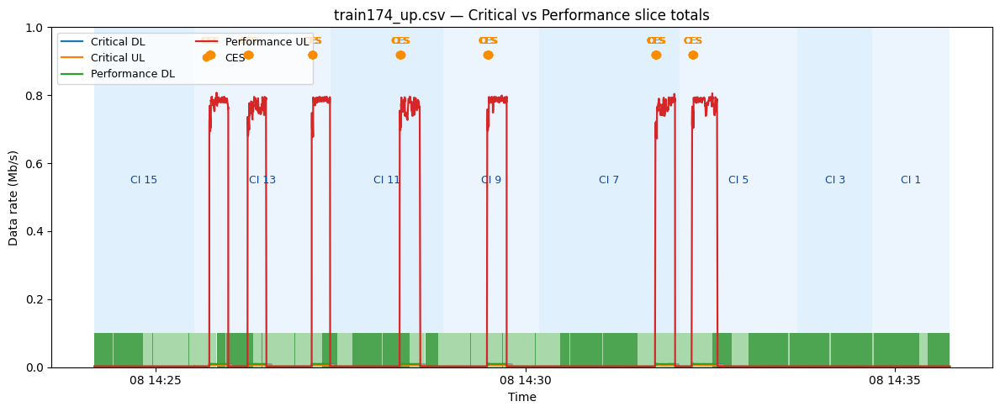

Saved: _base_train_runs/plots/train174_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


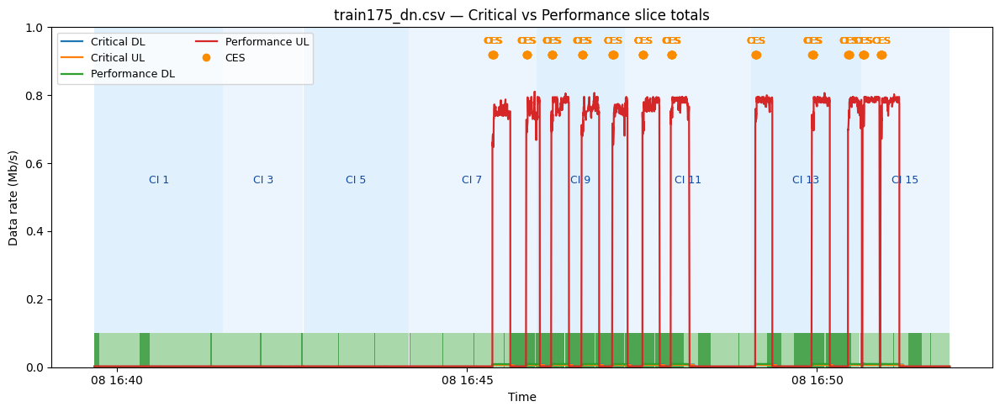

Saved: _base_train_runs/plots/train175_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


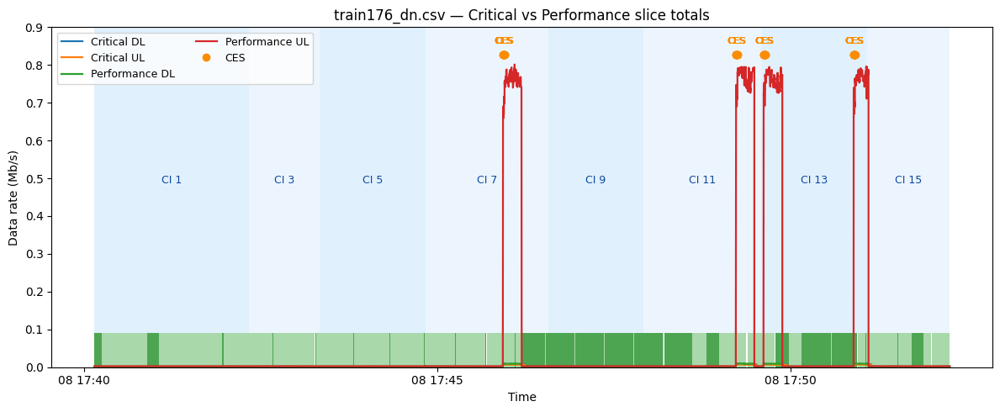

Saved: _base_train_runs/plots/train176_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


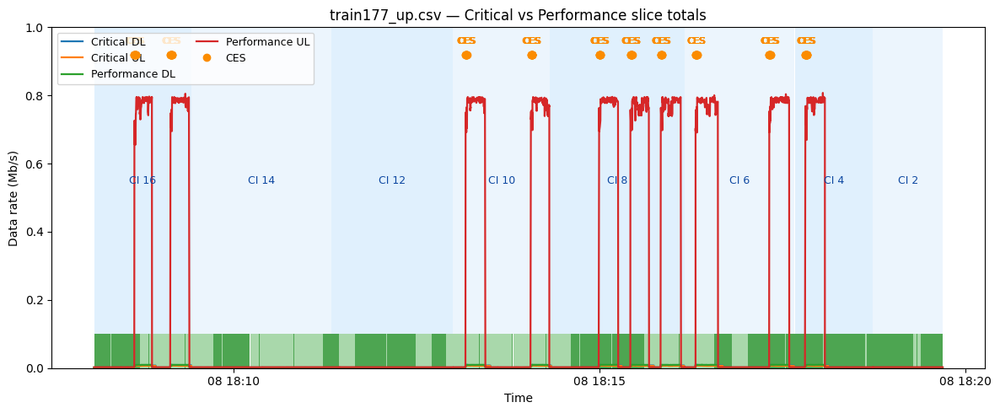

Saved: _base_train_runs/plots/train177_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


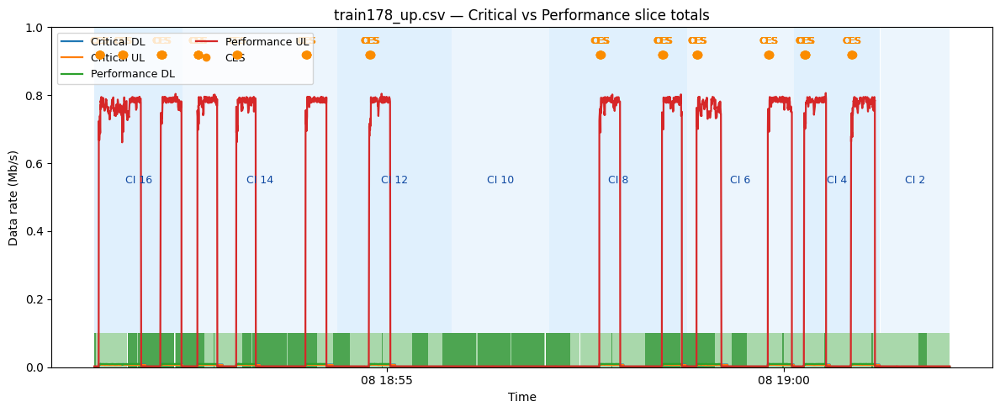

Saved: _base_train_runs/plots/train178_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


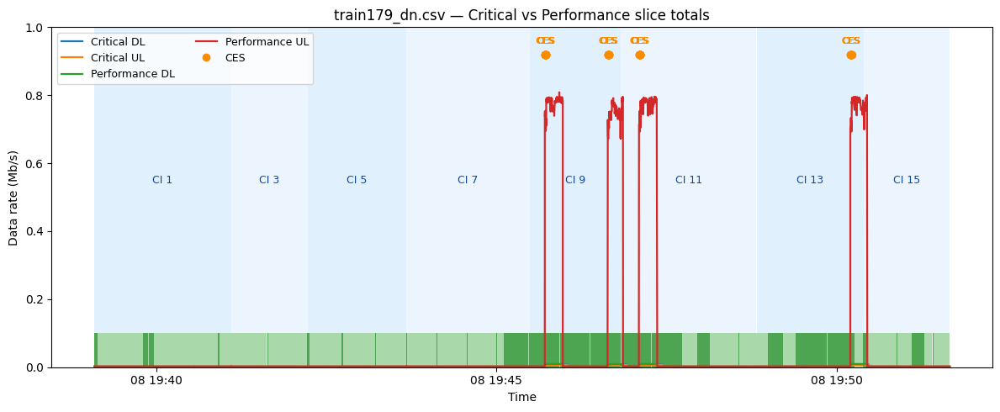

Saved: _base_train_runs/plots/train179_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


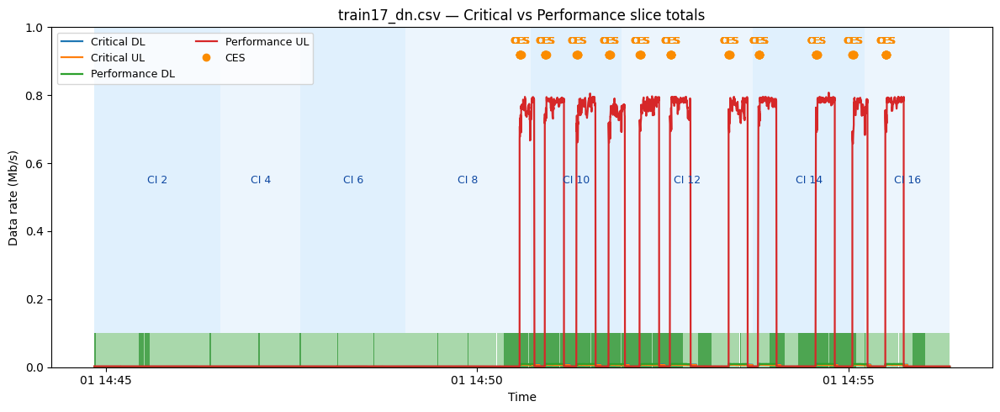

Saved: _base_train_runs/plots/train17_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


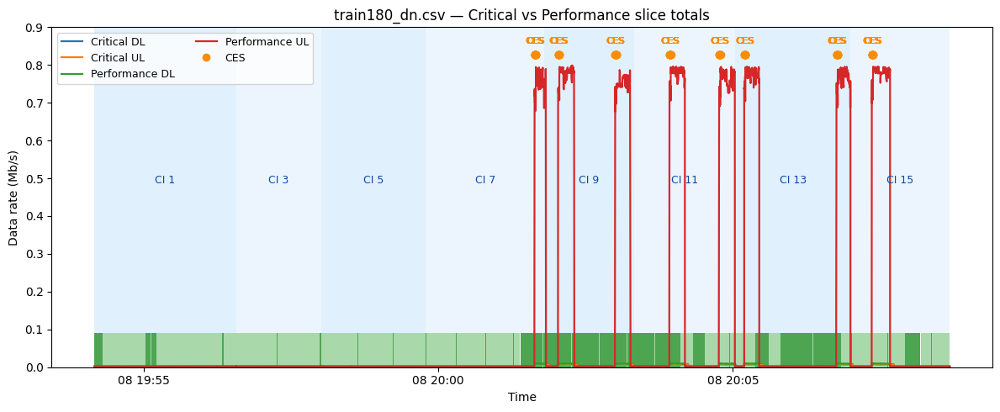

Saved: _base_train_runs/plots/train180_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


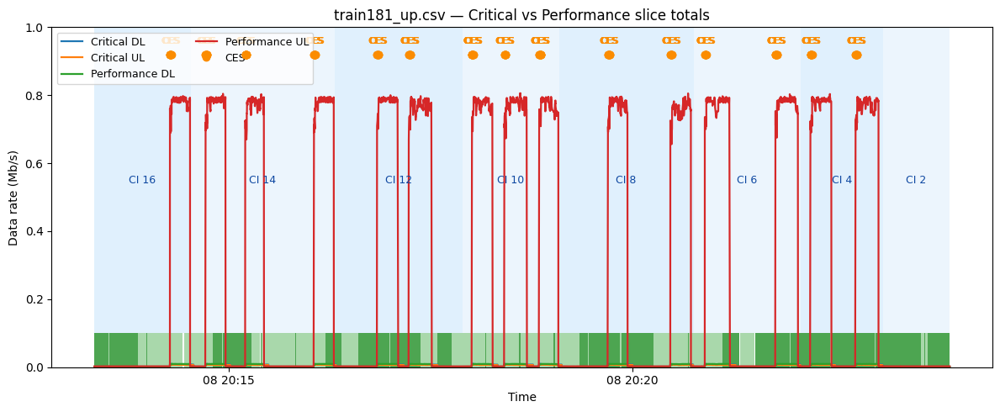

Saved: _base_train_runs/plots/train181_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


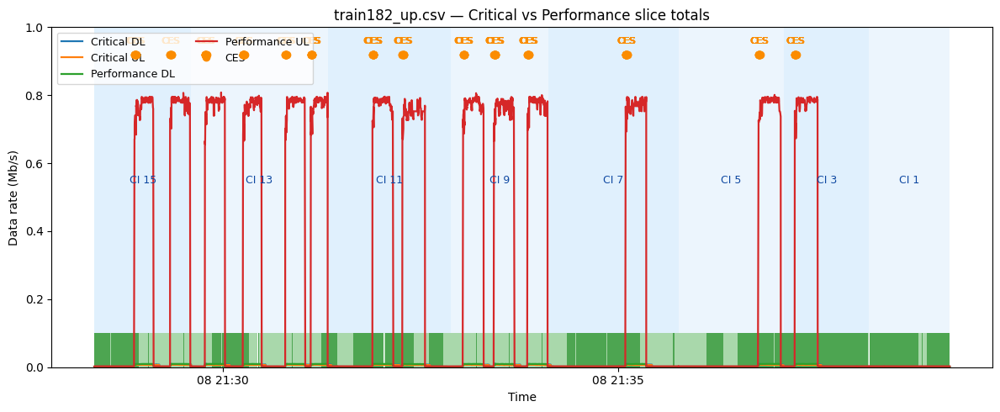

Saved: _base_train_runs/plots/train182_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


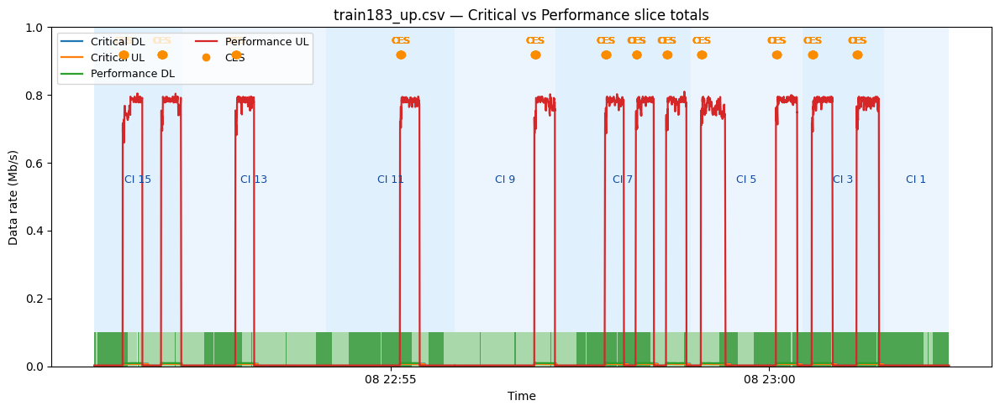

Saved: _base_train_runs/plots/train183_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


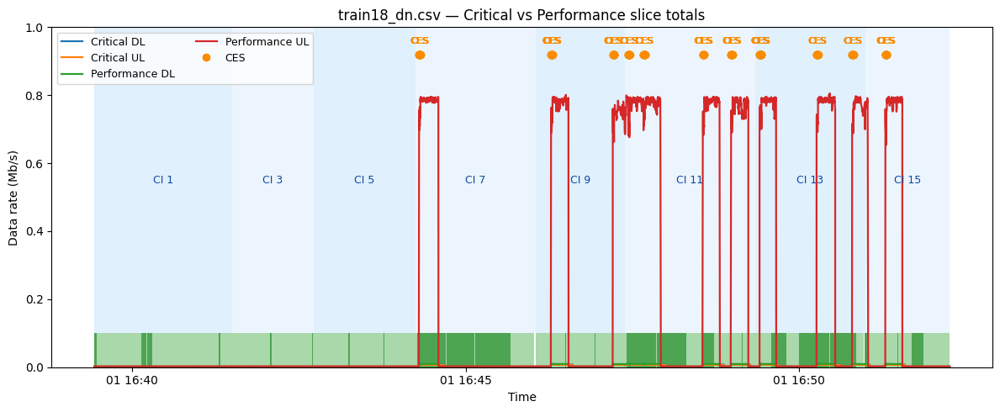

Saved: _base_train_runs/plots/train18_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


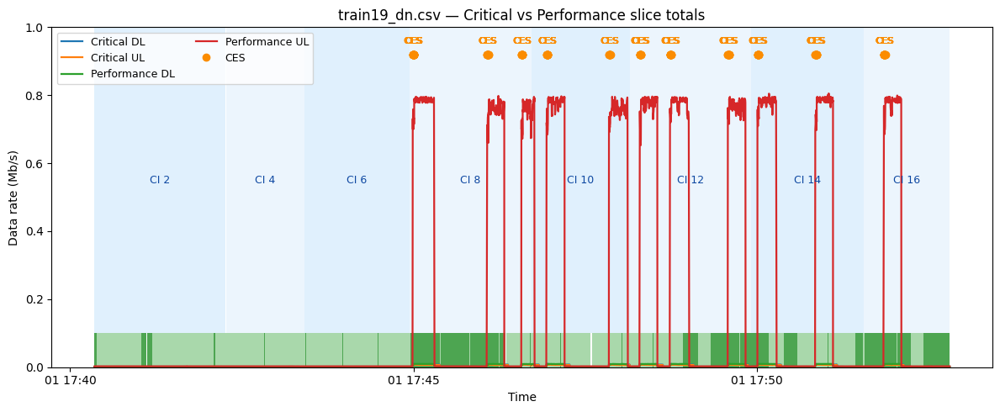

Saved: _base_train_runs/plots/train19_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


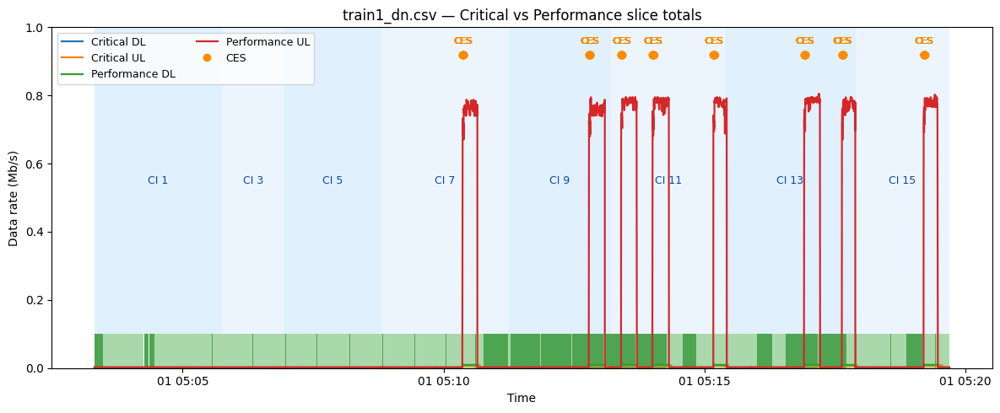

Saved: _base_train_runs/plots/train1_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


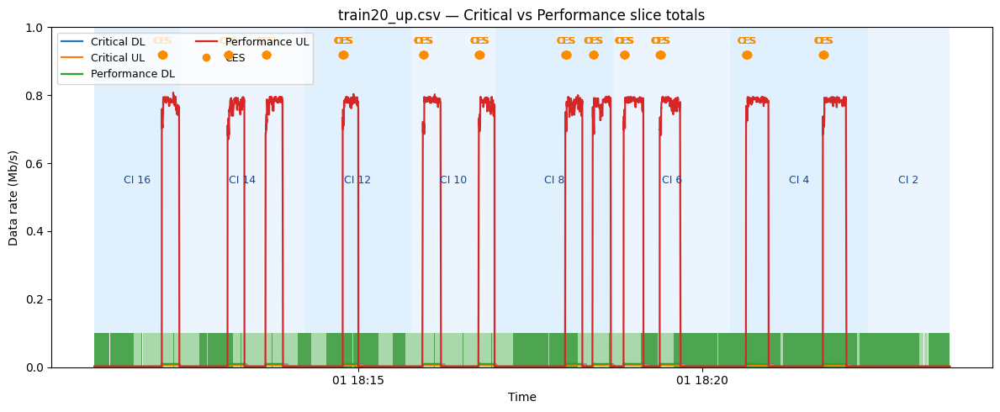

Saved: _base_train_runs/plots/train20_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


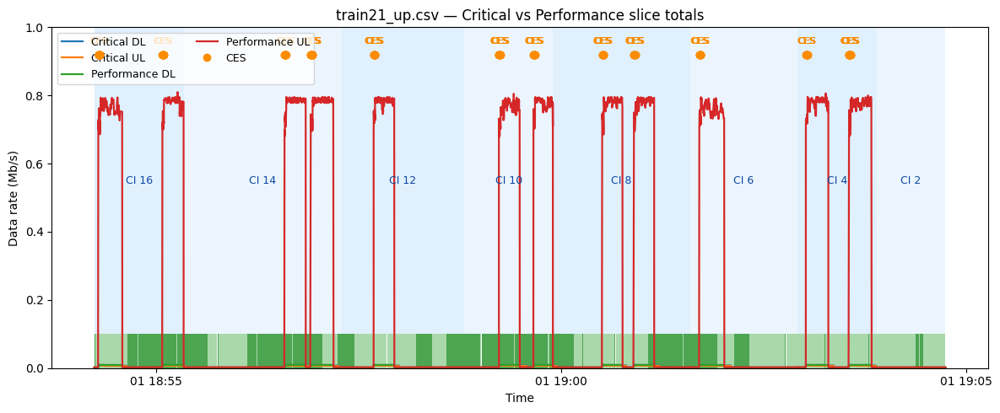

Saved: _base_train_runs/plots/train21_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


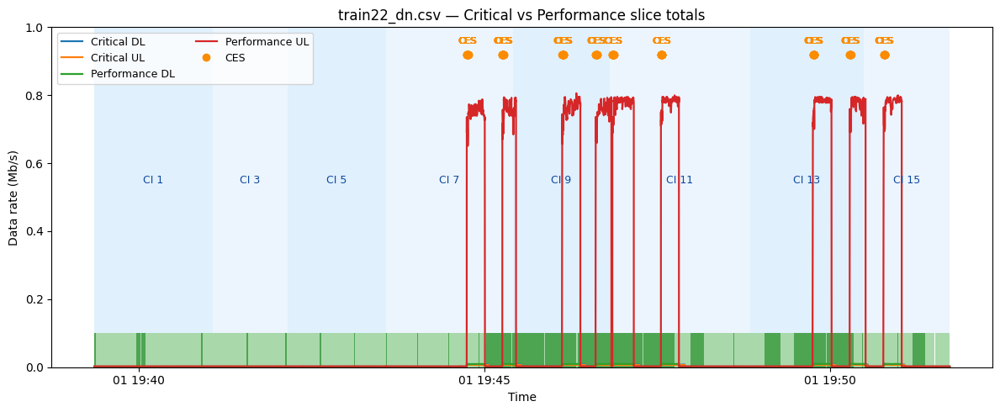

Saved: _base_train_runs/plots/train22_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


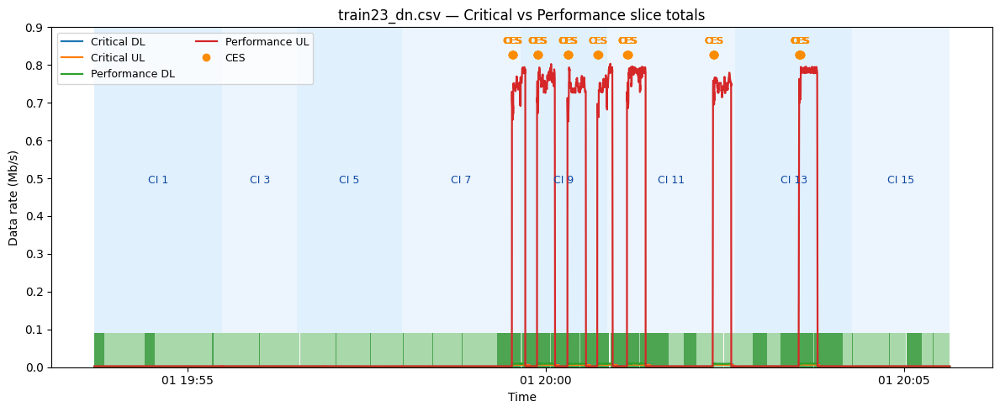

Saved: _base_train_runs/plots/train23_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


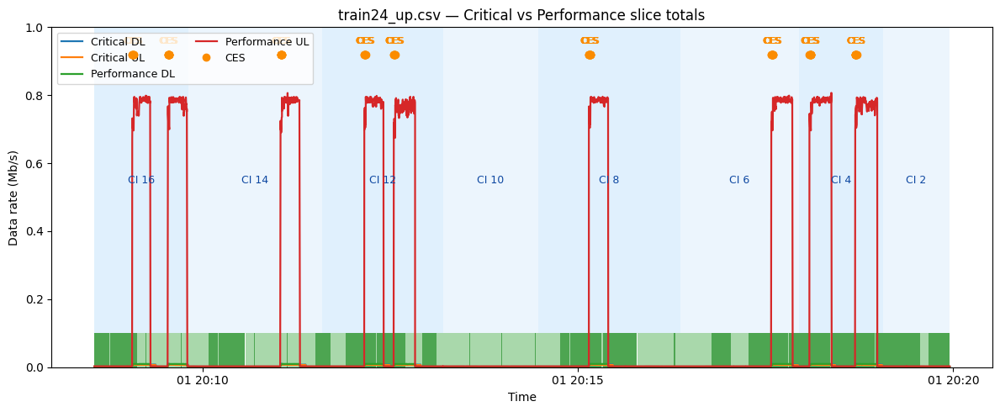

Saved: _base_train_runs/plots/train24_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


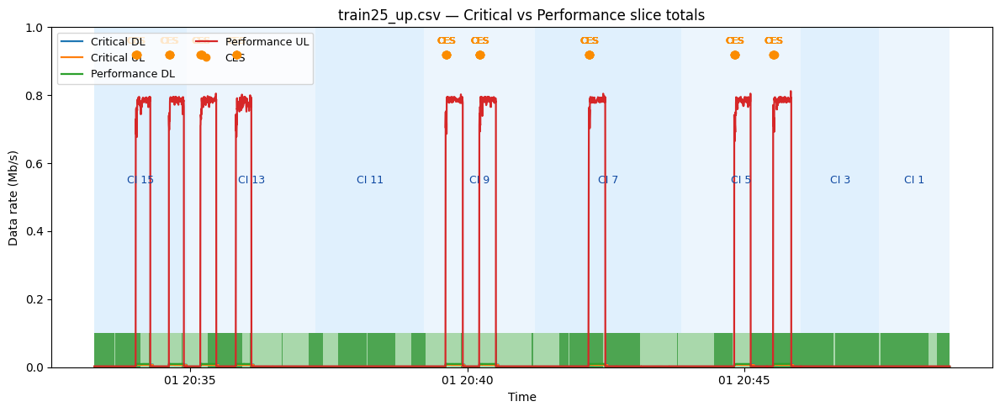

Saved: _base_train_runs/plots/train25_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


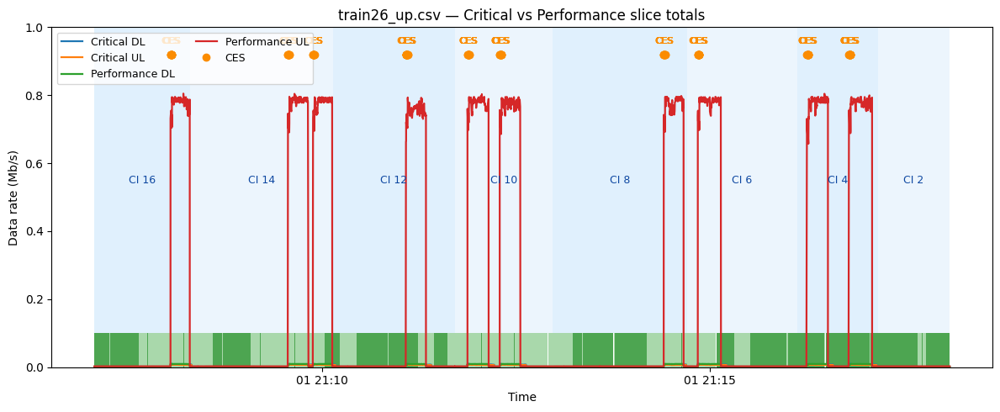

Saved: _base_train_runs/plots/train26_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


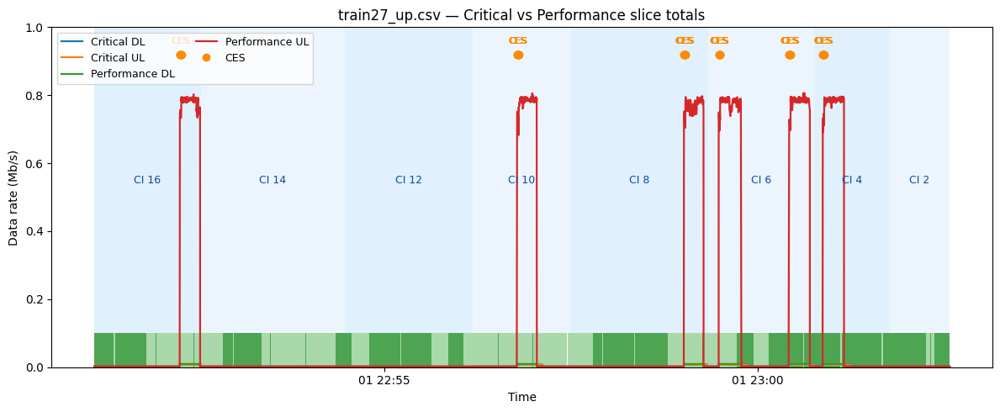

Saved: _base_train_runs/plots/train27_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


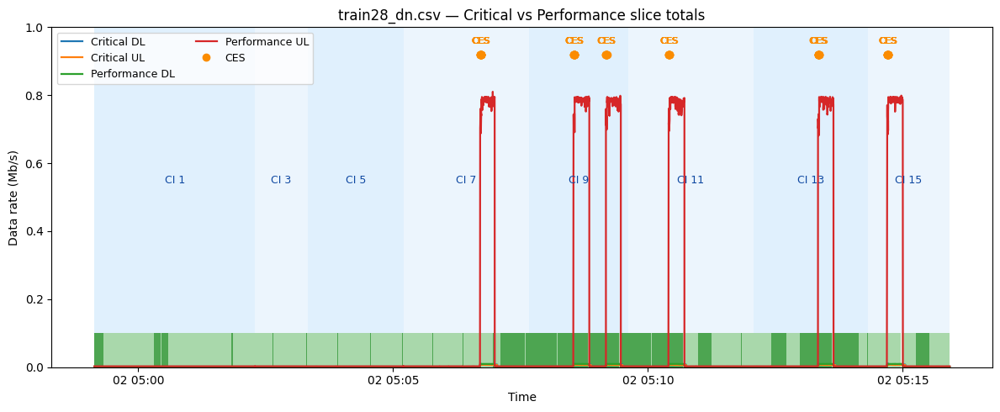

Saved: _base_train_runs/plots/train28_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


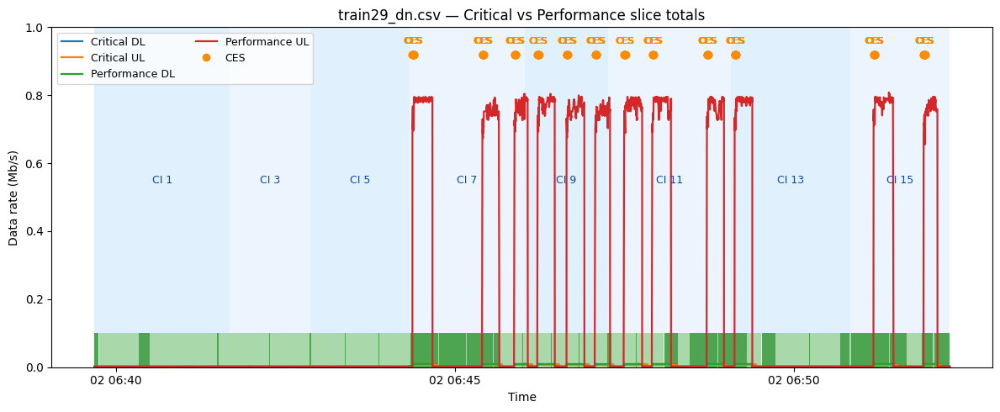

Saved: _base_train_runs/plots/train29_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


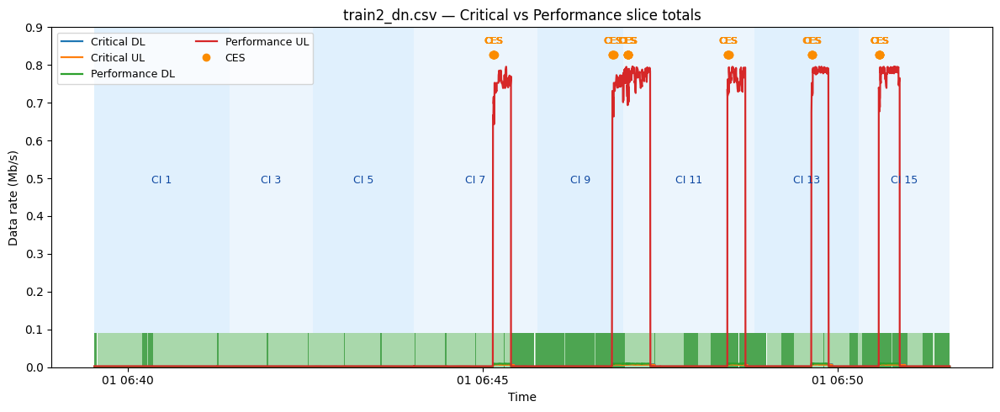

Saved: _base_train_runs/plots/train2_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


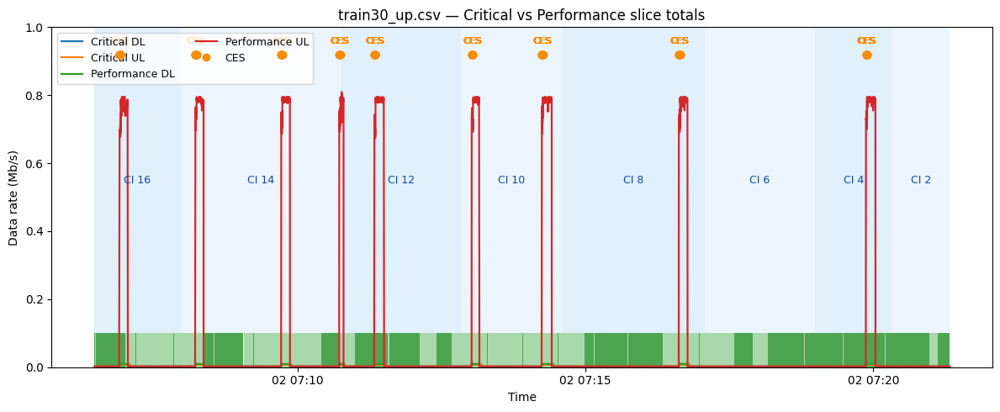

Saved: _base_train_runs/plots/train30_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


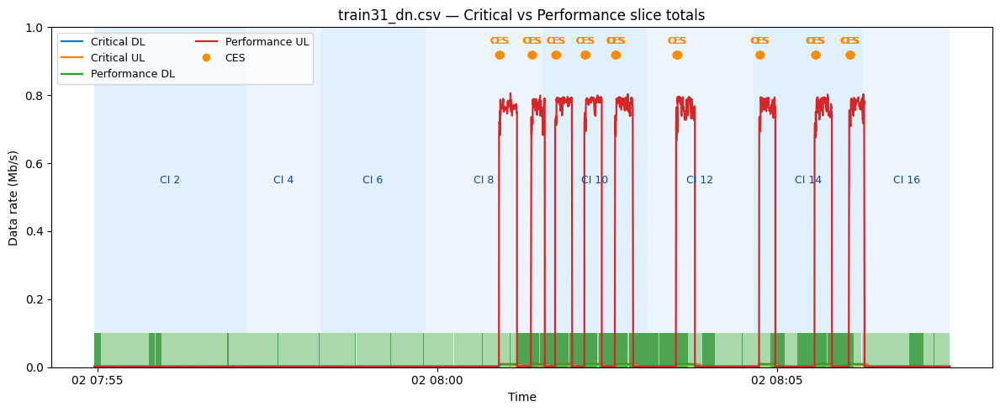

Saved: _base_train_runs/plots/train31_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


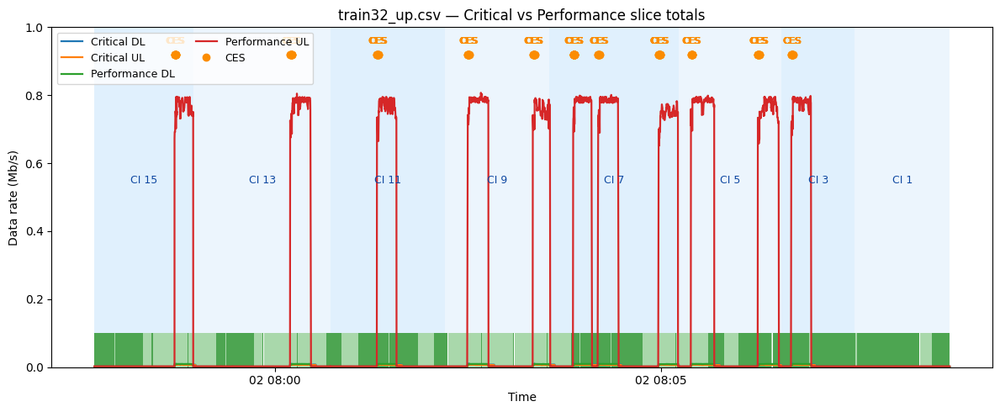

Saved: _base_train_runs/plots/train32_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


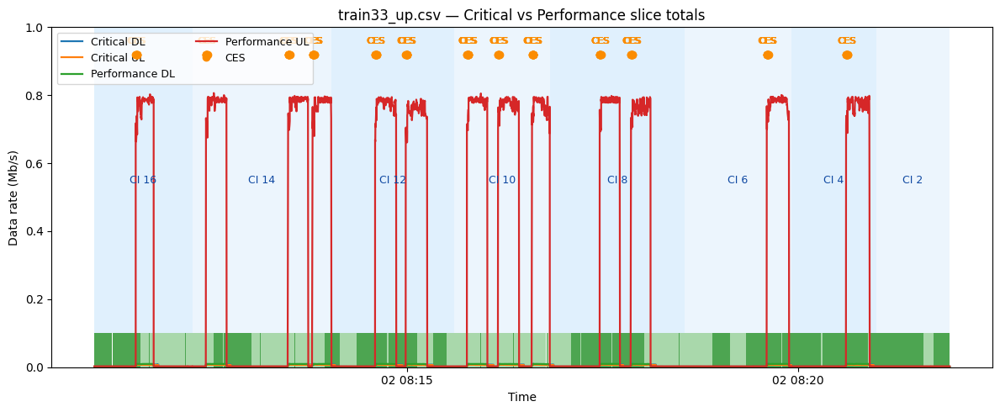

Saved: _base_train_runs/plots/train33_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


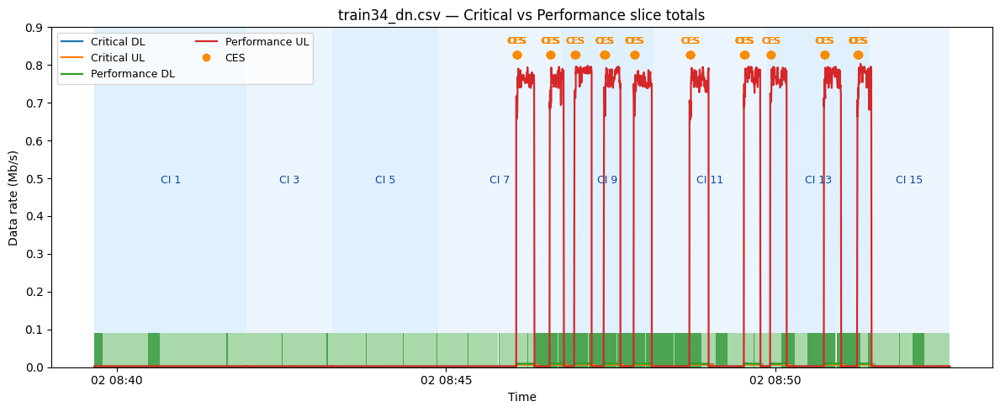

Saved: _base_train_runs/plots/train34_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


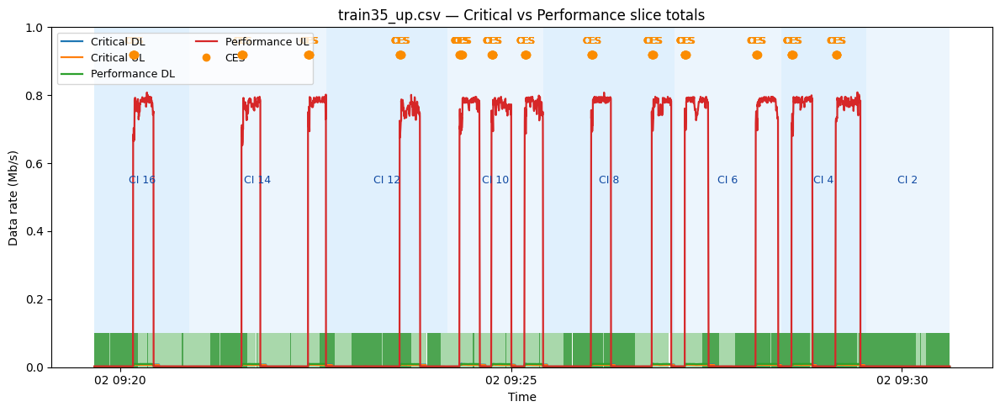

Saved: _base_train_runs/plots/train35_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


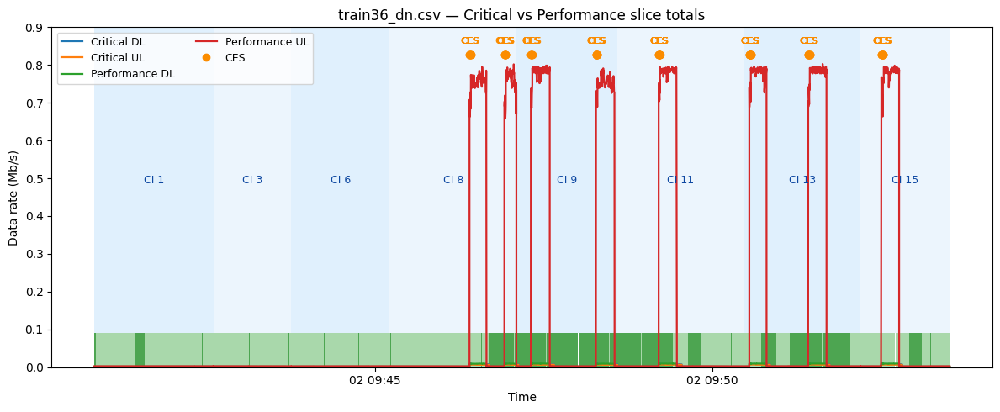

Saved: _base_train_runs/plots/train36_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


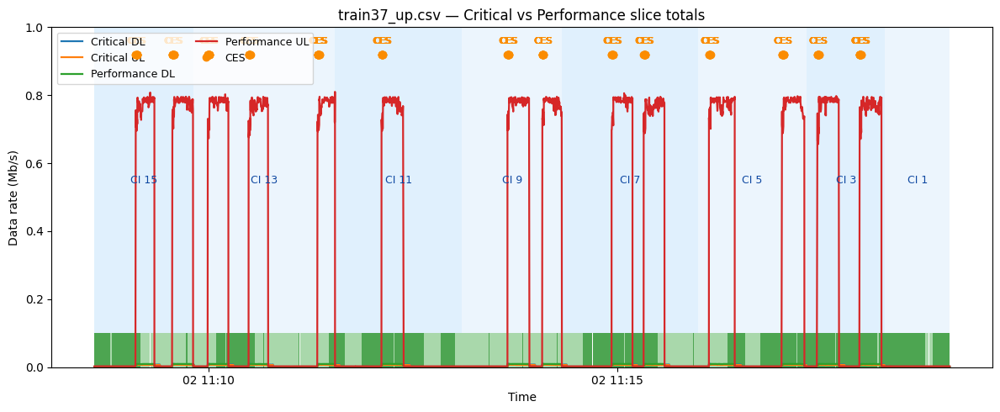

Saved: _base_train_runs/plots/train37_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


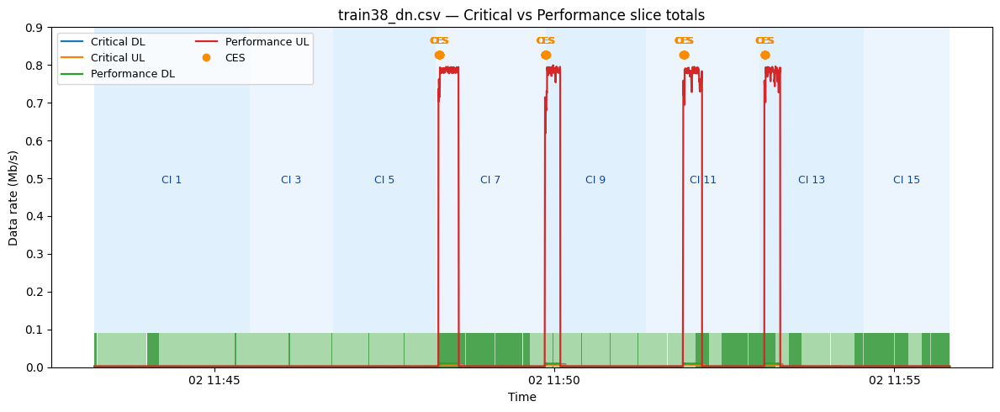

Saved: _base_train_runs/plots/train38_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


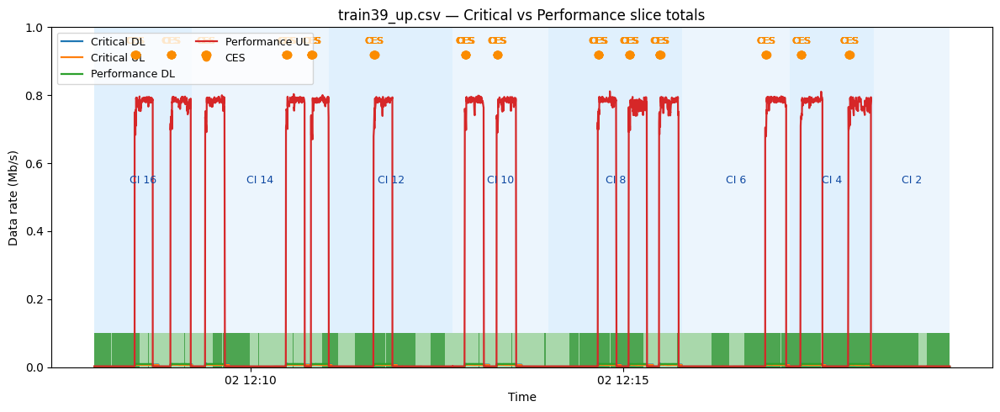

Saved: _base_train_runs/plots/train39_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


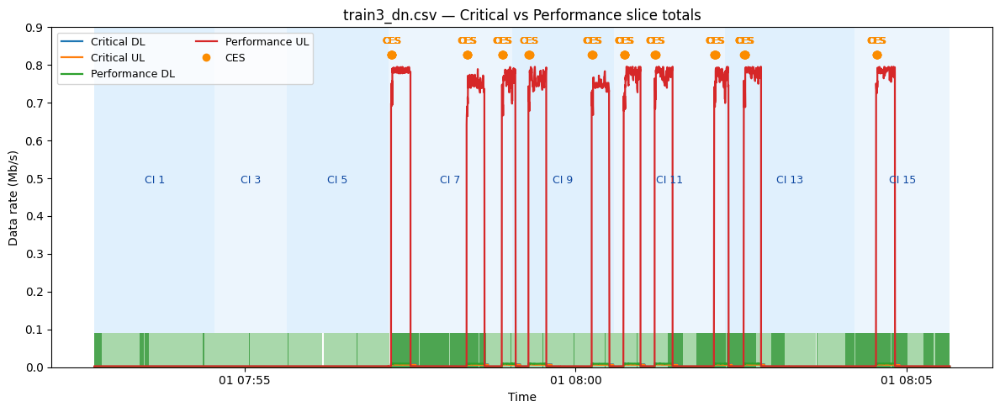

Saved: _base_train_runs/plots/train3_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


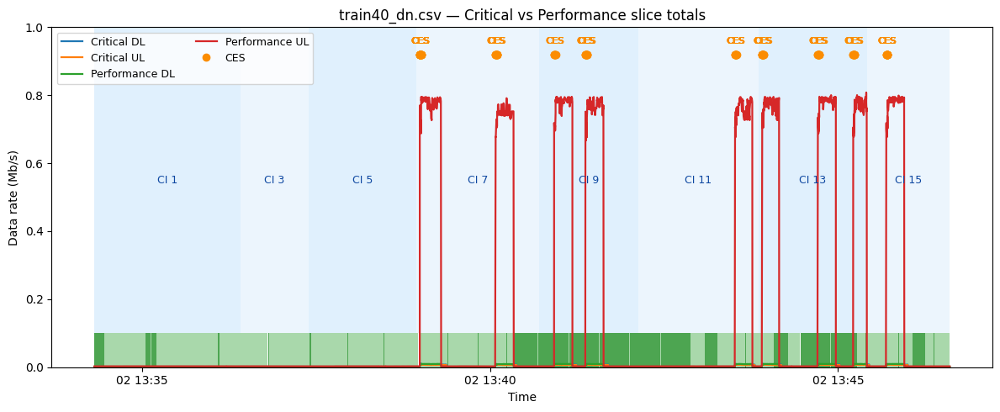

Saved: _base_train_runs/plots/train40_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


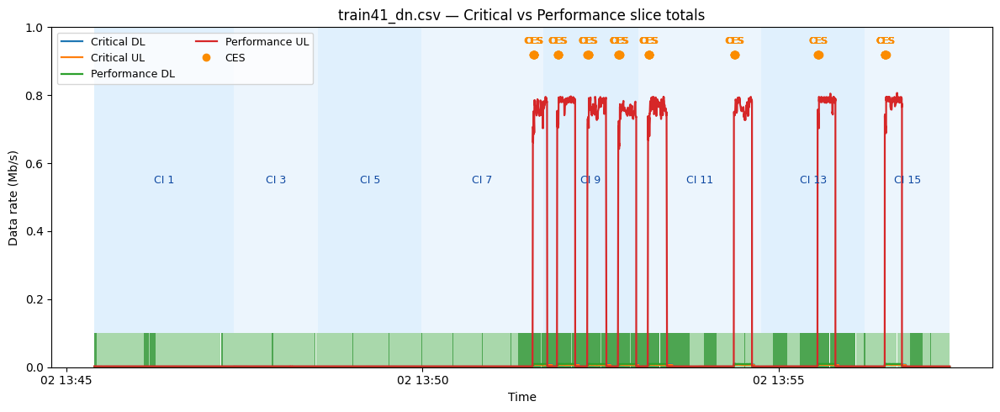

Saved: _base_train_runs/plots/train41_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


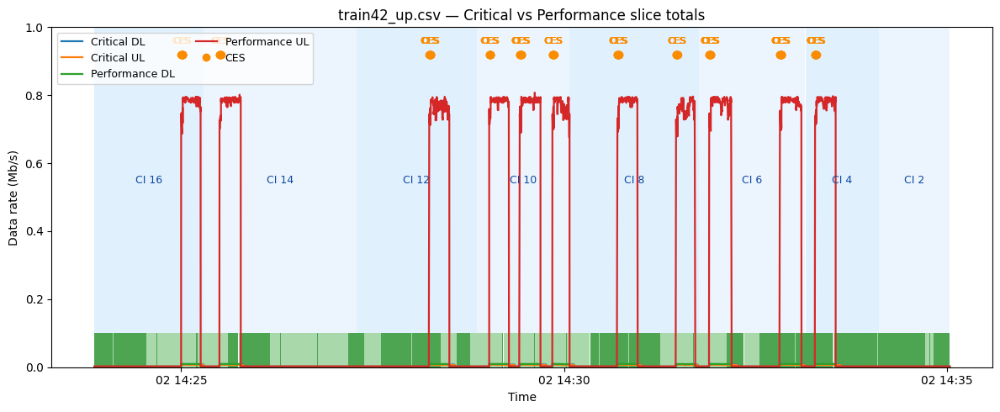

Saved: _base_train_runs/plots/train42_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


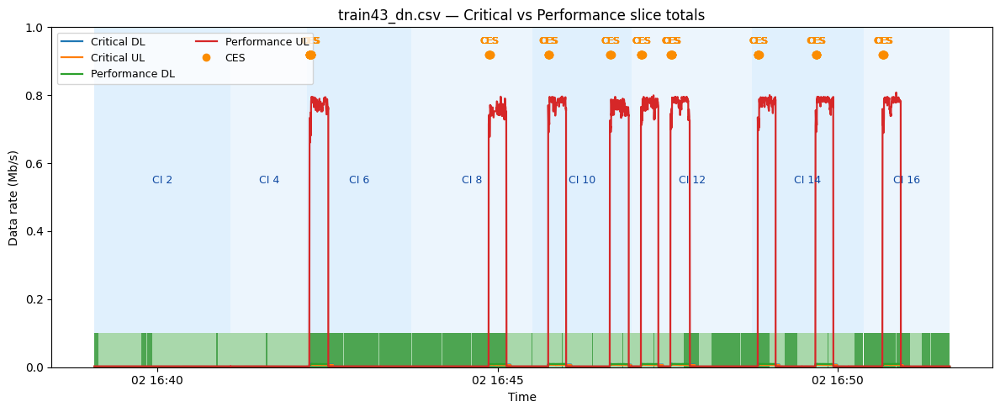

Saved: _base_train_runs/plots/train43_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


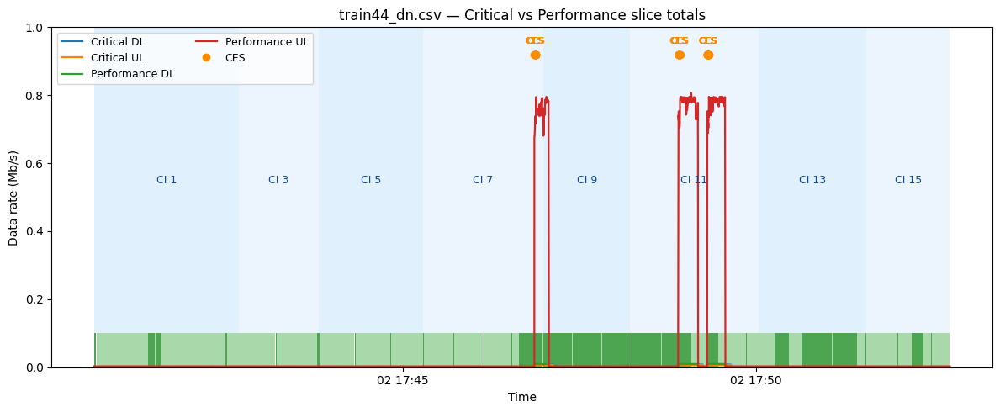

Saved: _base_train_runs/plots/train44_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


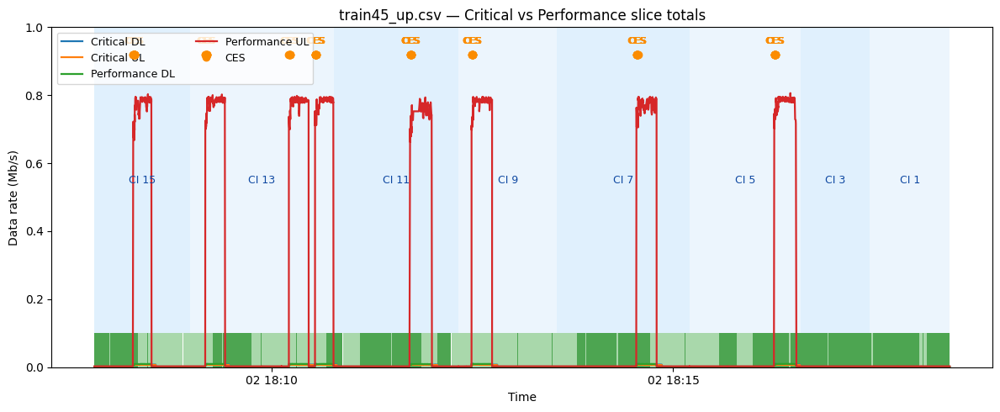

Saved: _base_train_runs/plots/train45_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


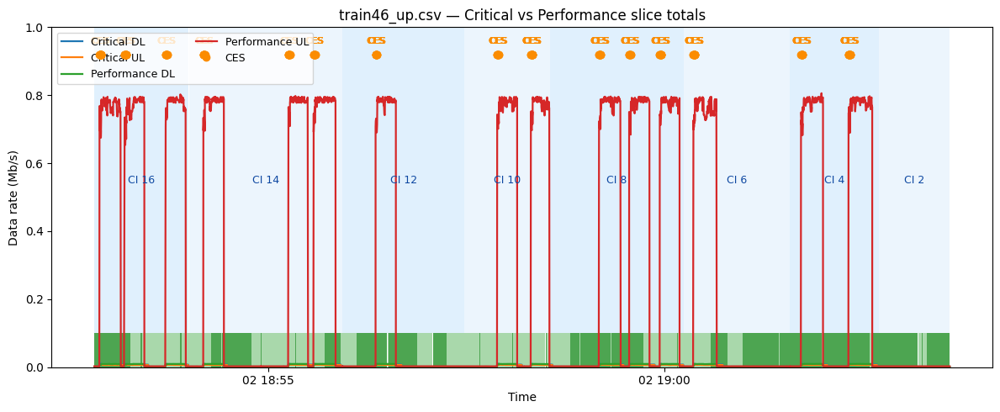

Saved: _base_train_runs/plots/train46_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


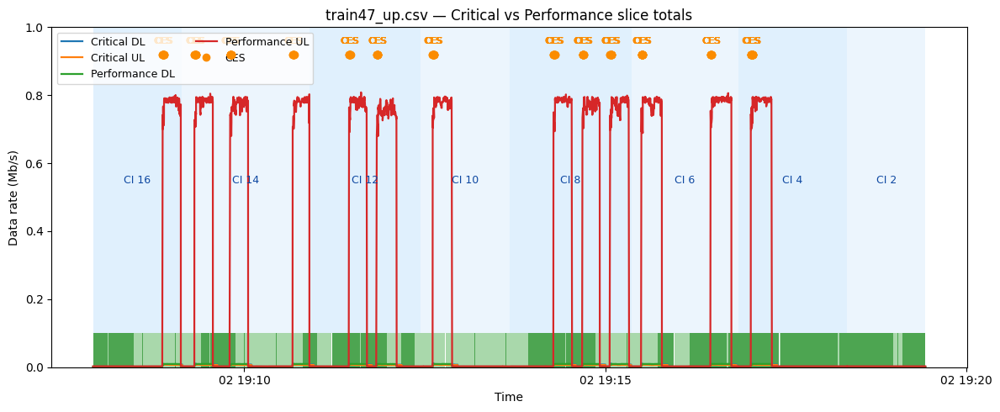

Saved: _base_train_runs/plots/train47_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


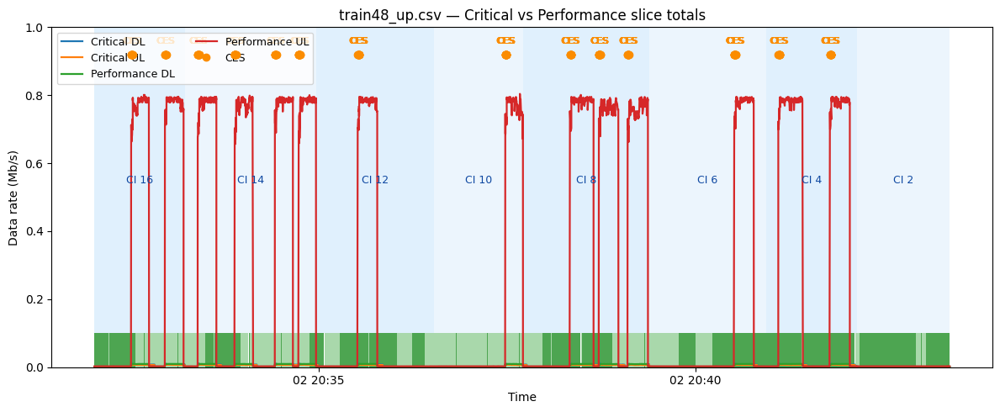

Saved: _base_train_runs/plots/train48_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


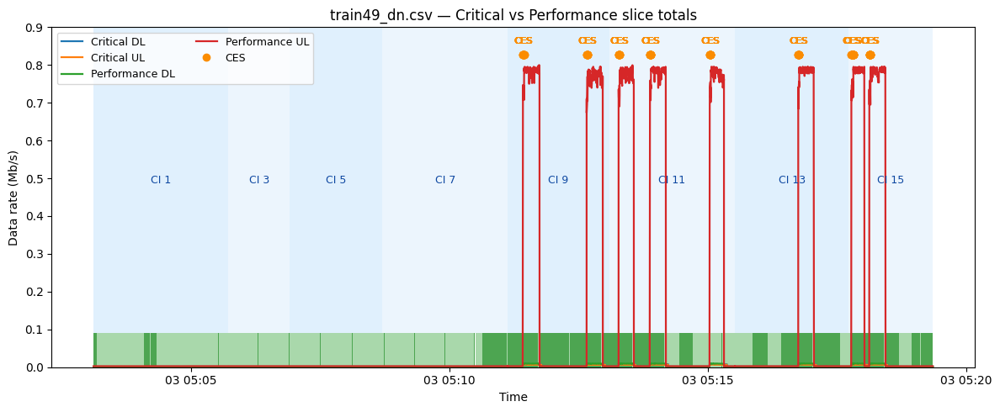

Saved: _base_train_runs/plots/train49_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


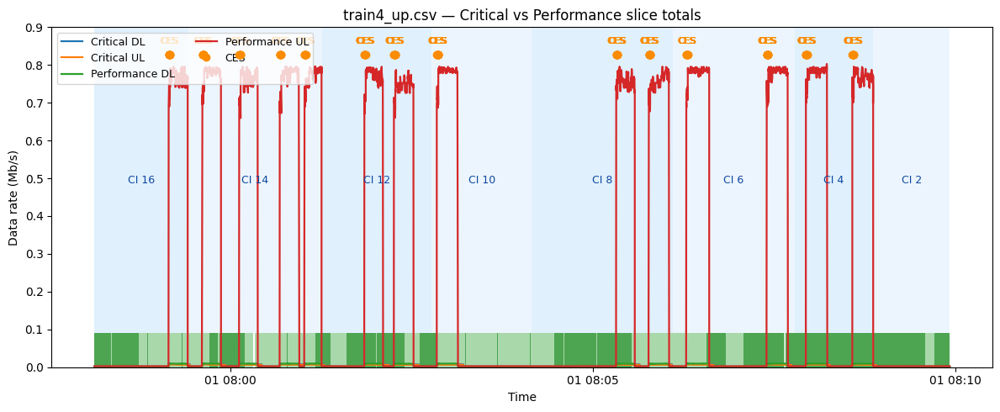

Saved: _base_train_runs/plots/train4_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


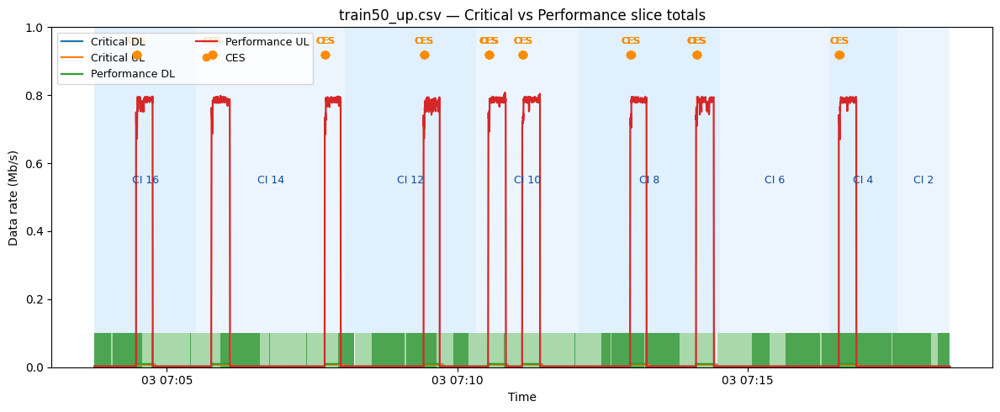

Saved: _base_train_runs/plots/train50_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


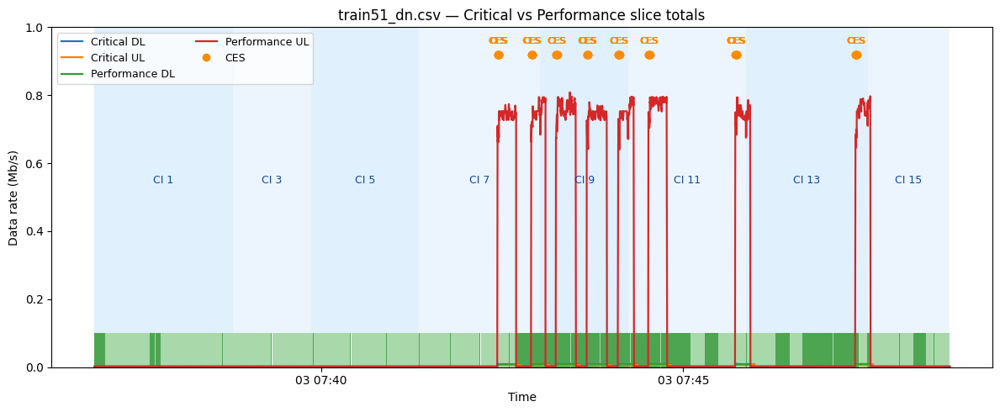

Saved: _base_train_runs/plots/train51_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


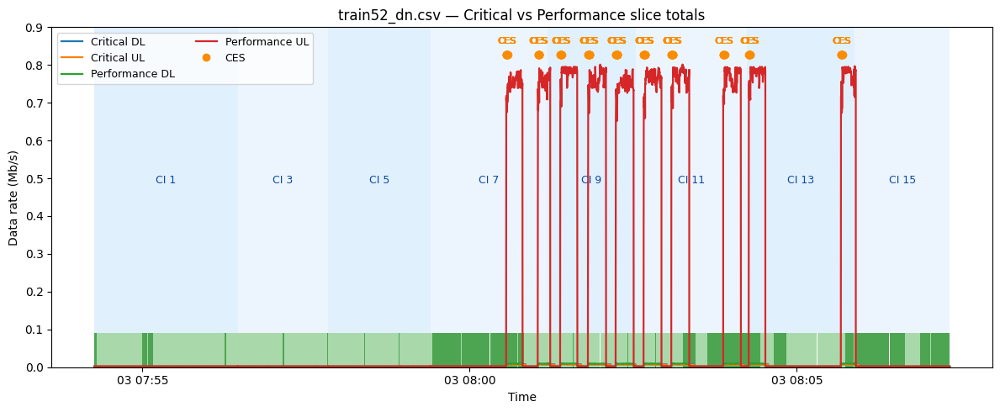

Saved: _base_train_runs/plots/train52_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


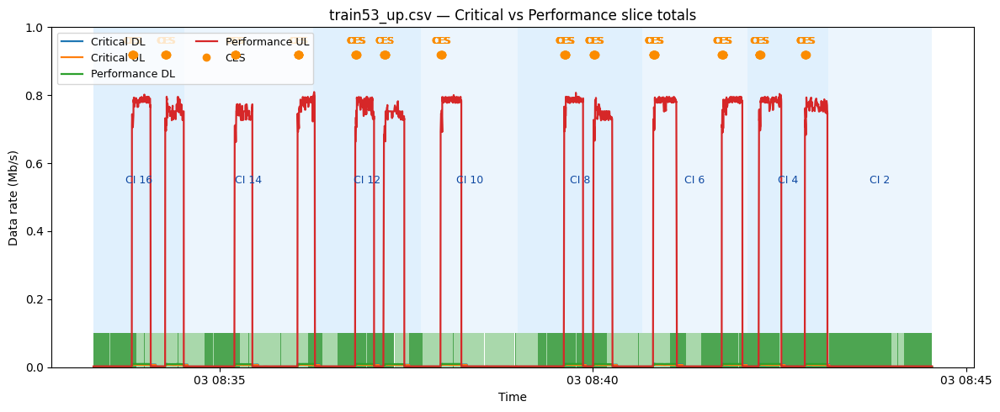

Saved: _base_train_runs/plots/train53_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


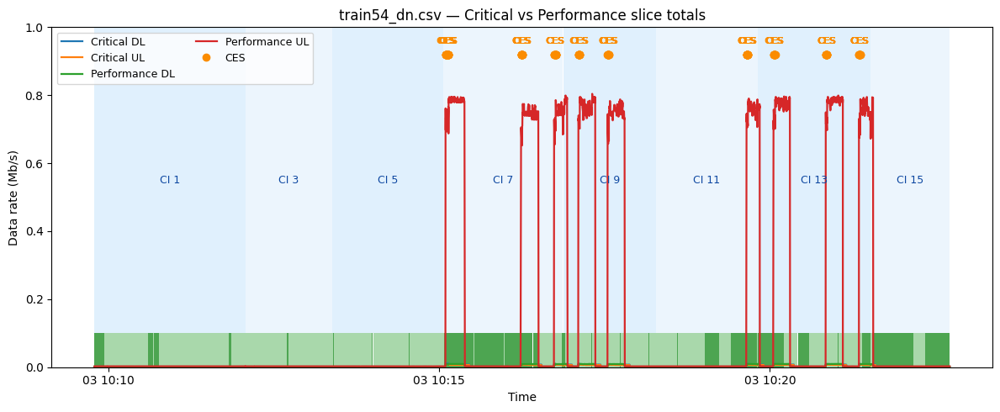

Saved: _base_train_runs/plots/train54_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


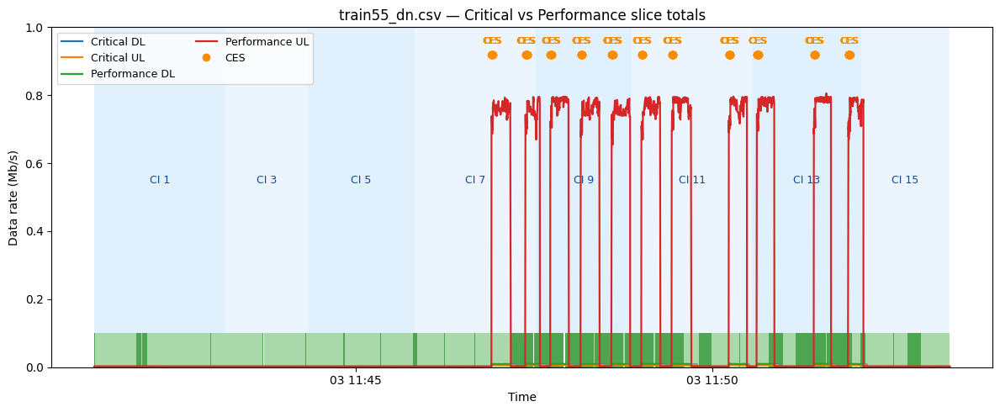

Saved: _base_train_runs/plots/train55_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


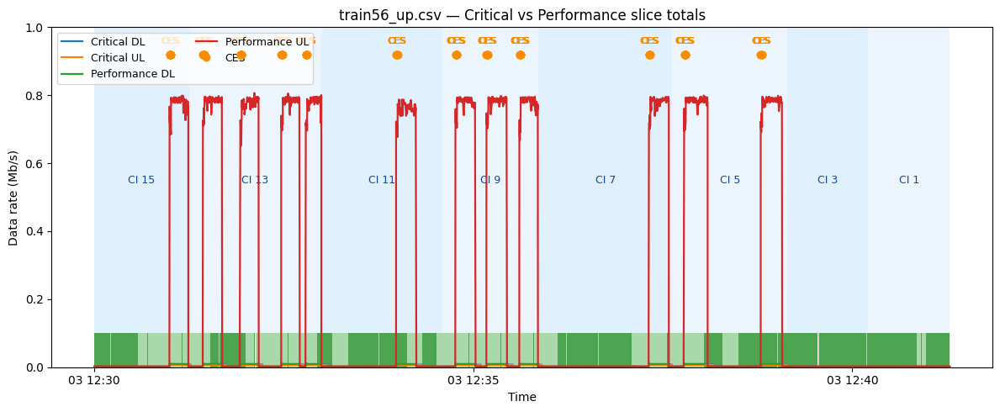

Saved: _base_train_runs/plots/train56_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


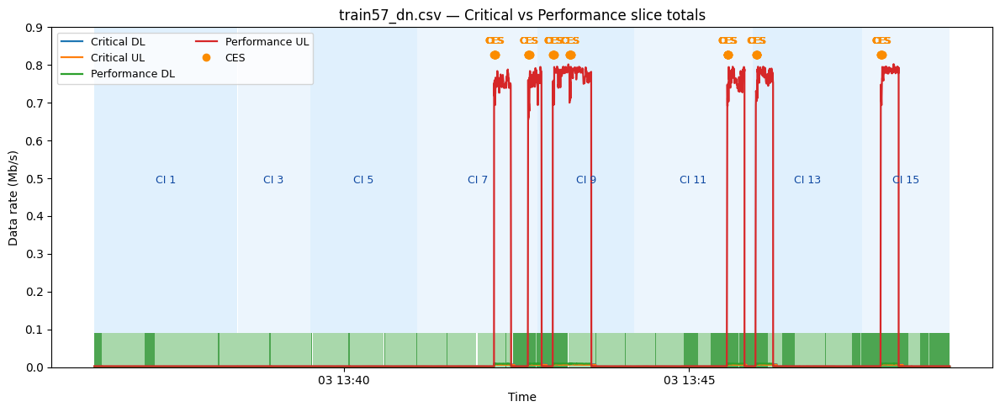

Saved: _base_train_runs/plots/train57_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


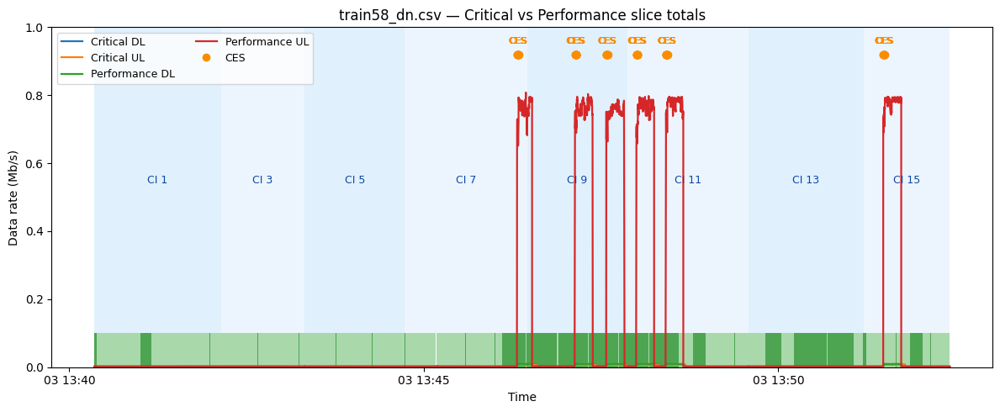

Saved: _base_train_runs/plots/train58_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


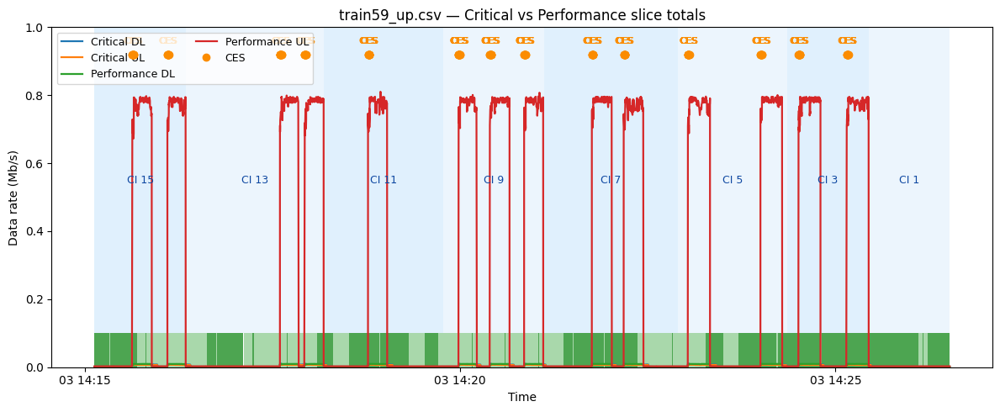

Saved: _base_train_runs/plots/train59_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


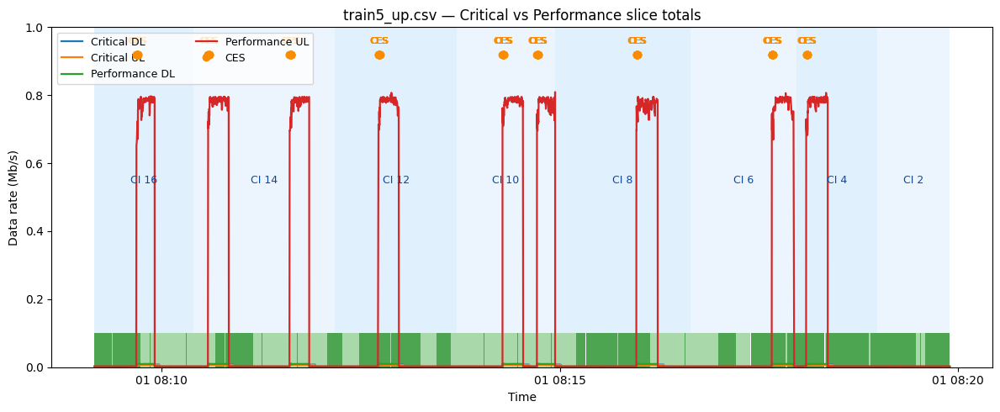

Saved: _base_train_runs/plots/train5_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


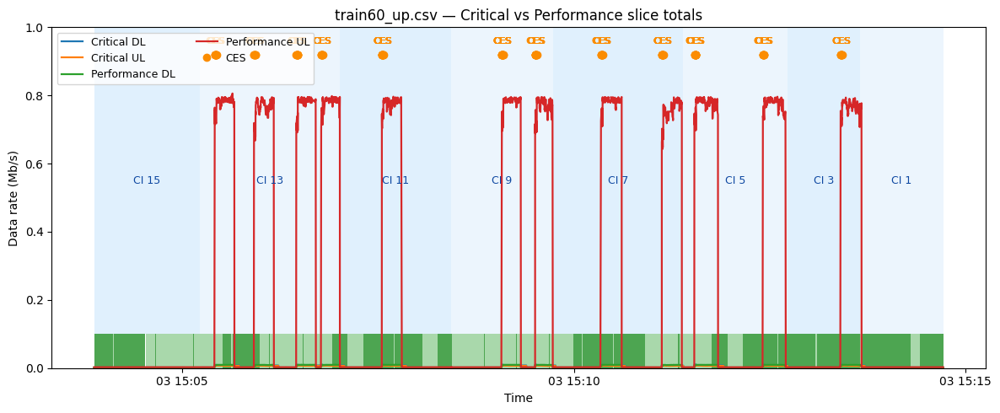

Saved: _base_train_runs/plots/train60_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


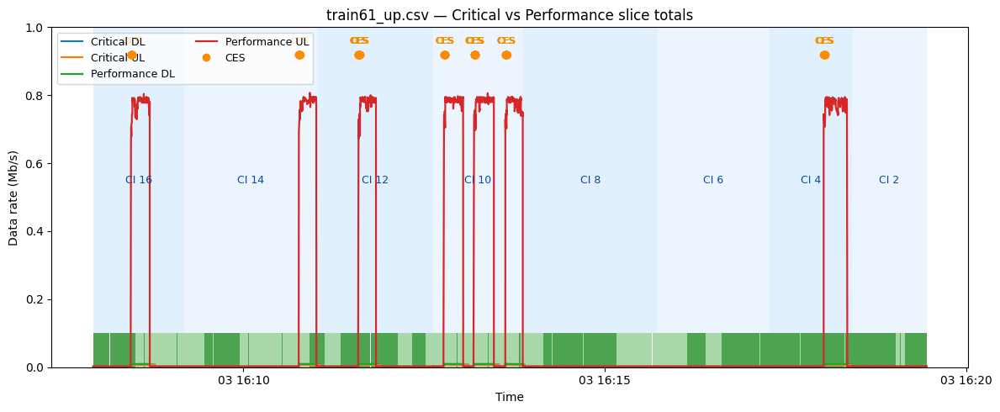

Saved: _base_train_runs/plots/train61_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


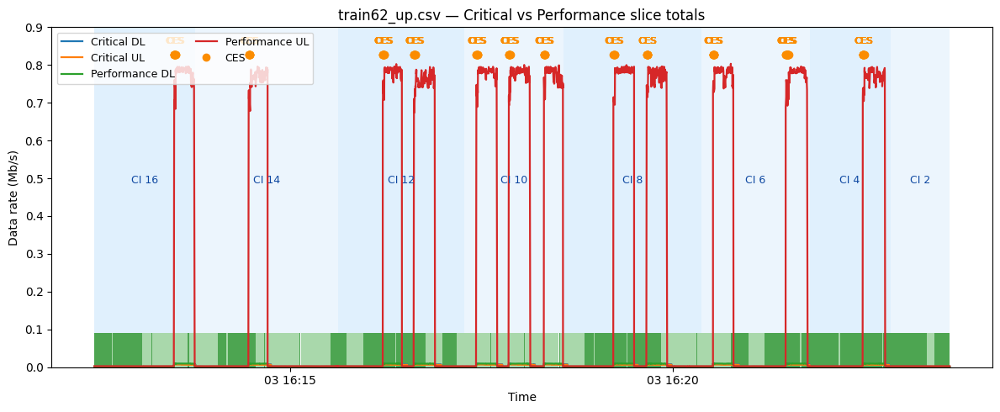

Saved: _base_train_runs/plots/train62_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


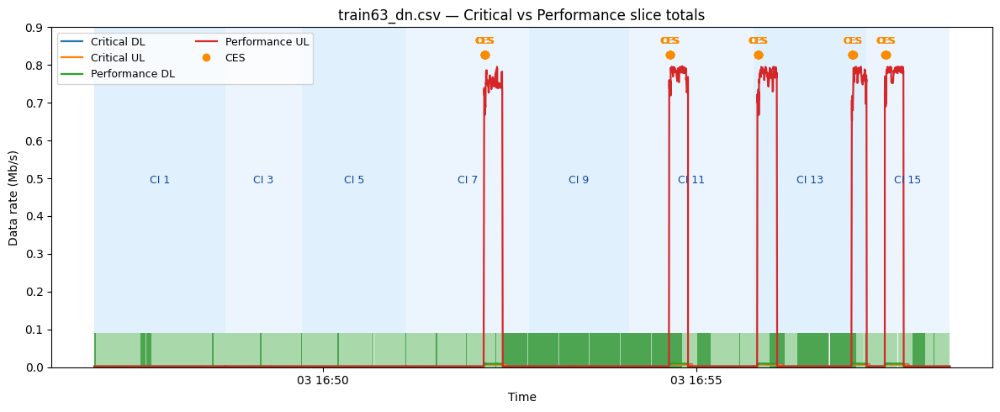

Saved: _base_train_runs/plots/train63_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


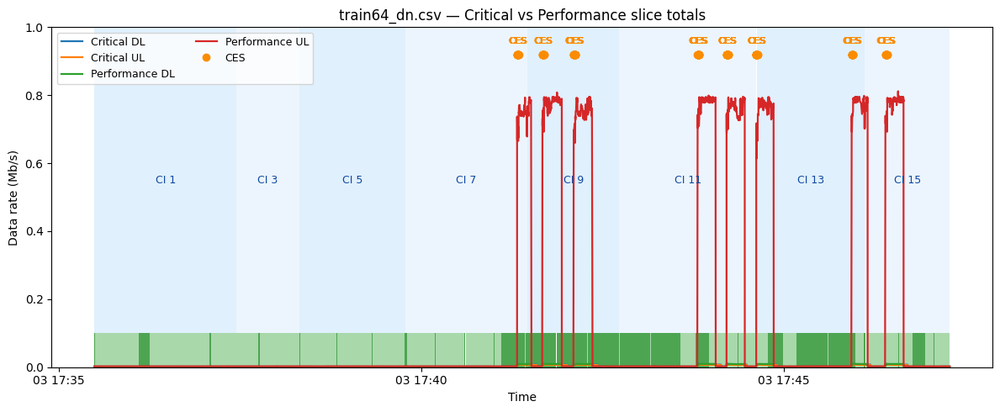

Saved: _base_train_runs/plots/train64_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


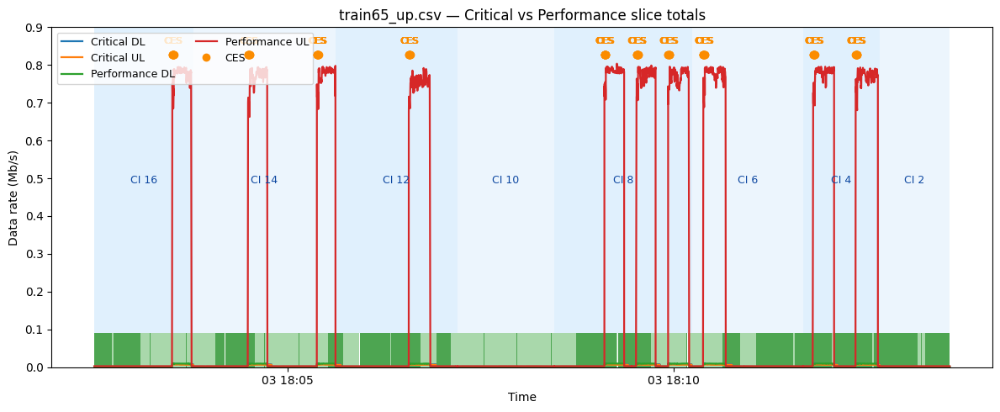

Saved: _base_train_runs/plots/train65_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


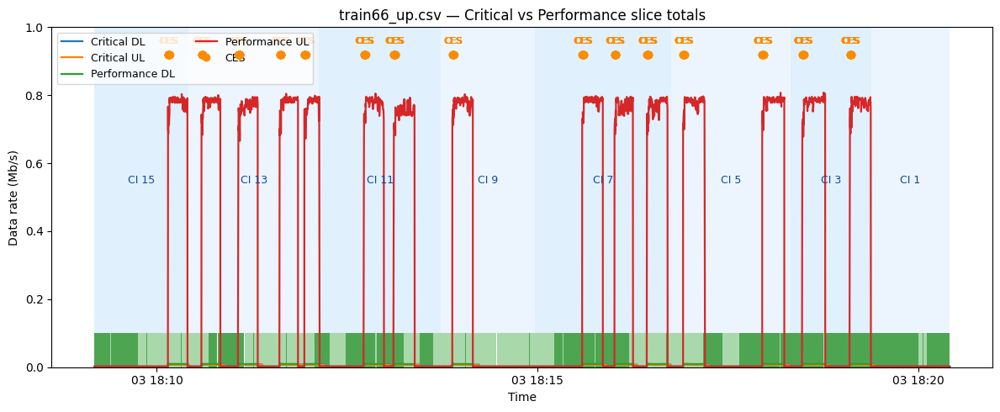

Saved: _base_train_runs/plots/train66_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


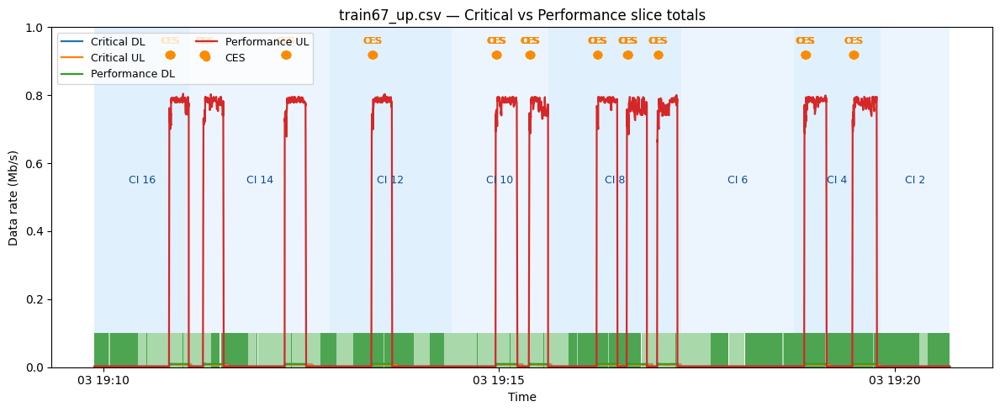

Saved: _base_train_runs/plots/train67_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


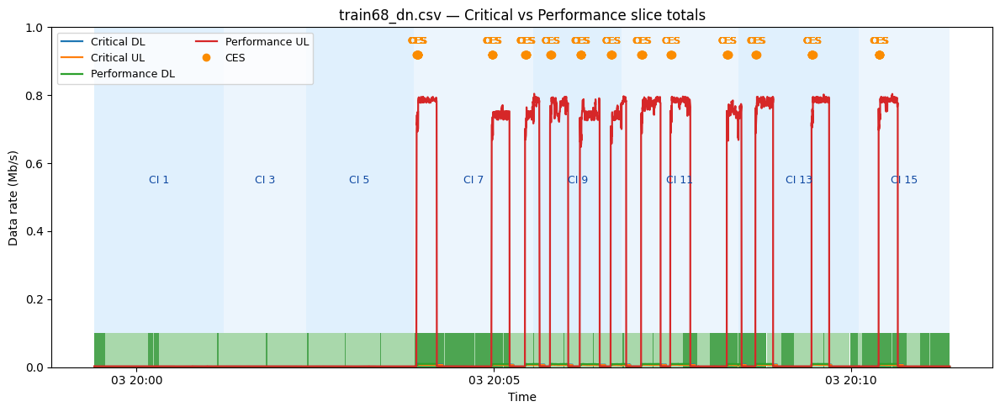

Saved: _base_train_runs/plots/train68_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


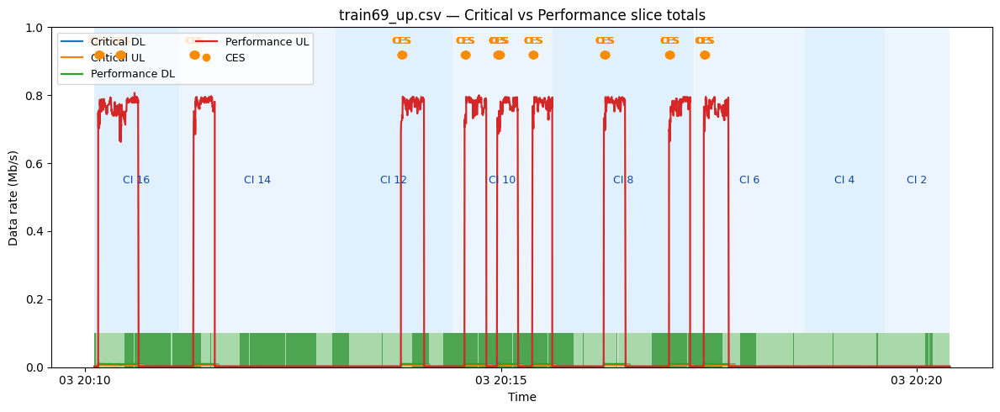

Saved: _base_train_runs/plots/train69_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


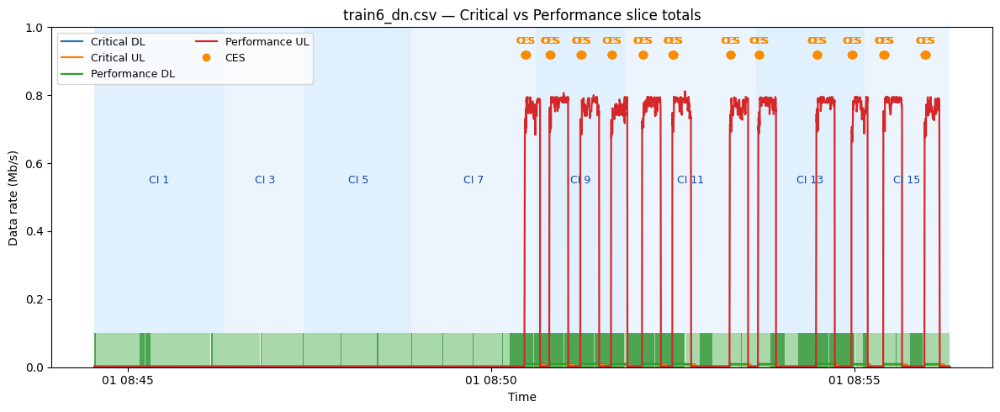

Saved: _base_train_runs/plots/train6_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


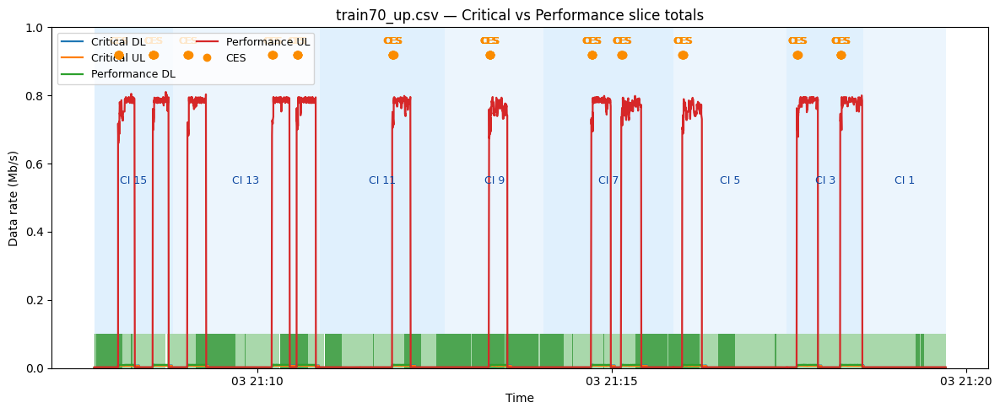

Saved: _base_train_runs/plots/train70_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


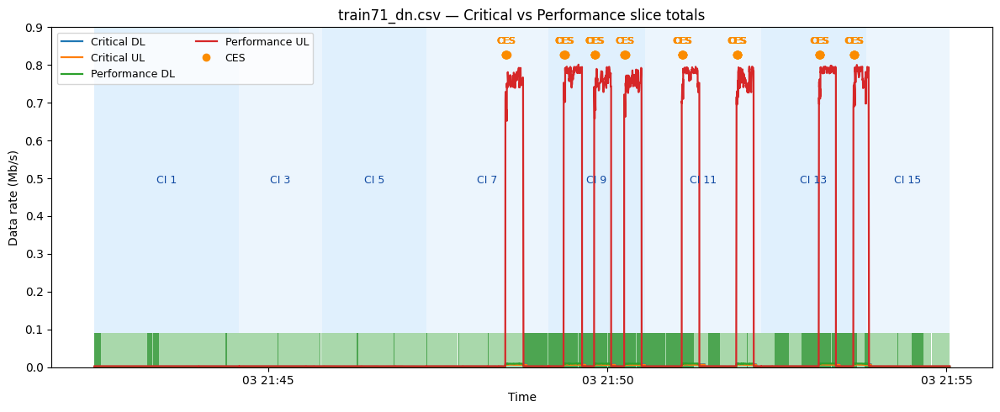

Saved: _base_train_runs/plots/train71_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


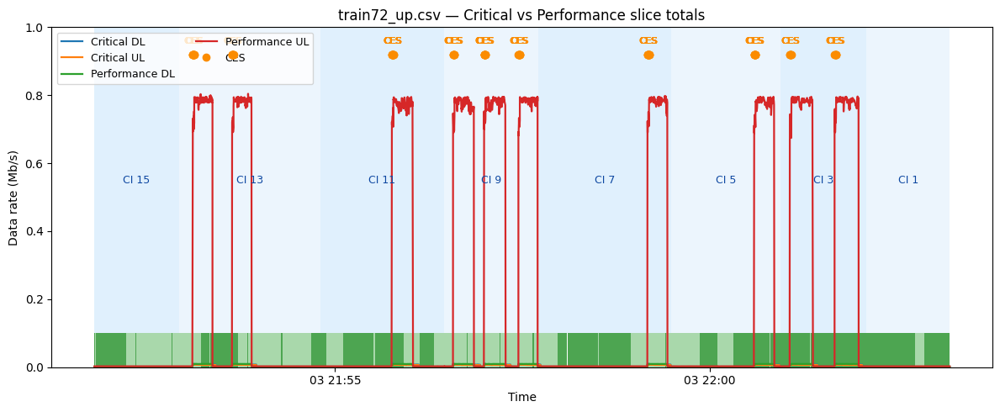

Saved: _base_train_runs/plots/train72_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


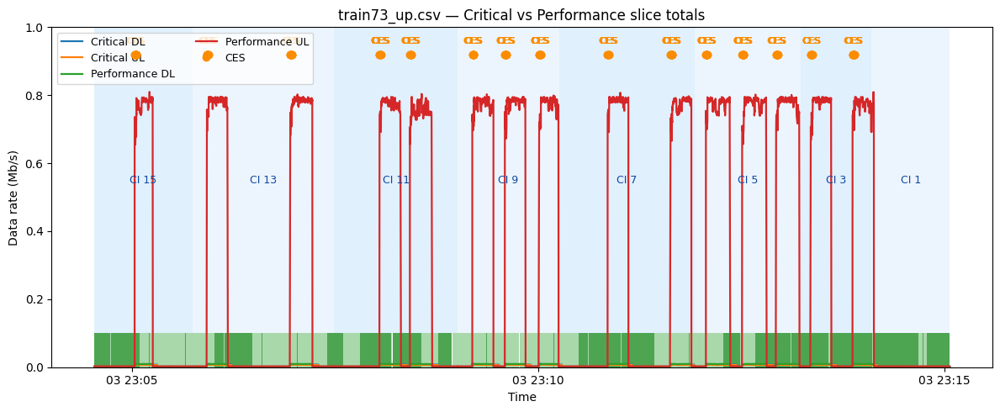

Saved: _base_train_runs/plots/train73_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


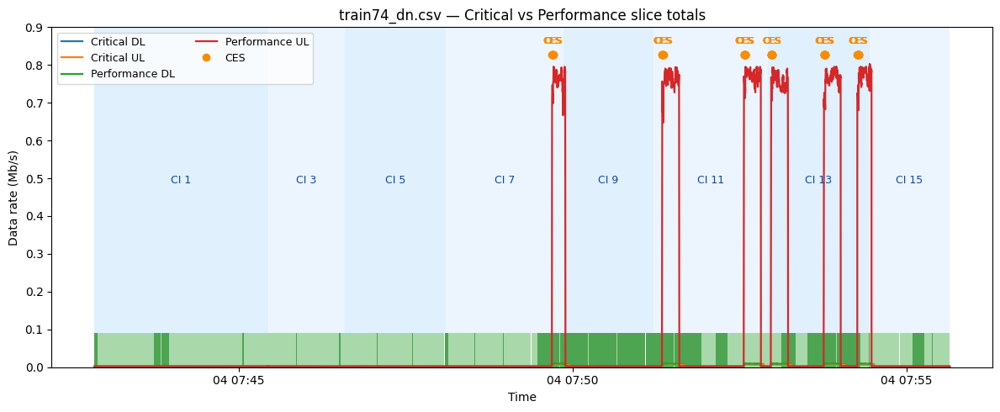

Saved: _base_train_runs/plots/train74_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


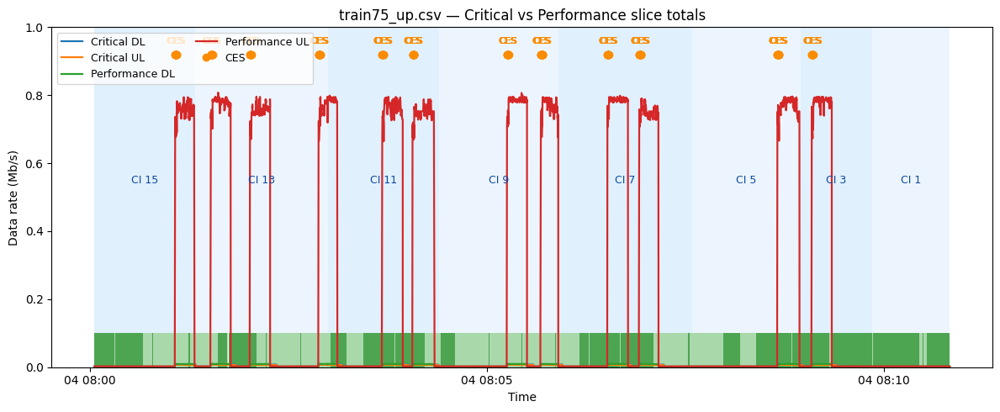

Saved: _base_train_runs/plots/train75_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


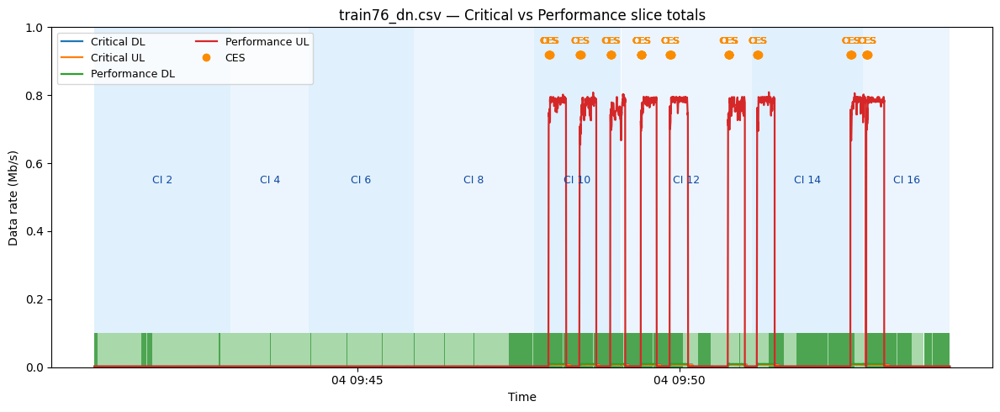

Saved: _base_train_runs/plots/train76_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


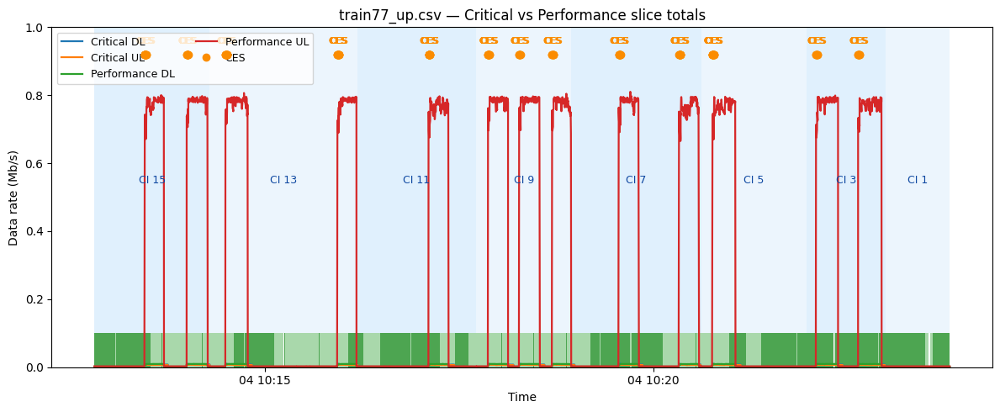

Saved: _base_train_runs/plots/train77_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


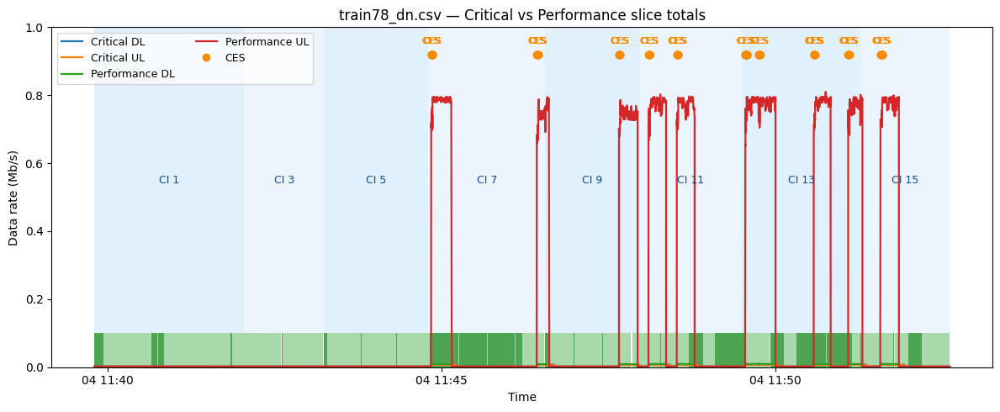

Saved: _base_train_runs/plots/train78_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


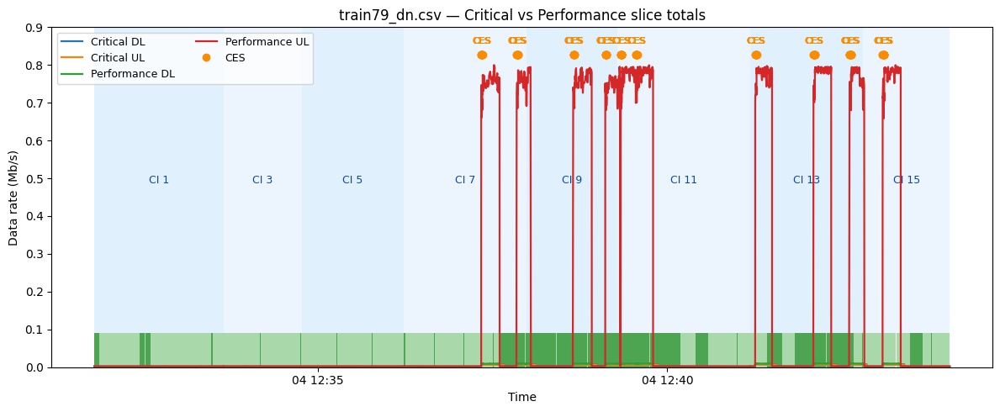

Saved: _base_train_runs/plots/train79_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


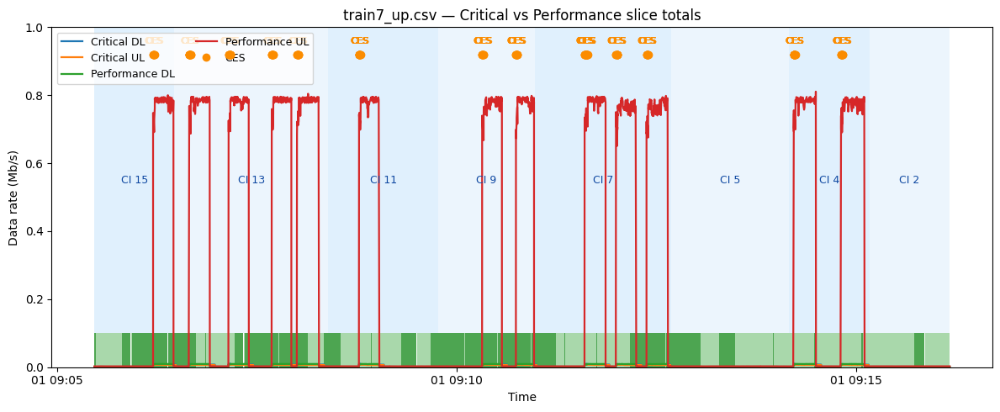

Saved: _base_train_runs/plots/train7_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


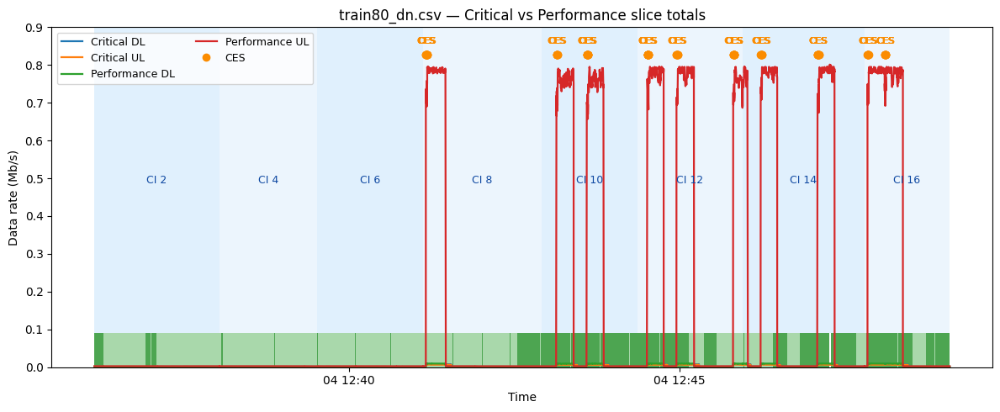

Saved: _base_train_runs/plots/train80_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


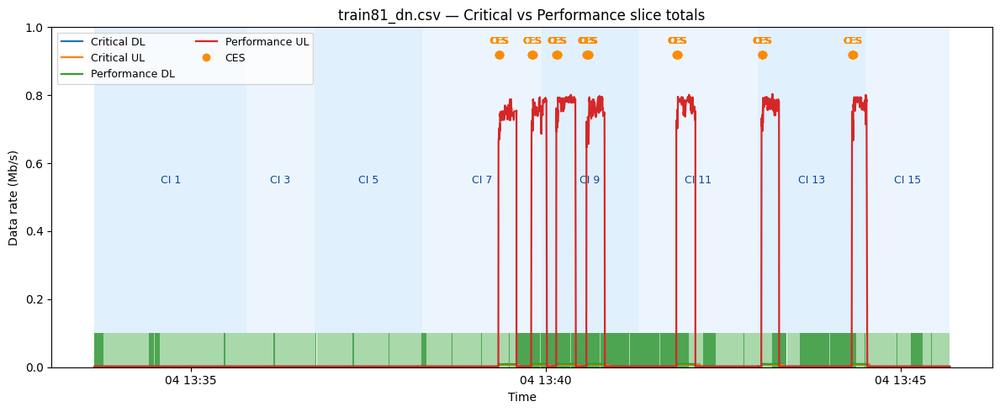

Saved: _base_train_runs/plots/train81_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


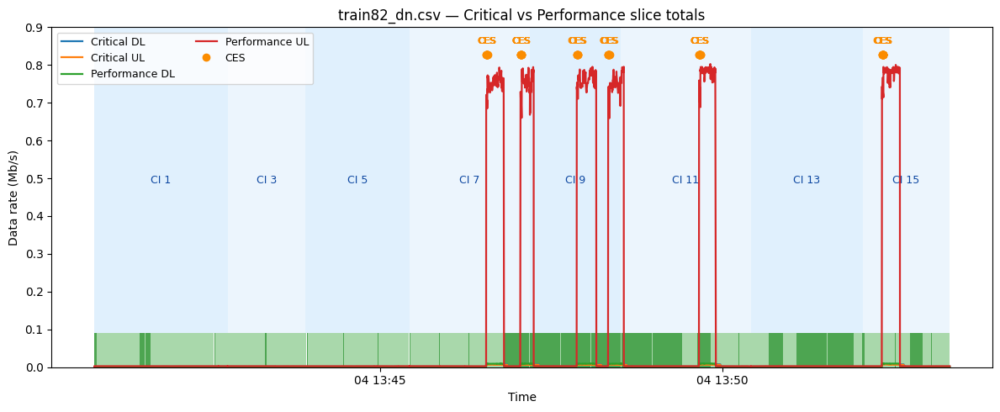

Saved: _base_train_runs/plots/train82_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


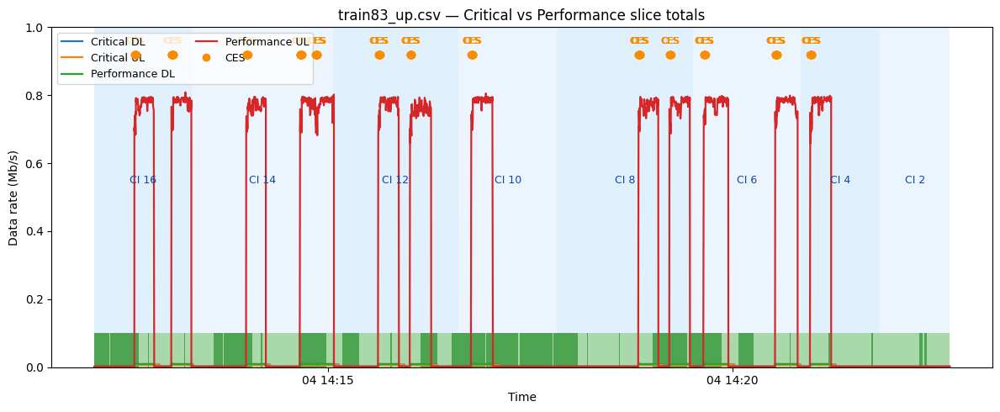

Saved: _base_train_runs/plots/train83_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


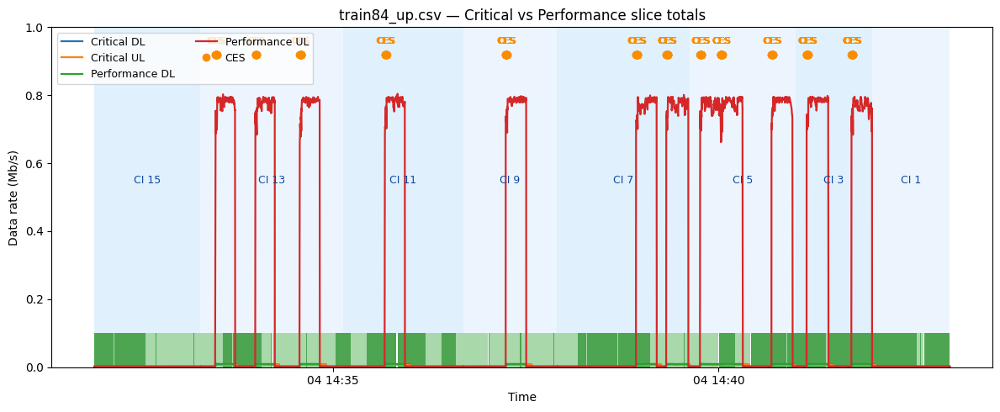

Saved: _base_train_runs/plots/train84_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


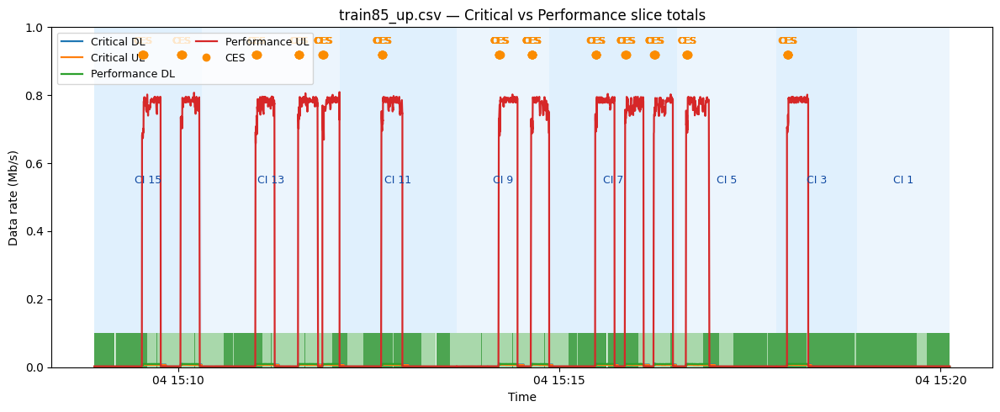

Saved: _base_train_runs/plots/train85_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


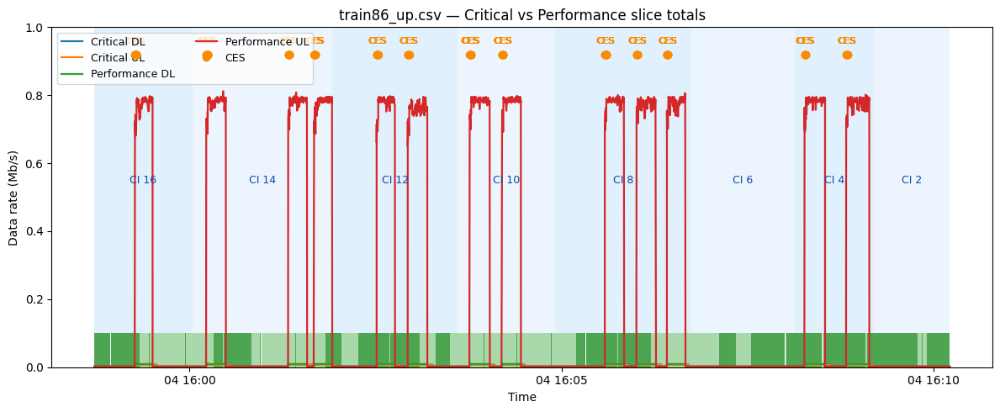

Saved: _base_train_runs/plots/train86_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


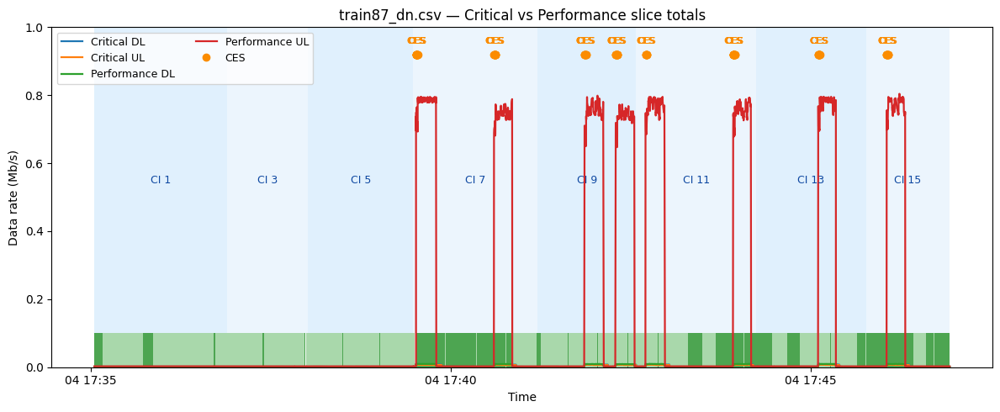

Saved: _base_train_runs/plots/train87_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


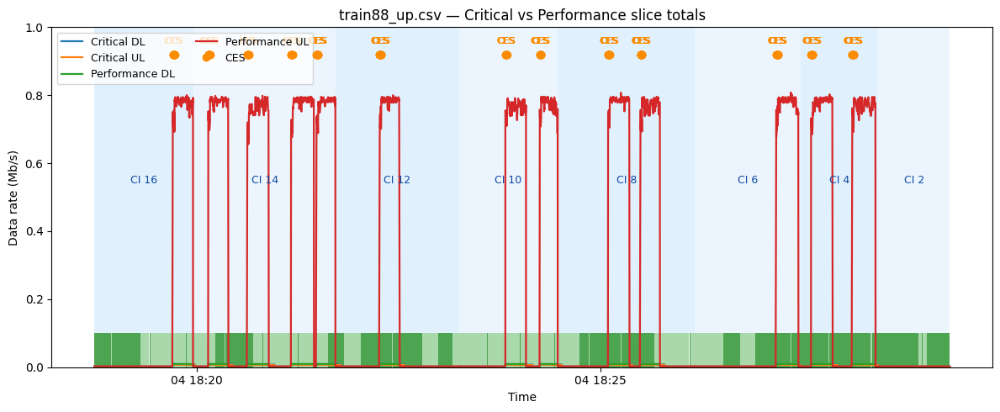

Saved: _base_train_runs/plots/train88_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


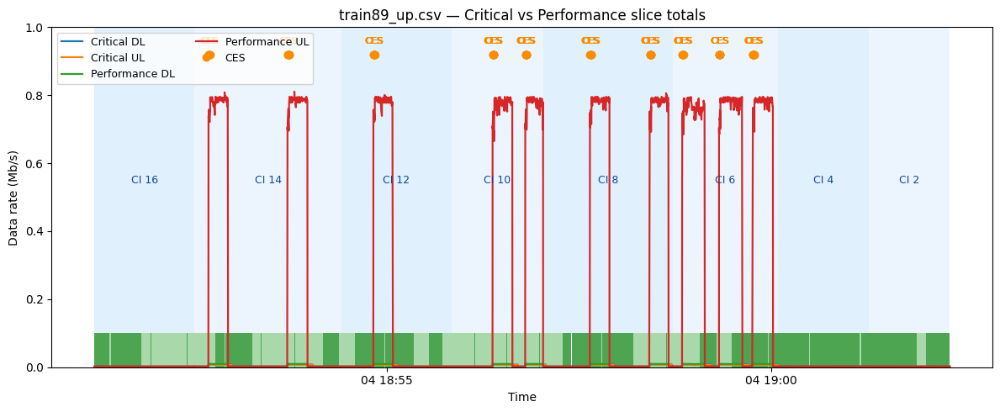

Saved: _base_train_runs/plots/train89_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


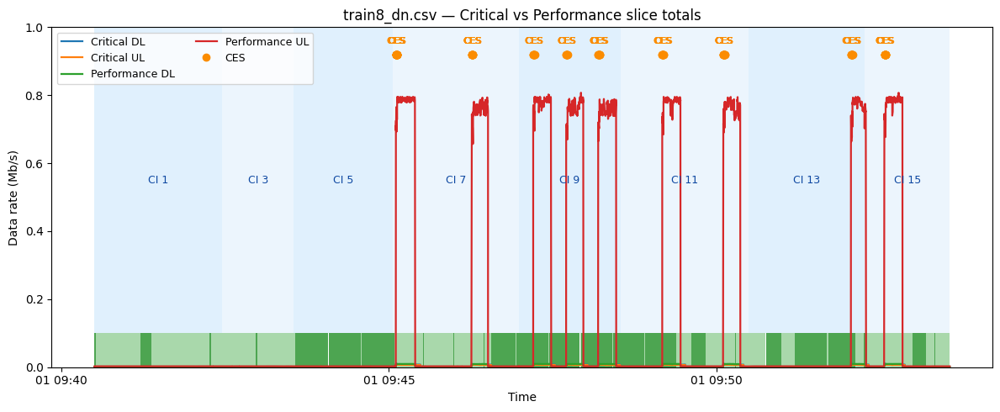

Saved: _base_train_runs/plots/train8_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


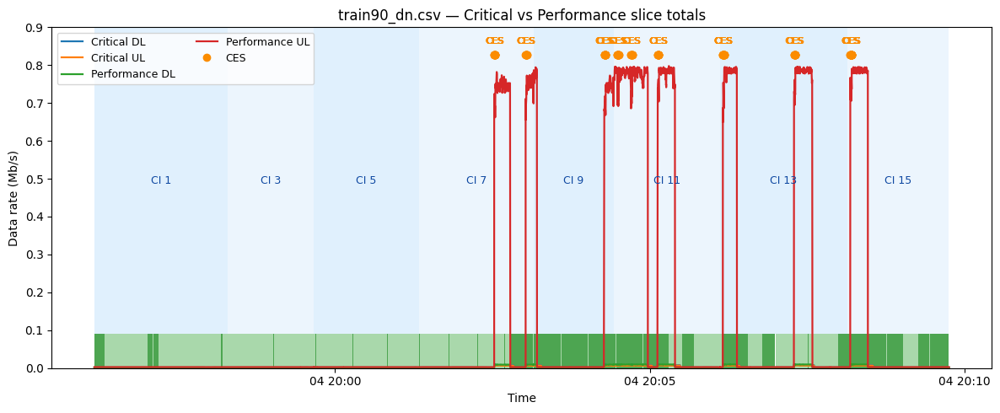

Saved: _base_train_runs/plots/train90_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


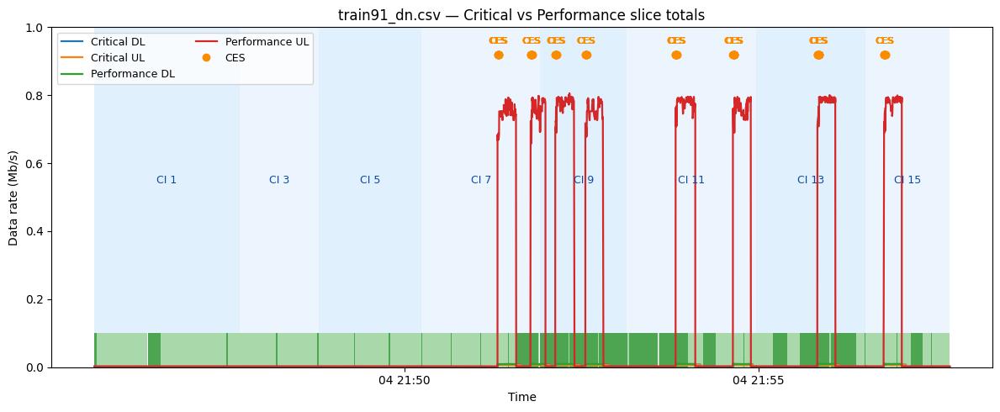

Saved: _base_train_runs/plots/train91_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


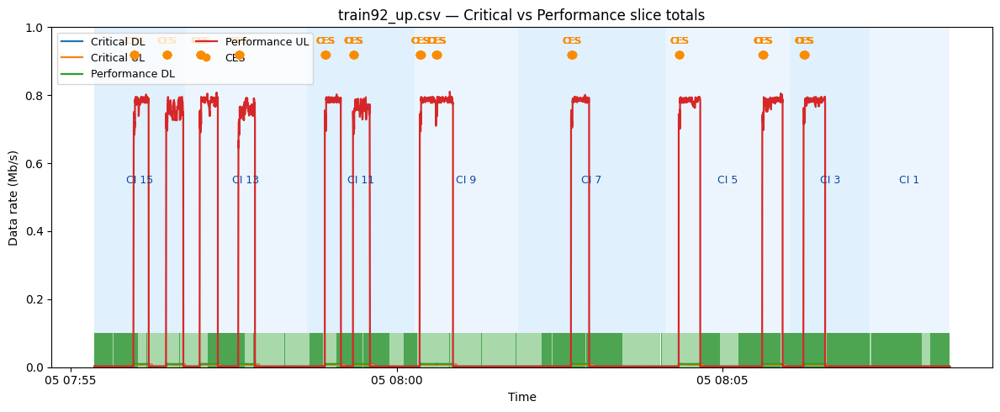

Saved: _base_train_runs/plots/train92_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


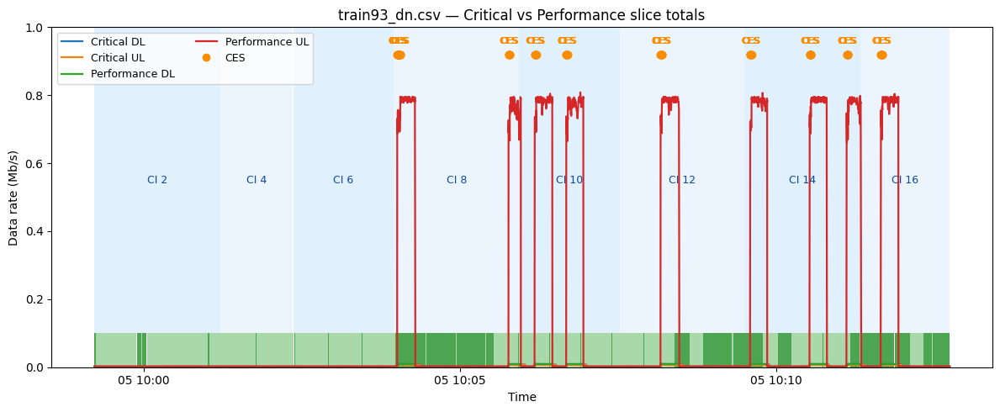

Saved: _base_train_runs/plots/train93_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


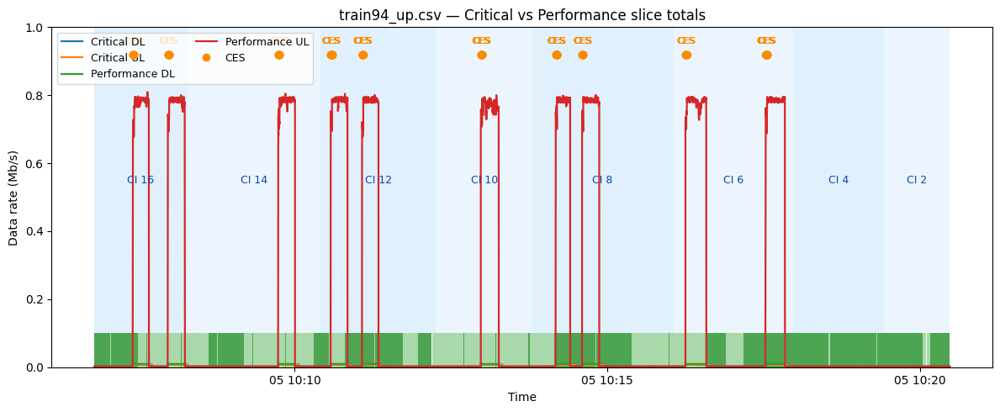

Saved: _base_train_runs/plots/train94_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


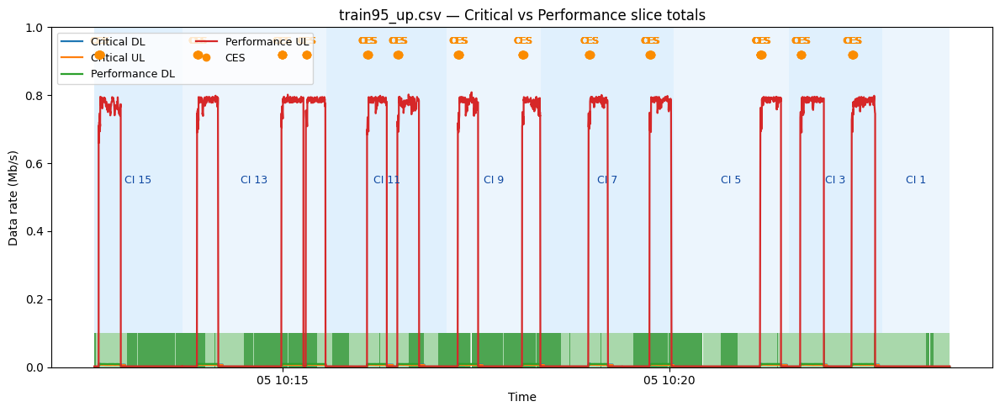

Saved: _base_train_runs/plots/train95_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


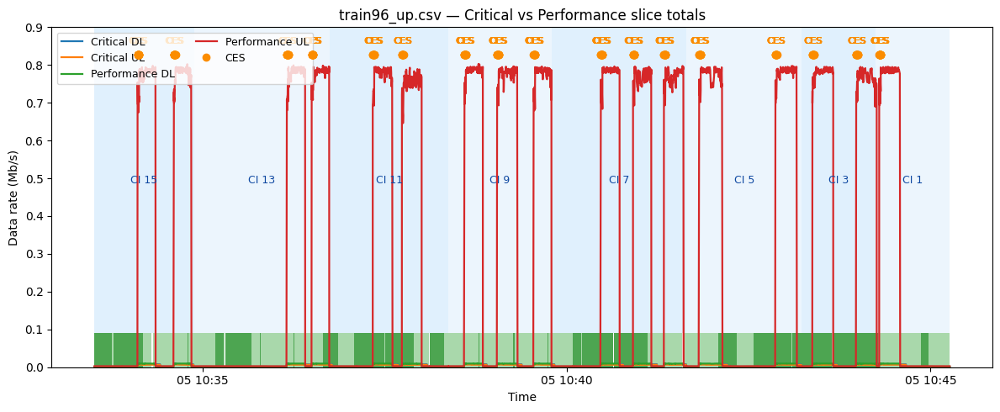

Saved: _base_train_runs/plots/train96_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


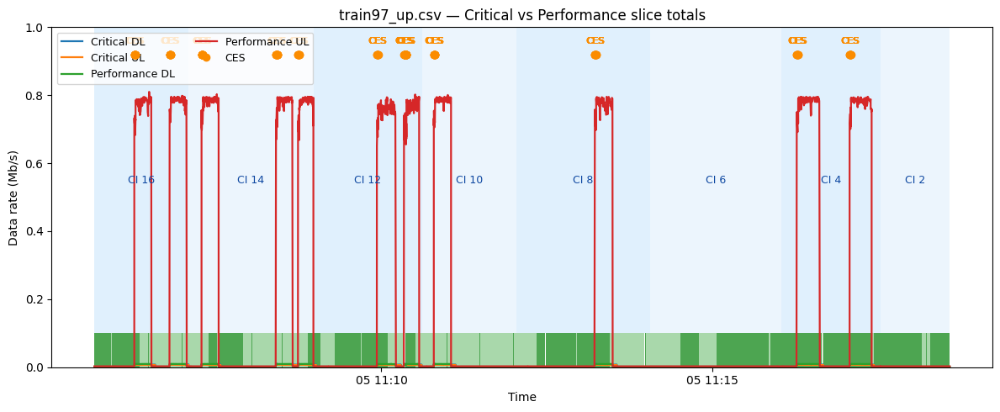

Saved: _base_train_runs/plots/train97_up_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


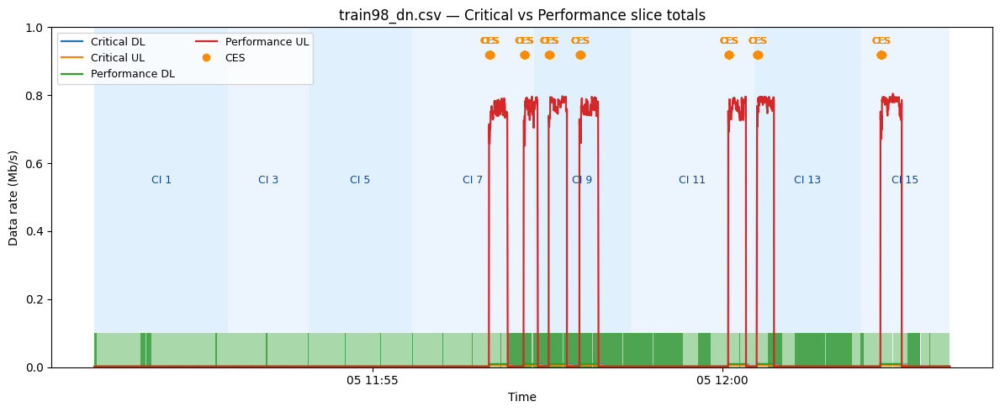

Saved: _base_train_runs/plots/train98_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


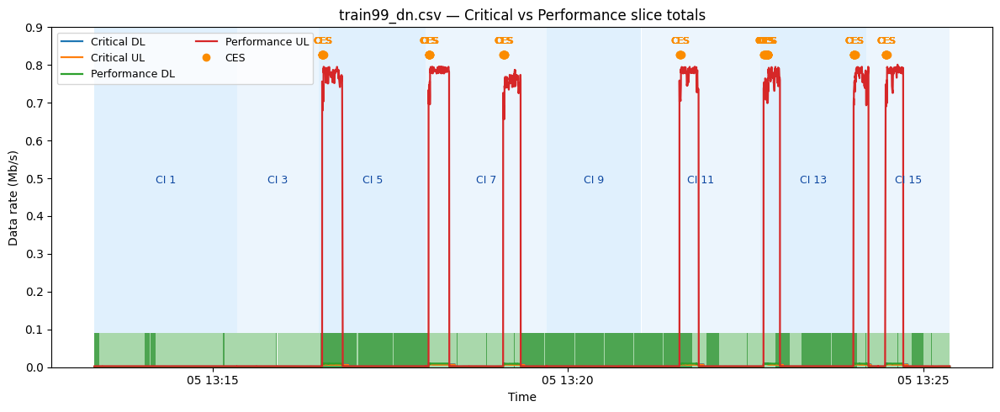

Saved: _base_train_runs/plots/train99_dn_SLICE_TOTALS_CI.png


/tmp/ipykernel_628878/158216102.py:28: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  x_span = t.fillna(method="ffill").fillna(method="bfill")


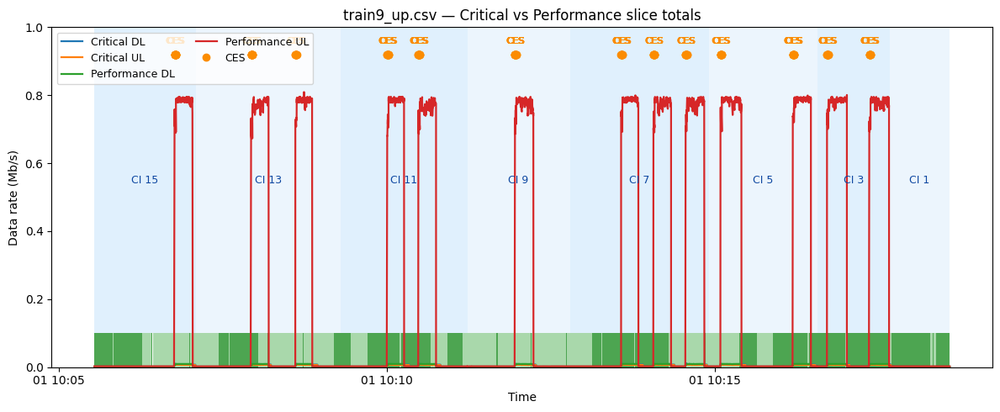

Saved: _base_train_runs/plots/train9_up_SLICE_TOTALS_CI.png


In [6]:
# Plot quality-check figures for the processed base train files.
#
# Inputs:
# - enriched train files in _base_train_runs
#
# Outputs:
# - one plot per train showing slice traffic over time
# - saved figures in _base_train_runs/plots
#
# The plots focus on the four aggregate slice columns already written by the
# event-based traffic cell and overlay the railway context needed to inspect them.
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.lines import Line2D

# Plot folders.
data_dir = Path("_base_train_runs")
hs_dir = data_dir
plot_dir = hs_dir / "plots"
plot_dir.mkdir(parents=True, exist_ok=True)

# Plotting helpers.
def _parse_time_or_index_for_plot_and_spans(df: pd.DataFrame):
    """
    Returns:
      x_plot  -> what we actually use for ax.plot() (Timestamp if valid, else sample idx)
      xlab    -> axis label ("Time" or "Sample")
      x_span  -> numeric/ordinal version of x for spans/axvspan (no NaT)
    """
    if "Timestamp" in df.columns:
        t = pd.to_datetime(df["Timestamp"], errors="coerce")
        if t.notna().any():
            x_plot = t
            # fill gaps for span math
            x_span = t.fillna(method="ffill").fillna(method="bfill")
            if x_span.notna().sum() == 0:
                idx = np.arange(len(df))
                return x_plot, "Time", idx
            return x_plot, "Time", x_span
    # fallback: integer samples
    idx = np.arange(len(df))
    return idx, "Sample", idx


def _runs(series: pd.Series | None):
    """
    Break a categorical-like series into contiguous runs.
    Returns list of (start_idx, end_idx, label_str)
    """
    if series is None:
        return []
    changed = series != series.shift()
    run_ids = changed.cumsum().fillna(0).astype(int)
    tmp = pd.DataFrame({"val": series})
    tmp["_idx"] = np.arange(len(series))
    blocks = []
    for _, grp in tmp.groupby(run_ids, sort=False):
        start = int(grp["_idx"].iloc[0])
        end   = int(grp["_idx"].iloc[-1])
        label = str(grp["val"].iloc[0])
        blocks.append((start, end, label))
    return blocks


# Traffic columns to plot.
# Values are stored in kb/s in the CSV output.
RATE_COLS = [
    ("critical_DL",  "Critical DL"),
    ("critical_UL",  "Critical UL"),
    ("perform_DL",   "Performance DL"),
    ("perform_UL",   "Performance UL"),
]

# Colors for the four plotted series.
palette = [
    "#1f77b4",  # Critical DL
    "#ff7f0e",  # Critical UL
    "#2ca02c",  # Perf DL
    "#d62728",  # Perf UL
]

# Load all CSV files in the input folder.
files = sorted({p for p in hs_dir.glob("*.csv")})
if not files:
    raise FileNotFoundError(f"No *.csv files found in {hs_dir.resolve()}")

for f in files:
    # Read the train file.
    df = pd.read_csv(f)

    # Parse Timestamp for plotting.
    if "Timestamp" in df.columns:
        df["Timestamp"] = pd.to_datetime(df["Timestamp"], errors="coerce")

    # Build x-axis values.
    x_plot, xlab, x_span = _parse_time_or_index_for_plot_and_spans(df)
    # Build a non-NaT reference for scatter markers.
    x_points = pd.Series(x_plot).where(pd.Series(x_plot).notna(), pd.Series(x_span))

    # Build CI segments and event overlays.
    ci_runs = _runs(df["CI"] if "CI" in df.columns else None)

    # NID_BG could be integer in df, or was NID_C/NID_BG text originally.
    if "NID_BG" in df.columns:
        nidbg_series = df["NID_BG"]
    elif "NID_C/NID_BG" in df.columns:
        nidbg_series = (
            df["NID_C/NID_BG"]
            .astype(str)
            .str.extract(r"\bNID_BG\b\s*[:=]\s*(\d+)", expand=False)
        )
    else:
        nidbg_series = None
    nidbg_runs = _runs(nidbg_series)

    ces = pd.to_numeric(df["CES"], errors="coerce") if "CES" in df.columns else pd.Series([0]*len(df))
    estop = pd.to_numeric(df["EStop"], errors="coerce") if "EStop" in df.columns else pd.Series([0]*len(df))

    # Convert kb/s -> Mb/s
    def kbps_to_mbps(series: pd.Series) -> pd.Series:
        s = pd.to_numeric(series, errors="coerce").fillna(0.0)
        return s / 1000.0

    present = [(c, lab) for (c, lab) in RATE_COLS if c in df.columns]
    if not present:
        print(f"Skip {f.name}: none of {', '.join(col for col,_ in RATE_COLS)} found.")
        continue

    rate_series = [kbps_to_mbps(df[c]) for c, _ in present]

    # y-limit headroom
    rmax = max((float(s.max()) for s in rate_series), default=0.0)
    ymax = max(0.5, math.ceil(rmax * 1.12 * 10) / 10.0)

    # Colors for background overlays
    green_dark  = "#43A047"
    green_light = "#A5D6A7"
    blue_light1 = "#90CAF9"
    blue_light2 = "#BBDEFB"
    orange = "#FB8C00"
    red    = "#E53935"

    fig, ax = plt.subplots(figsize=(12, 5))

    # Plot each slice total (Critical DL/UL, Performance DL/UL)
    lines = []
    for i, (col, label) in enumerate(present):
        y = rate_series[i]
        ln, = ax.plot(
            x_plot,
            y,
            linewidth=1.6,
            label=label,
            color=palette[i % len(palette)],
        )
        lines.append(ln)

    ax.set_xlabel(xlab)
    ax.set_ylabel("Data rate (Mb/s)")
    ax.set_ylim(0, ymax)
    plt.subplots_adjust(top=0.90)

    # --- bottom band: NID_BG ownership strip (green shades) ---
    bottom_band_height = 0.10
    for i, (start, end, _) in enumerate(nidbg_runs):
        x_start = x_span[start]; x_end = x_span[end]
        if pd.isna(x_start) or pd.isna(x_end):
            continue
        ax.axvspan(
            x_start,
            x_end,
            ymin=0.0,
            ymax=bottom_band_height,
            facecolor=(green_dark if i % 2 == 0 else green_light),
            edgecolor="none",
            alpha=0.95,
        )

    # --- CI windows (blue shades) + label "CI <value>" ---
    for i, (start, end, label) in enumerate(ci_runs):
        x_start = x_span[start]; x_end = x_span[end]
        if pd.isna(x_start) or pd.isna(x_end):
            continue
        ax.axvspan(
            x_start,
            x_end,
            ymin=bottom_band_height,
            ymax=1.0,
            facecolor=(blue_light1 if i % 2 == 0 else blue_light2),
            edgecolor="none",
            alpha=0.28,
        )
        # place label roughly mid run
        try:
            x_mid = x_start + (x_end - x_start) / 2
        except Exception:
            x_mid = (x_start + x_end) / 2
        ax.text(
            x_mid,
            ymax * 0.55,
            f"CI {label}",
            ha="center",
            va="center",
            fontsize=9,
            color="#0D47A1",
        )

    # --- CES markers near top ---
    if (ces == 1).any():
        idx_ces = np.where(ces == 1)[0]
        y_ces = np.full(len(idx_ces), ymax * 0.92)
        ax.scatter(
            x_points.iloc[idx_ces],
            y_ces,
            s=36,
            c=orange,
            zorder=7,
        )
        for xi in idx_ces:
            ax.annotate(
                "CES",
                (x_points.iloc[xi], ymax * 0.92),
                textcoords="offset points",
                xytext=(0, 8),
                ha="center",
                va="bottom",
                fontsize=8,
                color=orange,
            )

    # --- EStop markers (red), at instantaneous max across the plotted series ---
    if (estop == 1).any():
        idx_es = np.where(estop == 1)[0]
        stack = np.vstack([s.to_numpy() for s in rate_series])
        y_es = stack.max(axis=0)[idx_es]
        ax.scatter(
            x_points.iloc[idx_es],
            y_es,
            s=40,
            c=red,
            zorder=8,
        )

    # --- Legend ---
    legend_handles = lines[:]
    if (ces == 1).any():
        legend_handles.append(
            Line2D([0], [0], marker='o', linestyle='None', markersize=6,
                   color=orange, label='CES')
        )
    if (estop == 1).any():
        legend_handles.append(
            Line2D([0], [0], marker='o', linestyle='None', markersize=6,
                   color=red, label='EStop')
        )
    ax.legend(handles=legend_handles, loc="upper left", ncols=2, fontsize=9)

    ax.set_title(f"{f.name} — Critical vs Performance slice totals")
    plt.tight_layout()

    out_png = plot_dir / f"{f.stem}_SLICE_TOTALS_CI.png"
    fig.savefig(out_png, dpi=150)
    plt.show()
    print(f"Saved: {out_png}")


## 3. Build STG Dataset Outputs

## 3A. Create STGdata_A

Saved dataset: STGdata_A/data/STGdata_A.csv
Wrote per-train inputs to: /home/me/contrib3/FRMCS_traffic_STGDdataset/STGdata_A/input_trains
Track dn length: 8 | entry_dn=1 | entry_up=15
Simulated steps: 50303 | time range: 0 .. 12575.50 s
Loaded trains: 183 | Produced long rows: 474156


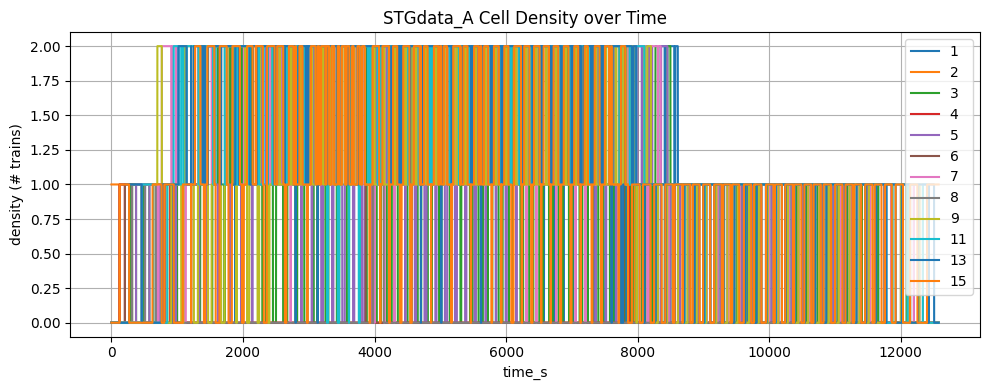

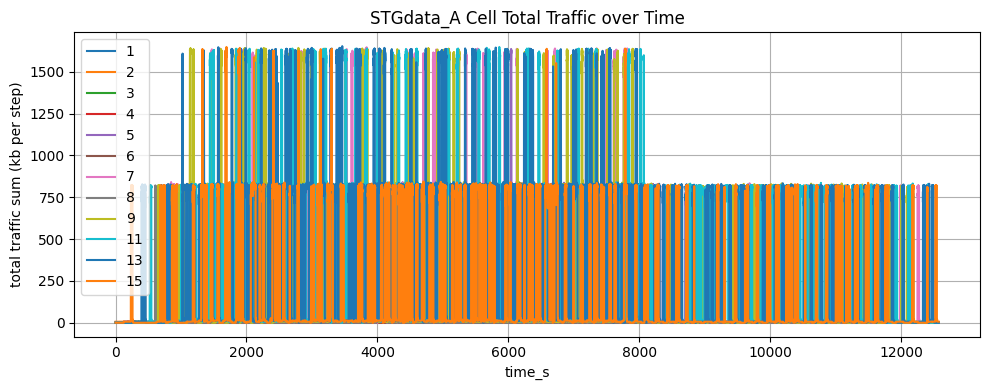

Saved plots: STGdata_A/data/STGdata_A_cell_density.png, STGdata_A/data/STGdata_A_cell_total_traffic.png
Plotted CIs for STGdata_A: [7, 11, 13, 1, 5, 9, 15, 3, 8, 6, 2, 4]


In [7]:
# Build STGdata_A from the enriched base train files.
#
# Inputs:
# - _base_train_runs/train*.csv with traffic features already added
# - cell_gnb_relation.csv for the CI-to-gNB mapping
#
# Outputs:
# - STGdata_A/data/STGdata_A.csv with the aggregated spatiotemporal dataset
# - STGdata_A/input_trains/train_XXXXX_<direction>.csv with per-train timelines
#
# Processing outline:
# - load and normalize each train file
# - align train rows with the mapped railway cells and gNB assignments
# - infer the reference down-track ordering from the available trains
# - inject trains on the single-track baseline schedule
# - build the aggregated dataset and the per-train outputs

from pathlib import Path
import pandas as pd
import numpy as np
import re
from typing import Optional

# Base paths and dataset outputs.
BASE_DIR = Path("_base_train_runs")
TRAINS_GLOB = "train*.csv"

CELL_GNB_PATH = Path("cell_gnb_relation.csv")
OUT_PATH = Path("STGdata_A/data/STGdata_A.csv")

OUT_TRAINS_DIR = Path("STGdata_A/input_trains")

ROW_INTERVAL_S = 0.25

# Aggregate traffic columns expected from the event-based traffic cell.
CRIT_DL_COL = "critical_DL"
CRIT_UL_COL = "critical_UL"
PERF_DL_COL = "perform_DL"
PERF_UL_COL = "perform_UL"

LOOKAHEAD_MAX_STEPS = None

# Features preserved in the per-train outputs.
# These columns are carried into the simulation output whenever they are present.
INTERESTING_FEATURES = [
    "CI",
    "D_LRBG",
    "HO_state",
    "Neighbor_Cell",
    "CQI_wb",
    "UL_SNR_wb",
    "CES",
    "EStop",
    "V_TRAIN",
    "NID_BG",
    "voice_DL_kb",
    "voice_UL_kb",
    "etcs_DL_kb",
    "etcs_UL_kb",
    "ato_DL_kb",
    "ato_UL_kb",
    "remote_engine_ctrl_DL_kb",
    "remote_engine_ctrl_UL_kb",
    "pub_warn_DL_kb",
    "pub_warn_UL_kb",
    "telemetry_nc_DL_kb",
    "telemetry_nc_UL_kb",
    "equip_ctl_DL_kb",
    "equip_ctl_UL_kb",
    "asset_tel_DL_kb",
    "asset_tel_UL_kb",
    "pis_DL_kb",
    "pis_UL_kb",
    "video_surv_DL_kb",
    "video_surv_UL_kb",
    CRIT_DL_COL,
    CRIT_UL_COL,
    PERF_DL_COL,
    PERF_UL_COL,
]

# Traffic-valued feature columns that should be converted to numeric and defaulted to 0.0.
TRAFFIC_KB_COLS = [
    "voice_DL_kb","voice_UL_kb",
    "etcs_DL_kb","etcs_UL_kb",
    "ato_DL_kb","ato_UL_kb",
    "remote_engine_ctrl_DL_kb","remote_engine_ctrl_UL_kb",
    "pub_warn_DL_kb","pub_warn_UL_kb",
    "telemetry_nc_DL_kb","telemetry_nc_UL_kb",
    "equip_ctl_DL_kb","equip_ctl_UL_kb",
    "asset_tel_DL_kb","asset_tel_UL_kb",
    "pis_DL_kb","pis_UL_kb",
    "video_surv_DL_kb","video_surv_UL_kb",
    CRIT_DL_COL, CRIT_UL_COL, PERF_DL_COL, PERF_UL_COL,
]


# CSV header detection and parsing helpers.
def find_header_line(path, max_lines=200):
    probe_cols = [
        "msg_idx", "Timestamp", "User Distance", "Arrow Tooltip", "Arrow Title",
        "LAC", "CI", "HO", "V_TRAIN", "V_TRAIN (Km/h)", "NID_BG", "NID_C/NID_BG",
        "M_MODE", "DL Rxqual", "UL Rxqual",
        "D_LRBG", "HO_state", "CQI_wb", "CES", "EStop",
        CRIT_DL_COL, CRIT_UL_COL, PERF_DL_COL, PERF_UL_COL
    ]
    norm_keep = [re.sub(r"\s+", "", c) for c in probe_cols]

    lines = []
    with open(path, "r", errors="ignore") as f:
        for _ in range(max_lines):
            try:
                lines.append(next(f))
            except StopIteration:
                break

    best_idx, best_score = 0, -1
    for i, line in enumerate(lines):
        line_norm = re.sub(r"\s+", "", line.strip())
        score = sum(1 for k in norm_keep if k in line_norm)
        score += max(line.count(","), line.count(";"), line.count("\t"), line.count("|")) // 5
        if score > best_score:
            best_idx, best_score = i, score
    return best_idx


def read_csv_generic(path: Path) -> pd.DataFrame:
    hdr = find_header_line(path)
    last_err = None
    for sep in (",", ";", "\t"):
        try:
            df = pd.read_csv(path, sep=sep, header=0, skiprows=hdr)
            df.columns = [str(c).strip() for c in df.columns]
            return df
        except Exception as e:
            last_err = e
            continue
    raise RuntimeError(f"CSV parse failed for {path.name}: {last_err}")


def discover_train_files(base_dir: Path):
    return sorted(list(base_dir.glob(TRAINS_GLOB)), key=lambda p: p.name.lower())


# Railway mapping and track-order helpers.
def load_ci_to_gnb(cell_gnb_path: Path) -> dict[int, int]:
    rel = pd.read_csv(cell_gnb_path)
    rel.columns = [str(c).strip() for c in rel.columns]
    if "CI" not in rel.columns or "gnb" not in rel.columns:
        raise ValueError("cell_gnb_relation.csv must contain at least columns: CI, gnb")
    rel["CI"] = pd.to_numeric(rel["CI"], errors="coerce")
    rel["gnb"] = pd.to_numeric(rel["gnb"], errors="coerce")
    rel = rel.dropna(subset=["CI", "gnb"]).copy()
    return {int(ci): int(gnb) for ci, gnb in zip(rel["CI"], rel["gnb"])}


def ordered_unique_ci_list(ci_series: pd.Series) -> list[int]:
    ci = pd.to_numeric(ci_series, errors="coerce").dropna().astype(int).tolist()
    seen = set()
    out = []
    for x in ci:
        if x not in seen:
            seen.add(x)
            out.append(x)
    return out


def infer_track_dn_from_trains(trains: list[dict]) -> list[int]:
    dn = [t for t in trains if t["direction"] == "dn" and len(t["uniq_ci"]) >= 2]
    if dn:
        dn_best = max(dn, key=lambda x: len(x["uniq_ci"]))
        return dn_best["uniq_ci"]
    up = [t for t in trains if t["direction"] == "up" and len(t["uniq_ci"]) >= 2]
    if up:
        up_best = max(up, key=lambda x: len(x["uniq_ci"]))
        return list(reversed(up_best["uniq_ci"]))
    return []


# Train loading and row-alignment helpers.
def parse_direction_from_name(path: Path) -> str | None:
    stem = path.stem.lower()
    if stem.endswith("_up"):
        return "up"
    if stem.endswith("_dn"):
        return "dn"
    return None


def get_start_timestamp(df: pd.DataFrame) -> Optional[pd.Timestamp]:
    if "Timestamp" not in df.columns:
        return None
    ts = pd.to_datetime(df["Timestamp"], errors="coerce", dayfirst=True)
    return ts.dropna().iloc[0].to_pydatetime() if ts.notna().any() else None


def _ensure_cols(df: pd.DataFrame, cols: list[str]):
    for c in cols:
        if c not in df.columns:
            df[c] = np.nan
    return df


def prep_train_arrays(df: pd.DataFrame, ci_to_gnb: dict[int, int]) -> dict:
    """
    Prepares:
      - numpy arrays used for simulation (CI, gnb, n_steps)
      - a per-row feature dataframe (feat_df) restricted to INTERESTING_FEATURES
        aligned to the same filtered/sorted rows used in the arrays.
    """
    out = df.copy()
    out.columns = [str(c).strip() for c in out.columns]

    # stable sort by Timestamp if exists
    if "Timestamp" in out.columns:
        ts = pd.to_datetime(out["Timestamp"], errors="coerce", dayfirst=True)
        if ts.notna().any():
            out = (
                out.assign(_ts_sort=ts)
                   .sort_values("_ts_sort", kind="stable")
                   .drop(columns=["_ts_sort"])
                   .reset_index(drop=True)
            )

    # ensure CI exists for filtering
    out = _ensure_cols(out, ["CI"])

    # filter to mapped CI
    ci_num = pd.to_numeric(out["CI"], errors="coerce").dropna().astype(int)
    mask = ci_num.isin(list(ci_to_gnb.keys()))
    kept_idx = ci_num[mask].index
    if len(kept_idx) == 0:
        return {"ok": False}

    out = out.loc[kept_idx].reset_index(drop=True)

    # ensure all interesting features exist (missing -> NaN)
    out = _ensure_cols(out, INTERESTING_FEATURES)

    # coerce some key fields
    out["CI"] = pd.to_numeric(out["CI"], errors="coerce")
    out["CQI_wb"] = pd.to_numeric(out["CQI_wb"], errors="coerce")
    out["UL_SNR_wb"] = pd.to_numeric(out["UL_SNR_wb"], errors="coerce")  # <-- add
    out["CES"] = pd.to_numeric(out["CES"], errors="coerce").fillna(0).astype(int)
    out["EStop"] = pd.to_numeric(out["EStop"], errors="coerce").fillna(0).astype(int)
    out["V_TRAIN"] = pd.to_numeric(out["V_TRAIN"], errors="coerce")


    # traffic kb columns -> numeric with 0 fill
    for c in TRAFFIC_KB_COLS:
        if c in out.columns:
            out[c] = pd.to_numeric(out[c], errors="coerce").fillna(0.0)

    # arrays for simulation
    ci_arr = pd.to_numeric(out["CI"], errors="coerce").astype("Int64").astype(float).astype(int).to_numpy()
    gnb_arr = np.array([ci_to_gnb.get(int(x), -1) for x in ci_arr], dtype=int)

    uniq_ci = ordered_unique_ci_list(out["CI"])

    # this is the aligned feature table we will index by pos during simulation
    feat_df = out[INTERESTING_FEATURES].copy()

    return {
        "ok": True,
        "ci": ci_arr,
        "gnb": gnb_arr,
        "uniq_ci": uniq_ci,
        "n_steps": len(ci_arr),
        "feat_df": feat_df,
    }


# Train-movement simulation.
def conflicts_same_direction(ci_new: np.ndarray, gnb_new: np.ndarray,
                            ci_old: np.ndarray, gnb_old: np.ndarray) -> bool:
    if ci_new.size == 0:
        return False
    if np.any(ci_new == ci_old):
        return True
    if np.any(gnb_new == gnb_old):
        return True
    return False


def can_inject_train_now(candidate: dict, active: list[dict], dir_: str, entry_ci: int, entry_gnb: int) -> bool:
    if int(candidate["ci"][0]) != int(entry_ci):
        return False

    occ_ci = set()
    occ_gnb = set()
    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        if pos < a["n_steps"]:
            occ_ci.add(int(a["ci"][pos]))
            occ_gnb.add(int(a["gnb"][pos]))

    if entry_ci in occ_ci:
        return False
    if entry_gnb in occ_gnb:
        return False

    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        overlap = min(a["n_steps"] - pos, candidate["n_steps"])
        if LOOKAHEAD_MAX_STEPS is not None:
            overlap = min(overlap, int(LOOKAHEAD_MAX_STEPS))
        if overlap <= 0:
            continue

        if conflicts_same_direction(
            candidate["ci"][:overlap], candidate["gnb"][:overlap],
            a["ci"][pos:pos+overlap], a["gnb"][pos:pos+overlap]
        ):
            return False

    return True


def can_place_midtrack_at_t0(candidate: dict, active: list[dict], dir_: str) -> bool:
    occ_ci = set()
    occ_gnb = set()
    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        occ_ci.add(int(a["ci"][pos]))
        occ_gnb.add(int(a["gnb"][pos]))

    ci0 = int(candidate["ci"][0])
    g0 = int(candidate["gnb"][0])
    if ci0 in occ_ci:
        return False
    if g0 in occ_gnb:
        return False

    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        overlap = min(a["n_steps"] - pos, candidate["n_steps"])
        if LOOKAHEAD_MAX_STEPS is not None:
            overlap = min(overlap, int(LOOKAHEAD_MAX_STEPS))
        if overlap <= 0:
            continue

        if conflicts_same_direction(
            candidate["ci"][:overlap], candidate["gnb"][:overlap],
            a["ci"][pos:pos+overlap], a["gnb"][pos:pos+overlap]
        ):
            return False

    return True


def simulate_and_build_long(trains: list[dict], track_dn: list[int], ci_to_gnb: dict[int, int]) -> pd.DataFrame:
    if not track_dn:
        raise ValueError("Could not infer track order. Need at least one usable dn (or up) train.")

    track_up = list(reversed(track_dn))
    entry_dn = int(track_dn[0])
    entry_up = int(track_up[0])

    entry_dn_gnb = int(ci_to_gnb.get(entry_dn, -1))
    entry_up_gnb = int(ci_to_gnb.get(entry_up, -1))

    midtrack_pool = {"dn": [], "up": []}
    waiting = {"dn": [], "up": []}

    for t in trains:
        d = t["direction"]
        if d not in ("dn", "up"):
            continue
        entry_ci = entry_dn if d == "dn" else entry_up
        if int(t["ci"][0]) == int(entry_ci):
            waiting[d].append(t)
        else:
            midtrack_pool[d].append(t)

    def _sort_key(t):
        return (pd.isna(t["start_ts"]), t["start_ts"], t["name"].lower())
    for d in ("dn", "up"):
        midtrack_pool[d].sort(key=_sort_key)
        waiting[d].sort(key=_sort_key)

    active = []

    # t=0 midtrack placement
    for d in ("dn", "up"):
        kept = []
        for cand in midtrack_pool[d]:
            if can_place_midtrack_at_t0(cand, active, d):
                kept.append(cand)
                active.append({**cand, "pos": 0})
        midtrack_pool[d] = kept

    def try_inject_one(dir_: str):
        nonlocal active
        entry_ci = entry_dn if dir_ == "dn" else entry_up
        entry_g = entry_dn_gnb if dir_ == "dn" else entry_up_gnb
        q = waiting[dir_]
        for i, cand in enumerate(q):
            if can_inject_train_now(cand, active, dir_, entry_ci, entry_g):
                active.append({**cand, "pos": 0})
                del q[i]
                return True
        return False

    long_rows = []
    step = 0

    while True:
        if not active and not waiting["dn"] and not waiting["up"]:
            break

        try_inject_one("dn")
        try_inject_one("up")

        time_s = step * ROW_INTERVAL_S

        for a in active:
            pos = a["pos"]
            if pos >= a["n_steps"]:
                continue

            ci = int(a["ci"][pos])
            g = int(a["gnb"][pos])

            # pull the full interesting feature row (aligned to pos)
            feat_row = a["feat_df"].iloc[pos].to_dict()

            # build long row with indices + gnb + features
            row = {
                "time_s": time_s,
                "step": step,
                "train_id": a["train_id"],
                "direction": a["direction"],
                "pos": pos,
                "gnb": g,  # always include
            }
            row.update(feat_row)

            # enforce CI/gnb consistency (CI in feat_row might be float)
            row["CI"] = ci
            row["gnb"] = g

            long_rows.append(row)

        for a in active:
            a["pos"] += 1

        active = [a for a in active if a["pos"] < a["n_steps"]]
        step += 1

        if step > 500000:
            raise RuntimeError("Safety stop: too many steps. Check data or injection logic.")

    if not long_rows:
        # include columns for downstream safety
        base_cols = ["time_s","step","train_id","direction","pos","gnb"] + INTERESTING_FEATURES
        base_cols = list(dict.fromkeys(base_cols))
        return pd.DataFrame(columns=base_cols)

    return pd.DataFrame(long_rows)


# Per-train output writers.
def write_per_train_timelines(long_df: pd.DataFrame, out_dir: Path):
    out_dir.mkdir(parents=True, exist_ok=True)

    long_df = long_df.sort_values(["train_id", "step"], kind="stable").reset_index(drop=True)

    # Put indices first, then features
    cols = ["train_id","direction","step","time_s","pos","CI","gnb"] + [c for c in INTERESTING_FEATURES if c not in ("CI",)]
    cols = [c for c in cols if c in long_df.columns]

    for train_id, g in long_df.groupby("train_id", sort=True):
        direction = str(g["direction"].iloc[0]) if "direction" in g.columns and len(g) else "na"
        fname = f"train_{int(train_id):05d}_{direction}.csv"
        g.loc[:, cols].to_csv(out_dir / fname, index=False)


# Aggregation helpers.
def agg_train_ids(s):
    return sorted(pd.unique(s.dropna().astype(int)))


def build_full_grid(agg: pd.DataFrame, ci_list: list[int], max_step: int) -> pd.DataFrame:
    time_vals = np.arange(max_step + 1, dtype=int) * ROW_INTERVAL_S
    full_index = pd.MultiIndex.from_product([time_vals, ci_list], names=["time_s", "CI"])
    out = agg.set_index(["time_s", "CI"]).reindex(full_index).reset_index()
    return out


# Dataset plot helper.
def plot_stg_dataset_from_df(df: pd.DataFrame, dataset_name: str, out_path: Path, top_n: int = 12):
    import matplotlib.pyplot as plt

    needed = {"time_s", "CI", "density", "total_traffic_sum"}
    missing = needed - set(df.columns)
    if missing:
        print(f"[plot skip] {dataset_name}: missing columns {missing}")
        return

    plot_df = df.copy()
    plot_df["time_s"] = pd.to_numeric(plot_df["time_s"], errors="coerce")
    plot_df["CI"] = pd.to_numeric(plot_df["CI"], errors="coerce")
    plot_df["density"] = pd.to_numeric(plot_df["density"], errors="coerce").fillna(0)
    plot_df["total_traffic_sum"] = pd.to_numeric(plot_df["total_traffic_sum"], errors="coerce").fillna(0)
    plot_df = plot_df.dropna(subset=["time_s", "CI"]).copy()
    plot_df["CI"] = plot_df["CI"].astype(int)

    if top_n is not None:
        top_cis = (
            plot_df.groupby("CI")["density"]
                   .mean()
                   .sort_values(ascending=False)
                   .head(top_n)
                   .index
                   .tolist()
        )
        plot_df = plot_df[plot_df["CI"].isin(top_cis)].copy()
    else:
        top_cis = sorted(plot_df["CI"].unique().tolist())

    fig, ax = plt.subplots(figsize=(10, 4))
    for ci, g in plot_df.groupby("CI"):
        g = g.sort_values("time_s")
        ax.plot(g["time_s"], g["density"], label=str(ci))
    ax.set_xlabel("time_s")
    ax.set_ylabel("density (# trains)")
    ax.set_title(f"{dataset_name} Cell Density over Time")
    ax.grid(True)
    ax.legend()
    fig.tight_layout()
    density_png = out_path.parent / f"{dataset_name}_cell_density.png"
    fig.savefig(density_png, dpi=200)
    plt.show()

    fig, ax = plt.subplots(figsize=(10, 4))
    for ci, g in plot_df.groupby("CI"):
        g = g.sort_values("time_s")
        ax.plot(g["time_s"], g["total_traffic_sum"], label=str(ci))
    ax.set_xlabel("time_s")
    ax.set_ylabel("total traffic sum (kb per step)")
    ax.set_title(f"{dataset_name} Cell Total Traffic over Time")
    ax.grid(True)
    ax.legend()
    fig.tight_layout()
    traffic_png = out_path.parent / f"{dataset_name}_cell_total_traffic.png"
    fig.savefig(traffic_png, dpi=200)
    plt.show()

    print(f"Saved plots: {density_png}, {traffic_png}")
    print(f"Plotted CIs for {dataset_name}: {top_cis}")

# Main dataset build routine.
def main():
    if not CELL_GNB_PATH.exists():
        raise FileNotFoundError(f"Missing mapping file: {CELL_GNB_PATH}")

    ci_to_gnb = load_ci_to_gnb(CELL_GNB_PATH)
    ci_list = sorted(ci_to_gnb.keys())

    files = discover_train_files(BASE_DIR)
    if not files:
        print(f"No {TRAINS_GLOB} found under {BASE_DIR.resolve()}")
        return

    trains = []
    for p in files:
        direction = parse_direction_from_name(p)
        if direction is None:
            continue

        df = read_csv_generic(p)
        arr = prep_train_arrays(df, ci_to_gnb)
        if not arr.get("ok", False):
            continue

        start_ts = get_start_timestamp(df)

        trains.append({
            "name": p.name,
            "path": p,
            "direction": direction,
            "start_ts": start_ts,
            **arr
        })

    if not trains:
        print("No usable trains after loading.")
        return

    # Assign stable train_id by start timestamp then name
    trains_sorted = sorted(trains, key=lambda t: (pd.isna(t["start_ts"]), t["start_ts"], t["name"].lower()))
    for i, t in enumerate(trains_sorted, start=1):
        t["train_id"] = i

    track_dn = infer_track_dn_from_trains(trains_sorted)
    if not track_dn:
        raise ValueError("Could not infer track order from available trains.")

    # Build long_df with the FULL interesting feature set
    long_df = simulate_and_build_long(trains_sorted, track_dn=track_dn, ci_to_gnb=ci_to_gnb)

    if long_df.empty:
        print("Simulation produced no rows (nothing injected or all filtered).")
        return

    # Write per-train inputs AFTER injection schedule is computed
    write_per_train_timelines(long_df, OUT_TRAINS_DIR)

    # Aggregate by (time_s, CI) using the aggregated columns
    grouped = long_df.groupby(["time_s", "CI"], sort=False)

    agg = grouped.agg(
        density=("train_id", "nunique"),
        train_ids=("train_id", agg_train_ids),
        CES_count=("CES", "sum"),
        EStop_count=("EStop", "sum"),
        avg_speed_kmh=("V_TRAIN", "mean"),
        critical_DL_sum=(CRIT_DL_COL, "sum"),
        critical_UL_sum=(CRIT_UL_COL, "sum"),
        perform_DL_sum=(PERF_DL_COL, "sum"),
        perform_UL_sum=(PERF_UL_COL, "sum"),
    ).reset_index()

    agg["total_traffic_sum"] = (
        agg["critical_DL_sum"].fillna(0)
        + agg["critical_UL_sum"].fillna(0)
        + agg["perform_DL_sum"].fillna(0)
        + agg["perform_UL_sum"].fillna(0)
    )

    max_step = int(long_df["step"].max())
    agg_full = build_full_grid(agg, ci_list=ci_list, max_step=max_step)

    agg_full["density"] = agg_full["density"].fillna(0).astype(int)
    agg_full["train_ids"] = agg_full["train_ids"].apply(lambda x: x if isinstance(x, list) else [])
    agg_full["CES_count"] = agg_full["CES_count"].fillna(0).astype(int)
    agg_full["EStop_count"] = agg_full["EStop_count"].fillna(0).astype(int)

    for c in ["critical_DL_sum", "critical_UL_sum", "perform_DL_sum", "perform_UL_sum", "total_traffic_sum"]:
        agg_full[c] = agg_full[c].fillna(0.0)

    agg_full["gnb"] = agg_full["CI"].map(lambda x: ci_to_gnb.get(int(x), np.nan))

    agg_full = agg_full[[
        "time_s", "CI", "gnb",
        "density", "train_ids",
        "CES_count", "EStop_count",
        "avg_speed_kmh",
        "critical_DL_sum", "critical_UL_sum",
        "perform_DL_sum", "perform_UL_sum",
        "total_traffic_sum"
    ]]

    agg_full = agg_full.sort_values(["time_s", "gnb", "CI"], kind="stable").reset_index(drop=True)

    OUT_PATH.parent.mkdir(parents=True, exist_ok=True)
    agg_full.to_csv(OUT_PATH, index=False)

    entry_dn = track_dn[0]
    entry_up = list(reversed(track_dn))[0]
    print(f"Saved dataset: {OUT_PATH}")
    print(f"Wrote per-train inputs to: {OUT_TRAINS_DIR.resolve()}")
    print(f"Track dn length: {len(track_dn)} | entry_dn={entry_dn} | entry_up={entry_up}")
    print(f"Simulated steps: {max_step + 1} | time range: 0 .. {max_step * ROW_INTERVAL_S:.2f} s")
    print(f"Loaded trains: {len(trains_sorted)} | Produced long rows: {len(long_df)}")
    plot_stg_dataset_from_df(agg_full, "STGdata_A", OUT_PATH)


if __name__ == "__main__":
    main()


## 3B. Create STGdata_B

Saved dataset: STGdata_B/data/STGdata_B.csv
Wrote per-train inputs to: /home/me/contrib3/FRMCS_traffic_STGDdataset/STGdata_B/input_trains
TrackB cells: [50740, 50750] | gNB cap2: [8] | CI cap2: [50740, 50750]
Simulated steps: 45275 | time range: 0 .. 11318.50 s
Loaded trains: 183 | Produced long rows: 474156
Note: Track B trains terminate if they ever try to leave {50750,50740}.


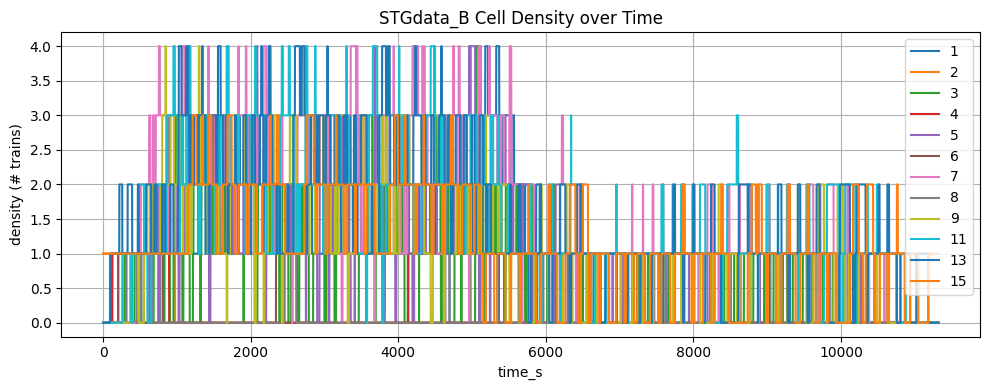

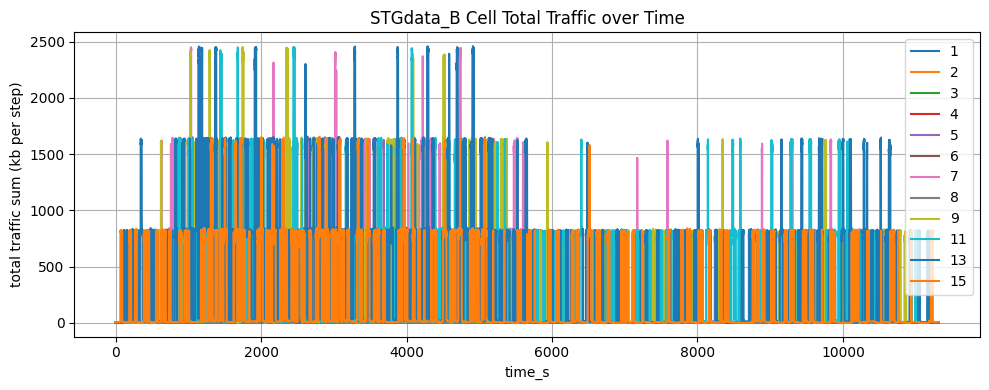

Saved plots: STGdata_B/data/STGdata_B_cell_density.png, STGdata_B/data/STGdata_B_cell_total_traffic.png
Plotted CIs for STGdata_B: [7, 11, 13, 1, 5, 9, 15, 3, 8, 6, 2, 4]


In [8]:
# build_gnn_spatiotemporal_dataset_injection_sim_dense_trackB.py
#
# Build STGdata_B from the enriched base train files.
#
# Inputs:
# - _base_train_runs/train*.csv with traffic features already added
# - cell_gnb_relation.csv for the CI-to-gNB mapping
#
# Outputs:
# - STGdata_B/data/STGdata_B.csv with the aggregated spatiotemporal dataset
# - STGdata_B/input_trains/train_XXXXX_<direction>[_trackA].csv with per-train timelines
#
# Processing outline:
# - load and align the train files to the mapped railway cells
# - infer the reference down-track ordering
# - apply dense injection with Track B capacity rules in the designated siding cells
# - build the long-format train timeline and aggregate it by time and cell
# - write both the aggregated dataset and per-train outputs

from pathlib import Path
import pandas as pd
import numpy as np
import re
from typing import Optional

# Base paths and dataset outputs.
BASE_DIR = Path("_base_train_runs")
TRAINS_GLOB = "train*.csv"

CELL_GNB_PATH = Path("cell_gnb_relation.csv")
OUT_PATH = Path("STGdata_B/data/STGdata_B.csv")

# Output folder for per-train files.
OUT_TRAINS_DIR = Path("STGdata_B/input_trains")

ROW_INTERVAL_S = 0.25

# Aggregate traffic columns expected from the event-based traffic cell.
CRIT_DL_COL = "critical_DL"
CRIT_UL_COL = "critical_UL"
PERF_DL_COL = "perform_DL"
PERF_UL_COL = "perform_UL"

# Track B is available only on these two cells inside gNB 8.
TRACK_B_CIS = {50750, 50740}

# Capacity limits are applied per direction.
CAP_SINGLE = 1
CAP_DOUBLE = 2
DOUBLE_CAP_GNBS = {8}            # gNB-level cap=2
DOUBLE_CAP_CIS = {50750, 50740}  # CI-level cap=2 (only these cells)

# Lookahead window used to test future conflicts during injection.
LOOKAHEAD_MAX_STEPS = 30


# Features preserved in the simulation outputs.
INTERESTING_FEATURES = [
    "CI",
    "D_LRBG",
    "HO_state",
    "Neighbor_Cell",
    "CQI_wb",
    "UL_SNR_wb",
    "CES",
    "EStop",
    "V_TRAIN",
    "NID_BG",
    "voice_DL_kb",
    "voice_UL_kb",
    "etcs_DL_kb",
    "etcs_UL_kb",
    "ato_DL_kb",
    "ato_UL_kb",
    "remote_engine_ctrl_DL_kb",
    "remote_engine_ctrl_UL_kb",
    "pub_warn_DL_kb",
    "pub_warn_UL_kb",
    "telemetry_nc_DL_kb",
    "telemetry_nc_UL_kb",
    "equip_ctl_DL_kb",
    "equip_ctl_UL_kb",
    "asset_tel_DL_kb",
    "asset_tel_UL_kb",
    "pis_DL_kb",
    "pis_UL_kb",
    "video_surv_DL_kb",
    "video_surv_UL_kb",
    CRIT_DL_COL,
    CRIT_UL_COL,
    PERF_DL_COL,
    PERF_UL_COL,
]

TRAFFIC_KB_COLS = [
    "voice_DL_kb","voice_UL_kb",
    "etcs_DL_kb","etcs_UL_kb",
    "ato_DL_kb","ato_UL_kb",
    "remote_engine_ctrl_DL_kb","remote_engine_ctrl_UL_kb",
    "pub_warn_DL_kb","pub_warn_UL_kb",
    "telemetry_nc_DL_kb","telemetry_nc_UL_kb",
    "equip_ctl_DL_kb","equip_ctl_UL_kb",
    "asset_tel_DL_kb","asset_tel_UL_kb",
    "pis_DL_kb","pis_UL_kb",
    "video_surv_DL_kb","video_surv_UL_kb",
    CRIT_DL_COL, CRIT_UL_COL, PERF_DL_COL, PERF_UL_COL,
]


# Capacity helpers.
def cap_for_gnb(gnb: int) -> int:
    return CAP_DOUBLE if int(gnb) in DOUBLE_CAP_GNBS else CAP_SINGLE

def cap_for_ci(ci: int) -> int:
    return CAP_DOUBLE if int(ci) in DOUBLE_CAP_CIS else CAP_SINGLE


# CSV header detection and parsing helpers.
def find_header_line(path, max_lines=200):
    probe_cols = [
        "msg_idx", "Timestamp", "User Distance", "Arrow Tooltip", "Arrow Title",
        "LAC", "CI", "HO", "V_TRAIN", "V_TRAIN (Km/h)", "NID_BG", "NID_C/NID_BG",
        "M_MODE", "DL Rxqual", "UL Rxqual",
        "D_LRBG", "HO_state", "CQI_wb", "UL_SNR_wb", "CES", "EStop",
        CRIT_DL_COL, CRIT_UL_COL, PERF_DL_COL, PERF_UL_COL
    ]
    norm_keep = [re.sub(r"\s+", "", c) for c in probe_cols]

    lines = []
    with open(path, "r", errors="ignore") as f:
        for _ in range(max_lines):
            try:
                lines.append(next(f))
            except StopIteration:
                break

    best_idx, best_score = 0, -1
    for i, line in enumerate(lines):
        line_norm = re.sub(r"\s+", "", line.strip())
        score = sum(1 for k in norm_keep if k in line_norm)
        score += max(line.count(","), line.count(";"), line.count("\t"), line.count("|")) // 5
        if score > best_score:
            best_idx, best_score = i, score
    return best_idx

def read_csv_generic(path: Path) -> pd.DataFrame:
    hdr = find_header_line(path)
    last_err = None
    for sep in (",", ";", "\t"):
        try:
            df = pd.read_csv(path, sep=sep, header=0, skiprows=hdr)
            df.columns = [str(c).strip() for c in df.columns]
            return df
        except Exception as e:
            last_err = e
    raise RuntimeError(f"CSV parse failed for {path.name}: {last_err}")

def discover_train_files(base_dir: Path):
    return sorted(list(base_dir.glob(TRAINS_GLOB)), key=lambda p: p.name.lower())


# Railway mapping and track-order helpers.
def load_ci_to_gnb(cell_gnb_path: Path) -> dict[int, int]:
    rel = pd.read_csv(cell_gnb_path)
    rel.columns = [str(c).strip() for c in rel.columns]
    if "CI" not in rel.columns or "gnb" not in rel.columns:
        raise ValueError("cell_gnb_relation.csv must contain at least columns: CI, gnb")
    rel["CI"] = pd.to_numeric(rel["CI"], errors="coerce")
    rel["gnb"] = pd.to_numeric(rel["gnb"], errors="coerce")
    rel = rel.dropna(subset=["CI", "gnb"]).copy()
    return {int(ci): int(gnb) for ci, gnb in zip(rel["CI"], rel["gnb"])}

def ordered_unique_ci_list(ci_series: pd.Series) -> list[int]:
    ci = pd.to_numeric(ci_series, errors="coerce").dropna().astype(int).tolist()
    seen = set()
    out = []
    for x in ci:
        if x not in seen:
            seen.add(x)
            out.append(x)
    return out

def infer_track_dn_from_trains(trains: list[dict]) -> list[int]:
    dn = [t for t in trains if t["direction"] == "dn" and len(t["uniq_ci"]) >= 2]
    if dn:
        dn_best = max(dn, key=lambda x: len(x["uniq_ci"]))
        return dn_best["uniq_ci"]

    up = [t for t in trains if t["direction"] == "up" and len(t["uniq_ci"]) >= 2]
    if up:
        up_best = max(up, key=lambda x: len(x["uniq_ci"]))
        return list(reversed(up_best["uniq_ci"]))

    return []


# Train loading and row-alignment helpers.
def parse_direction_from_name(path: Path) -> str | None:
    stem = path.stem.lower()
    if stem.endswith("_up"):
        return "up"
    if stem.endswith("_dn"):
        return "dn"
    return None

def get_start_timestamp(df: pd.DataFrame) -> Optional[pd.Timestamp]:
    if "Timestamp" not in df.columns:
        return None
    ts = pd.to_datetime(df["Timestamp"], errors="coerce", dayfirst=True)
    return ts.dropna().iloc[0].to_pydatetime() if ts.notna().any() else None

def _ensure_cols(df: pd.DataFrame, cols: list[str]) -> pd.DataFrame:
    for c in cols:
        if c not in df.columns:
            df[c] = np.nan
    return df

def prep_train_arrays(df: pd.DataFrame, ci_to_gnb: dict[int, int]) -> dict:
    """
    New style:
      - filter/sort rows and keep feat_df (INTERESTING_FEATURES) aligned by pos
      - keep ci/gnb arrays for simulation + uniq_ci for track inference
    """
    out = df.copy()
    out.columns = [str(c).strip() for c in out.columns]

    # stable sort by Timestamp if exists
    if "Timestamp" in out.columns:
        ts = pd.to_datetime(out["Timestamp"], errors="coerce", dayfirst=True)
        if ts.notna().any():
            out = (
                out.assign(_ts_sort=ts)
                   .sort_values("_ts_sort", kind="stable")
                   .drop(columns=["_ts_sort"])
                   .reset_index(drop=True)
            )

    out = _ensure_cols(out, ["CI"])

    # filter to mapped CI
    ci_num = pd.to_numeric(out["CI"], errors="coerce").dropna().astype(int)
    kept_idx = ci_num[ci_num.isin(list(ci_to_gnb.keys()))].index
    if len(kept_idx) == 0:
        return {"ok": False}

    out = out.loc[kept_idx].reset_index(drop=True)

    # ensure interesting columns exist
    out = _ensure_cols(out, INTERESTING_FEATURES)

    # coercions
    out["CI"] = pd.to_numeric(out["CI"], errors="coerce")
    out["CQI_wb"] = pd.to_numeric(out["CQI_wb"], errors="coerce")
    out["UL_SNR_wb"] = pd.to_numeric(out["UL_SNR_wb"], errors="coerce")

    out["CES"] = pd.to_numeric(out["CES"], errors="coerce").fillna(0).astype(int)
    out["EStop"] = pd.to_numeric(out["EStop"], errors="coerce").fillna(0).astype(int)
    out["V_TRAIN"] = pd.to_numeric(out["V_TRAIN"], errors="coerce")

    for c in TRAFFIC_KB_COLS:
        if c in out.columns:
            out[c] = pd.to_numeric(out[c], errors="coerce").fillna(0.0)

    # arrays
    ci_arr = pd.to_numeric(out["CI"], errors="coerce").astype("Int64").astype(float).astype(int).to_numpy()
    gnb_arr = np.array([ci_to_gnb.get(int(x), -1) for x in ci_arr], dtype=int)
    uniq_ci = ordered_unique_ci_list(out["CI"])

    feat_df = out[INTERESTING_FEATURES].copy()

    return {
        "ok": True,
        "ci": ci_arr,
        "gnb": gnb_arr,
        "uniq_ci": uniq_ci,
        "n_steps": len(ci_arr),
        "feat_df": feat_df,
    }


def classify_track_type(train_dict: dict) -> str:
    """
    Track A: normal train (full line)
    Track B: siding-only train, must remain within TRACK_B_CIS
    We mark B if the train starts on a B cell.
    """
    first_ci = int(train_dict["ci"][0])
    return "B" if first_ci in TRACK_B_CIS else "A"


# Capacity-aware lookahead checks.
def would_exceed_capacity_in_future(candidate: dict, active_same_dir: list[dict]) -> bool:
    max_overlap = candidate["n_steps"]
    if LOOKAHEAD_MAX_STEPS is not None:
        max_overlap = min(max_overlap, int(LOOKAHEAD_MAX_STEPS))
    if max_overlap <= 0:
        return False

    counts_ci = [dict() for _ in range(max_overlap)]
    counts_g  = [dict() for _ in range(max_overlap)]

    for a in active_same_dir:
        pos = a["pos"]
        rem = a["n_steps"] - pos
        overlap = min(rem, max_overlap)
        if overlap <= 0:
            continue
        for k in range(overlap):
            ci = int(a["ci"][pos + k])
            g  = int(a["gnb"][pos + k])
            counts_ci[k][ci] = counts_ci[k].get(ci, 0) + 1
            counts_g[k][g]   = counts_g[k].get(g, 0) + 1

    for k in range(min(candidate["n_steps"], max_overlap)):
        ci = int(candidate["ci"][k])
        g  = int(candidate["gnb"][k])

        if counts_ci[k].get(ci, 0) + 1 > cap_for_ci(ci):
            return True
        if counts_g[k].get(g, 0) + 1 > cap_for_gnb(g):
            return True

    return False


def can_place_midtrack_at_t0(candidate: dict, active: list[dict], dir_: str) -> bool:
    occ_ci = {}
    occ_g  = {}
    for a in active:
        if a["direction"] != dir_:
            continue
        ci = int(a["ci"][a["pos"]])
        g  = int(a["gnb"][a["pos"]])
        occ_ci[ci] = occ_ci.get(ci, 0) + 1
        occ_g[g]   = occ_g.get(g, 0) + 1

    ci0 = int(candidate["ci"][0])
    g0  = int(candidate["gnb"][0])

    if occ_ci.get(ci0, 0) + 1 > cap_for_ci(ci0):
        return False
    if occ_g.get(g0, 0) + 1 > cap_for_gnb(g0):
        return False

    active_same_dir = [a for a in active if a["direction"] == dir_]
    if would_exceed_capacity_in_future(candidate, active_same_dir):
        return False

    return True


def can_inject_train_now_at_ci(candidate: dict, active: list[dict], dir_: str, inject_ci: int, inject_gnb: int) -> bool:
    if int(candidate["ci"][0]) != int(inject_ci):
        return False

    occ_ci = {}
    occ_g  = {}
    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        if pos < a["n_steps"]:
            ci = int(a["ci"][pos])
            g  = int(a["gnb"][pos])
            occ_ci[ci] = occ_ci.get(ci, 0) + 1
            occ_g[g]   = occ_g.get(g, 0) + 1

    if occ_ci.get(inject_ci, 0) + 1 > cap_for_ci(inject_ci):
        return False
    if occ_g.get(inject_gnb, 0) + 1 > cap_for_gnb(inject_gnb):
        return False

    active_same_dir = [a for a in active if a["direction"] == dir_]
    if would_exceed_capacity_in_future(candidate, active_same_dir):
        return False

    return True


# Simulation and output helpers.
def agg_train_ids(s):
    return sorted(pd.unique(s.dropna().astype(int)))

def build_full_grid(agg: pd.DataFrame, ci_list: list[int], max_step: int) -> pd.DataFrame:
    time_vals = np.arange(max_step + 1, dtype=int) * ROW_INTERVAL_S
    full_index = pd.MultiIndex.from_product([time_vals, ci_list], names=["time_s", "CI"])
    return agg.set_index(["time_s", "CI"]).reindex(full_index).reset_index()

def write_per_train_timelines(long_df: pd.DataFrame, out_dir: Path):
    out_dir.mkdir(parents=True, exist_ok=True)
    long_df = long_df.sort_values(["train_id", "step"], kind="stable").reset_index(drop=True)

    cols = ["train_id", "direction", "track", "step", "time_s", "pos", "CI", "gnb"] + [c for c in INTERESTING_FEATURES if c != "CI"]
    cols = [c for c in cols if c in long_df.columns]

    for train_id, g in long_df.groupby("train_id", sort=True):
        direction = str(g["direction"].iloc[0]) if "direction" in g.columns and len(g) else "na"
        track = str(g["track"].iloc[0]) if "track" in g.columns and len(g) else "na"
        fname = f"train_{int(train_id):05d}_{direction}_track{track}.csv"
        g.loc[:, cols].to_csv(out_dir / fname, index=False)


def simulate_and_build_long(trains: list[dict], track_dn: list[int], ci_to_gnb: dict[int, int]) -> pd.DataFrame:
    track_up = list(reversed(track_dn))
    entry_dn = int(track_dn[0])
    entry_up = int(track_up[0])

    entry_dn_gnb = int(ci_to_gnb.get(entry_dn, -1))
    entry_up_gnb = int(ci_to_gnb.get(entry_up, -1))

    # Track B injection points are the two siding cells
    track_b_points = sorted(list(TRACK_B_CIS))
    if len(track_b_points) < 1:
        raise ValueError("TRACK_B_CIS is empty.")
    track_b_gnb = int(ci_to_gnb.get(track_b_points[0], -1))

    # Pools
    midtrack_pool = {"dn": [], "up": []}      # Track A midtrack at t=0
    waiting_entry = {"dn": [], "up": []}      # Track A entry injection (dense each step)
    waiting_b     = {"dn": [], "up": []}      # Track B injection at 50750/50740 (dense each step)

    for t in trains:
        d = t["direction"]
        if d not in ("dn", "up"):
            continue

        first_ci = int(t["ci"][0])
        t_track = t["track_type"]

        if t_track == "B":
            if first_ci in TRACK_B_CIS:
                waiting_b[d].append(t)
            # Track B trains are not eligible for midtrack pool or entry injection
            continue

        entry_ci = entry_dn if d == "dn" else entry_up
        if first_ci == entry_ci:
            waiting_entry[d].append(t)
        else:
            midtrack_pool[d].append(t)

    def _sort_key(t):
        return (pd.isna(t["start_ts"]), t["start_ts"], t["name"].lower())

    for d in ("dn", "up"):
        midtrack_pool[d].sort(key=_sort_key)
        waiting_entry[d].sort(key=_sort_key)
        waiting_b[d].sort(key=_sort_key)

    active = []

    # ---- t=0 midtrack placement (Track A only) ----
    for d in ("dn", "up"):
        for cand in midtrack_pool[d]:
            if can_place_midtrack_at_t0(cand, active, d):
                active.append({**cand, "pos": 0})

    # Inject queued trains at the selected insertion point.
    def inject_from_queue_at_ci(dir_: str, q: list[dict], inject_ci: int, inject_g: int):
        nonlocal active
        while True:
            injected_one = False
            for i, cand in enumerate(q):
                if can_inject_train_now_at_ci(cand, active, dir_, inject_ci, inject_g):
                    active.append({**cand, "pos": 0})
                    del q[i]
                    injected_one = True
                    break
            if not injected_one:
                break

    long_rows = []
    step = 0

    while True:
        if (
            not active
            and not waiting_entry["dn"] and not waiting_entry["up"]
            and not waiting_b["dn"] and not waiting_b["up"]
        ):
            break

        # (A) Dense injection at start of step
        inject_from_queue_at_ci("dn", waiting_entry["dn"], entry_dn, entry_dn_gnb)
        inject_from_queue_at_ci("up", waiting_entry["up"], entry_up, entry_up_gnb)

        for d in ("dn", "up"):
            for inject_ci in track_b_points:
                inject_from_queue_at_ci(d, waiting_b[d], inject_ci, track_b_gnb)

        # (B) Record observations using feat_df at pos
        time_s = step * ROW_INTERVAL_S
        for a in active:
            pos = a["pos"]
            if pos >= a["n_steps"]:
                continue

            ci_now = int(a["ci"][pos])
            g_now = int(a["gnb"][pos])

            feat_row = a["feat_df"].iloc[pos].to_dict()

            row = {
                "time_s": time_s,
                "step": step,
                "train_id": a["train_id"],
                "direction": a["direction"],
                "track": a["track_type"],
                "pos": pos,
                "CI": ci_now,
                "gnb": g_now,
            }
            row.update(feat_row)

            # enforce CI/gnb consistency
            row["CI"] = ci_now
            row["gnb"] = g_now

            long_rows.append(row)

        # (C) Advance trains
        for a in active:
            a["pos"] += 1

            # Track B rule: if it ever tries to leave {50750,50740}, stop it
            if a["track_type"] == "B" and a["pos"] < a["n_steps"]:
                next_ci = int(a["ci"][a["pos"]])
                if next_ci not in TRACK_B_CIS:
                    a["pos"] = a["n_steps"]

        # (D) Remove finished
        active = [a for a in active if a["pos"] < a["n_steps"]]

        step += 1
        if step > 500000:
            raise RuntimeError("Safety stop: too many steps. Check constraints/data.")

    if not long_rows:
        base_cols = ["time_s","step","train_id","direction","track","pos","CI","gnb"] + INTERESTING_FEATURES
        base_cols = list(dict.fromkeys(base_cols))
        return pd.DataFrame(columns=base_cols)

    return pd.DataFrame(long_rows)


# Dataset plot helper.
def plot_stg_dataset_from_df(df: pd.DataFrame, dataset_name: str, out_path: Path, top_n: int = 12):
    import matplotlib.pyplot as plt

    needed = {"time_s", "CI", "density", "total_traffic_sum"}
    missing = needed - set(df.columns)
    if missing:
        print(f"[plot skip] {dataset_name}: missing columns {missing}")
        return

    plot_df = df.copy()
    plot_df["time_s"] = pd.to_numeric(plot_df["time_s"], errors="coerce")
    plot_df["CI"] = pd.to_numeric(plot_df["CI"], errors="coerce")
    plot_df["density"] = pd.to_numeric(plot_df["density"], errors="coerce").fillna(0)
    plot_df["total_traffic_sum"] = pd.to_numeric(plot_df["total_traffic_sum"], errors="coerce").fillna(0)
    plot_df = plot_df.dropna(subset=["time_s", "CI"]).copy()
    plot_df["CI"] = plot_df["CI"].astype(int)

    if top_n is not None:
        top_cis = (
            plot_df.groupby("CI")["density"]
                   .mean()
                   .sort_values(ascending=False)
                   .head(top_n)
                   .index
                   .tolist()
        )
        plot_df = plot_df[plot_df["CI"].isin(top_cis)].copy()
    else:
        top_cis = sorted(plot_df["CI"].unique().tolist())

    fig, ax = plt.subplots(figsize=(10, 4))
    for ci, g in plot_df.groupby("CI"):
        g = g.sort_values("time_s")
        ax.plot(g["time_s"], g["density"], label=str(ci))
    ax.set_xlabel("time_s")
    ax.set_ylabel("density (# trains)")
    ax.set_title(f"{dataset_name} Cell Density over Time")
    ax.grid(True)
    ax.legend()
    fig.tight_layout()
    density_png = out_path.parent / f"{dataset_name}_cell_density.png"
    fig.savefig(density_png, dpi=200)
    plt.show()

    fig, ax = plt.subplots(figsize=(10, 4))
    for ci, g in plot_df.groupby("CI"):
        g = g.sort_values("time_s")
        ax.plot(g["time_s"], g["total_traffic_sum"], label=str(ci))
    ax.set_xlabel("time_s")
    ax.set_ylabel("total traffic sum (kb per step)")
    ax.set_title(f"{dataset_name} Cell Total Traffic over Time")
    ax.grid(True)
    ax.legend()
    fig.tight_layout()
    traffic_png = out_path.parent / f"{dataset_name}_cell_total_traffic.png"
    fig.savefig(traffic_png, dpi=200)
    plt.show()

    print(f"Saved plots: {density_png}, {traffic_png}")
    print(f"Plotted CIs for {dataset_name}: {top_cis}")

# Main dataset build routine.
def main():
    ci_to_gnb = load_ci_to_gnb(CELL_GNB_PATH)
    ci_list = sorted(ci_to_gnb.keys())

    files = discover_train_files(BASE_DIR)
    if not files:
        print(f"No {TRAINS_GLOB} found under {BASE_DIR.resolve()}")
        return

    trains = []
    for p in files:
        direction = parse_direction_from_name(p)
        if direction is None:
            continue

        df = read_csv_generic(p)
        arr = prep_train_arrays(df, ci_to_gnb)
        if not arr.get("ok", False):
            continue

        t = {
            "name": p.name,
            "path": p,
            "direction": direction,
            "start_ts": get_start_timestamp(df),
            **arr
        }
        t["track_type"] = classify_track_type(t)
        trains.append(t)

    if not trains:
        print("No usable trains after loading.")
        return

    # stable train_id assignment
    trains_sorted = sorted(trains, key=lambda t: (pd.isna(t["start_ts"]), t["start_ts"], t["name"].lower()))
    for i, t in enumerate(trains_sorted, start=1):
        t["train_id"] = i

    # infer mainline track order (dn)
    track_dn = infer_track_dn_from_trains(trains_sorted)
    if not track_dn:
        raise ValueError("Could not infer track order from available trains.")

    # simulate
    long_df = simulate_and_build_long(trains_sorted, track_dn=track_dn, ci_to_gnb=ci_to_gnb)
    if long_df.empty:
        print("Simulation produced no rows.")
        return

    # Write per-train global timeline files.
    write_per_train_timelines(long_df, OUT_TRAINS_DIR)

    # aggregate by (time_s, CI)
    grouped = long_df.groupby(["time_s", "CI"], sort=False)
    agg = grouped.agg(
        density=("train_id", "nunique"),
        train_ids=("train_id", agg_train_ids),
        CES_count=("CES", "sum"),
        EStop_count=("EStop", "sum"),
        avg_speed_kmh=("V_TRAIN", "mean"),
        critical_DL_sum=(CRIT_DL_COL, "sum"),
        critical_UL_sum=(CRIT_UL_COL, "sum"),
        perform_DL_sum=(PERF_DL_COL, "sum"),
        perform_UL_sum=(PERF_UL_COL, "sum"),
    ).reset_index()

    agg["total_traffic_sum"] = (
        agg["critical_DL_sum"].fillna(0)
        + agg["critical_UL_sum"].fillna(0)
        + agg["perform_DL_sum"].fillna(0)
        + agg["perform_UL_sum"].fillna(0)
    )

    # full grid
    max_step = int(long_df["step"].max())
    agg_full = build_full_grid(agg, ci_list=ci_list, max_step=max_step)

    # fill defaults
    agg_full["density"] = agg_full["density"].fillna(0).astype(int)
    agg_full["train_ids"] = agg_full["train_ids"].apply(lambda x: x if isinstance(x, list) else [])
    for c in ["CES_count", "EStop_count"]:
        agg_full[c] = agg_full[c].fillna(0).astype(int)
    for c in ["critical_DL_sum", "critical_UL_sum", "perform_DL_sum", "perform_UL_sum", "total_traffic_sum"]:
        agg_full[c] = agg_full[c].fillna(0.0)

    # attach gnb
    agg_full["gnb"] = agg_full["CI"].map(lambda x: ci_to_gnb.get(int(x), np.nan))

    # order + sort
    agg_full = agg_full[[
        "time_s", "CI", "gnb",
        "density", "train_ids",
        "CES_count", "EStop_count",
        "avg_speed_kmh",
        "critical_DL_sum", "critical_UL_sum",
        "perform_DL_sum", "perform_UL_sum",
        "total_traffic_sum"
    ]].sort_values(["time_s", "gnb", "CI"], kind="stable").reset_index(drop=True)

    OUT_PATH.parent.mkdir(parents=True, exist_ok=True)
    agg_full.to_csv(OUT_PATH, index=False)

    print(f"Saved dataset: {OUT_PATH}")
    print(f"Wrote per-train inputs to: {OUT_TRAINS_DIR.resolve()}")
    print(f"TrackB cells: {sorted(TRACK_B_CIS)} | gNB cap2: {sorted(DOUBLE_CAP_GNBS)} | CI cap2: {sorted(DOUBLE_CAP_CIS)}")
    print(f"Simulated steps: {max_step + 1} | time range: 0 .. {max_step * ROW_INTERVAL_S:.2f} s")
    print(f"Loaded trains: {len(trains_sorted)} | Produced long rows: {len(long_df)}")
    print("Note: Track B trains terminate if they ever try to leave {50750,50740}.")
    plot_stg_dataset_from_df(agg_full, "STGdata_B", OUT_PATH)


if __name__ == "__main__":
    main()


## 3C. Create STGdata_C

Saved dataset: STGdata_C/data/STGdata_C.csv
Wrote per-train inputs to: /home/me/contrib3/FRMCS_traffic_STGDdataset/STGdata_C/input_trains
DOUBLE_TRACK_GNBS=[8] | cap(single)=1 cap(double)=2
Track dn length=8 | entry_dn=1 | entry_up=15
Simulated steps=45275 | time range: 0 .. 11318.50 s
Loaded trains=183 | Produced long rows=477729


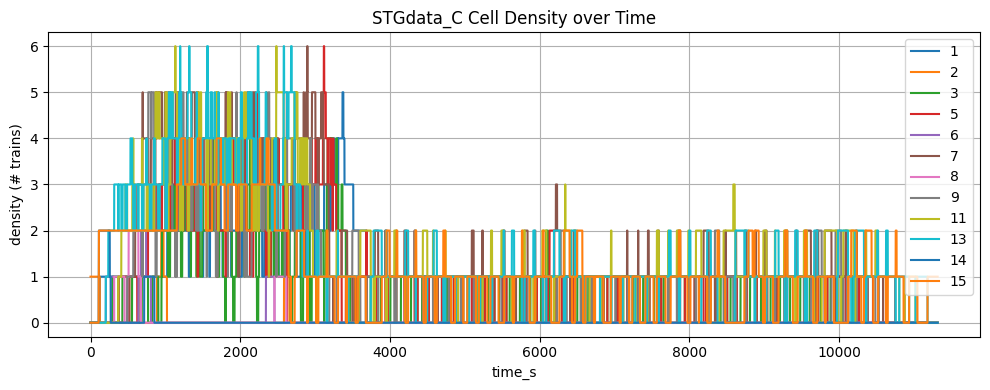

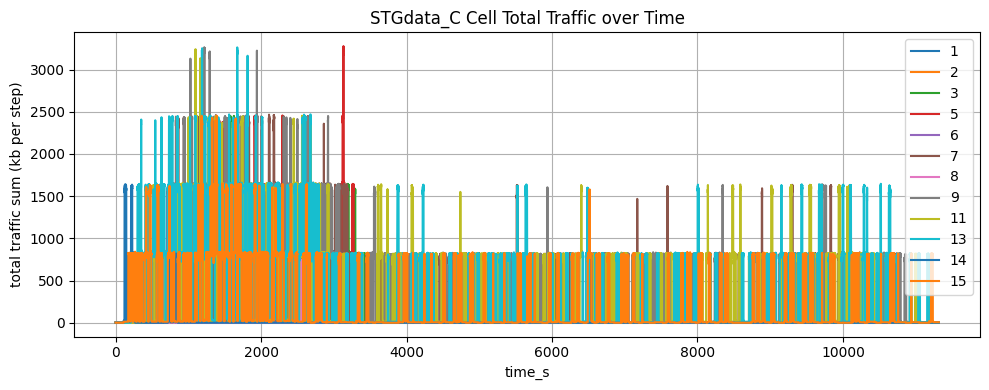

Saved plots: STGdata_C/data/STGdata_C_cell_density.png, STGdata_C/data/STGdata_C_cell_total_traffic.png
Plotted CIs for STGdata_C: [7, 11, 13, 1, 5, 9, 15, 3, 8, 6, 14, 2]


In [9]:
# build_gnn_spatiotemporal_dataset_injection_sim_dense.py
#
# Build STGdata_C from the enriched base train files.
#
# Inputs:
# - _base_train_runs/train*.csv with traffic features already added
# - cell_gnb_relation.csv for the CI-to-gNB mapping
#
# Outputs:
# - STGdata_C/data/STGdata_C.csv with the aggregated spatiotemporal dataset
# - STGdata_C/input_trains/train_XXXXX_<direction>[_trackA].csv with per-train timelines
#
# Processing outline:
# - load and align the train files to the mapped railway cells
# - infer the reference down-track ordering
# - apply dense injection with double-track capacity inside gNB 8
# - build the long-format train timeline and aggregate it by time and cell
# - write both the aggregated dataset and per-train outputs

from pathlib import Path
import pandas as pd
import numpy as np
import re
from typing import Optional

# Base paths and dataset outputs.
BASE_DIR = Path("_base_train_runs")
TRAINS_GLOB = "train*.csv"

CELL_GNB_PATH = Path("cell_gnb_relation.csv")
OUT_PATH = Path("STGdata_C/data/STGdata_C.csv")

# Output folder for per-train files.
OUT_TRAINS_DIR = Path("STGdata_C/input_trains")

ROW_INTERVAL_S = 0.25

# Aggregate traffic columns expected from the event-based traffic cell.
CRIT_DL_COL = "critical_DL"
CRIT_UL_COL = "critical_UL"
PERF_DL_COL = "perform_DL"
PERF_UL_COL = "perform_UL"

# Double-track capacity is available only in the listed gNBs.
DOUBLE_TRACK_GNBS = {8}
CAP_SINGLE = 1
CAP_DOUBLE = 2

# Lookahead window used to test future conflicts during injection.
LOOKAHEAD_MAX_STEPS = 30


# Features preserved in the simulation outputs.
INTERESTING_FEATURES = [
    "CI",
    "D_LRBG",
    "HO_state",
    "Neighbor_Cell",
    "CQI_wb",
    "UL_SNR_wb",
    "CES",
    "EStop",
    "V_TRAIN",
    "NID_BG",
    "voice_DL_kb",
    "voice_UL_kb",
    "etcs_DL_kb",
    "etcs_UL_kb",
    "ato_DL_kb",
    "ato_UL_kb",
    "remote_engine_ctrl_DL_kb",
    "remote_engine_ctrl_UL_kb",
    "pub_warn_DL_kb",
    "pub_warn_UL_kb",
    "telemetry_nc_DL_kb",
    "telemetry_nc_UL_kb",
    "equip_ctl_DL_kb",
    "equip_ctl_UL_kb",
    "asset_tel_DL_kb",
    "asset_tel_UL_kb",
    "pis_DL_kb",
    "pis_UL_kb",
    "video_surv_DL_kb",
    "video_surv_UL_kb",
    CRIT_DL_COL,
    CRIT_UL_COL,
    PERF_DL_COL,
    PERF_UL_COL,
]

TRAFFIC_KB_COLS = [
    "voice_DL_kb","voice_UL_kb",
    "etcs_DL_kb","etcs_UL_kb",
    "ato_DL_kb","ato_UL_kb",
    "remote_engine_ctrl_DL_kb","remote_engine_ctrl_UL_kb",
    "pub_warn_DL_kb","pub_warn_UL_kb",
    "telemetry_nc_DL_kb","telemetry_nc_UL_kb",
    "equip_ctl_DL_kb","equip_ctl_UL_kb",
    "asset_tel_DL_kb","asset_tel_UL_kb",
    "pis_DL_kb","pis_UL_kb",
    "video_surv_DL_kb","video_surv_UL_kb",
    CRIT_DL_COL, CRIT_UL_COL, PERF_DL_COL, PERF_UL_COL,
]


# Capacity helpers.
def cap_for_gnb(gnb: int) -> int:
    return CAP_DOUBLE if int(gnb) in DOUBLE_TRACK_GNBS else CAP_SINGLE

def cap_for_ci(ci: int, ci_to_gnb: dict[int, int]) -> int:
    g = ci_to_gnb.get(int(ci), -1)
    return cap_for_gnb(g)


# CSV header detection and parsing helpers.
def find_header_line(path, max_lines=200):
    probe_cols = [
        "msg_idx", "Timestamp", "User Distance", "Arrow Tooltip", "Arrow Title",
        "LAC", "CI", "HO", "V_TRAIN", "V_TRAIN (Km/h)", "NID_BG", "NID_C/NID_BG",
        "M_MODE", "DL Rxqual", "UL Rxqual",
        "D_LRBG", "HO_state", "CQI_wb", "UL_SNR_wb", "CES", "EStop",
        CRIT_DL_COL, CRIT_UL_COL, PERF_DL_COL, PERF_UL_COL
    ]
    norm_keep = [re.sub(r"\s+", "", c) for c in probe_cols]

    lines = []
    with open(path, "r", errors="ignore") as f:
        for _ in range(max_lines):
            try:
                lines.append(next(f))
            except StopIteration:
                break

    best_idx, best_score = 0, -1
    for i, line in enumerate(lines):
        line_norm = re.sub(r"\s+", "", line.strip())
        score = sum(1 for k in norm_keep if k in line_norm)
        score += max(line.count(","), line.count(";"), line.count("\t"), line.count("|")) // 5
        if score > best_score:
            best_idx, best_score = i, score
    return best_idx

def read_csv_generic(path: Path) -> pd.DataFrame:
    hdr = find_header_line(path)
    last_err = None
    for sep in (",", ";", "\t"):
        try:
            df = pd.read_csv(path, sep=sep, header=0, skiprows=hdr)
            df.columns = [str(c).strip() for c in df.columns]
            return df
        except Exception as e:
            last_err = e
    raise RuntimeError(f"CSV parse failed for {path.name}: {last_err}")

def discover_train_files(base_dir: Path):
    return sorted(list(base_dir.glob(TRAINS_GLOB)), key=lambda p: p.name.lower())


# Railway mapping and track-order helpers.
def load_ci_to_gnb(cell_gnb_path: Path) -> dict[int, int]:
    rel = pd.read_csv(cell_gnb_path)
    rel.columns = [str(c).strip() for c in rel.columns]
    if "CI" not in rel.columns or "gnb" not in rel.columns:
        raise ValueError("cell_gnb_relation.csv must contain at least columns: CI, gnb")
    rel["CI"] = pd.to_numeric(rel["CI"], errors="coerce")
    rel["gnb"] = pd.to_numeric(rel["gnb"], errors="coerce")
    rel = rel.dropna(subset=["CI", "gnb"]).copy()
    return {int(ci): int(gnb) for ci, gnb in zip(rel["CI"], rel["gnb"])}

def ordered_unique_ci_list(ci_series: pd.Series) -> list[int]:
    ci = pd.to_numeric(ci_series, errors="coerce").dropna().astype(int).tolist()
    seen = set()
    out = []
    for x in ci:
        if x not in seen:
            seen.add(x)
            out.append(x)
    return out

def infer_track_dn_from_trains(trains: list[dict]) -> list[int]:
    """
    Pick the dn train with the longest ordered-unique CI path and use it as the track order.
    Fallback: use up best and reverse.
    """
    dn = [t for t in trains if t["direction"] == "dn" and len(t["uniq_ci"]) >= 2]
    if dn:
        dn_best = max(dn, key=lambda x: len(x["uniq_ci"]))
        return dn_best["uniq_ci"]

    up = [t for t in trains if t["direction"] == "up" and len(t["uniq_ci"]) >= 2]
    if up:
        up_best = max(up, key=lambda x: len(x["uniq_ci"]))
        return list(reversed(up_best["uniq_ci"]))

    return []


# Train loading and row-alignment helpers.
def parse_direction_from_name(path: Path) -> str | None:
    stem = path.stem.lower()
    if stem.endswith("_up"):
        return "up"
    if stem.endswith("_dn"):
        return "dn"
    return None

def get_start_timestamp(df: pd.DataFrame) -> Optional[pd.Timestamp]:
    if "Timestamp" not in df.columns:
        return None
    ts = pd.to_datetime(df["Timestamp"], errors="coerce", dayfirst=True)
    return ts.dropna().iloc[0].to_pydatetime() if ts.notna().any() else None

def _ensure_cols(df: pd.DataFrame, cols: list[str]) -> pd.DataFrame:
    for c in cols:
        if c not in df.columns:
            df[c] = np.nan
    return df

def prep_train_arrays(df: pd.DataFrame, ci_to_gnb: dict[int, int]) -> dict:
    """
    New style:
      - filter/sort rows and keep feat_df (INTERESTING_FEATURES) aligned by pos
      - keep ci/gnb arrays for simulation + uniq_ci for track inference
    """
    out = df.copy()
    out.columns = [str(c).strip() for c in out.columns]

    if "Timestamp" in out.columns:
        ts = pd.to_datetime(out["Timestamp"], errors="coerce", dayfirst=True)
        if ts.notna().any():
            out = (
                out.assign(_ts_sort=ts)
                   .sort_values("_ts_sort", kind="stable")
                   .drop(columns=["_ts_sort"])
                   .reset_index(drop=True)
            )

    out = _ensure_cols(out, ["CI"])

    # filter to mapped CI
    ci_num = pd.to_numeric(out["CI"], errors="coerce").dropna().astype(int)
    kept_idx = ci_num[ci_num.isin(list(ci_to_gnb.keys()))].index
    if len(kept_idx) == 0:
        return {"ok": False}

    out = out.loc[kept_idx].reset_index(drop=True)

    out = _ensure_cols(out, INTERESTING_FEATURES)

    # coercions
    out["CI"] = pd.to_numeric(out["CI"], errors="coerce")
    out["CQI_wb"] = pd.to_numeric(out["CQI_wb"], errors="coerce")
    out["UL_SNR_wb"] = pd.to_numeric(out["UL_SNR_wb"], errors="coerce")

    out["CES"] = pd.to_numeric(out["CES"], errors="coerce").fillna(0).astype(int)
    out["EStop"] = pd.to_numeric(out["EStop"], errors="coerce").fillna(0).astype(int)
    out["V_TRAIN"] = pd.to_numeric(out["V_TRAIN"], errors="coerce")

    for c in TRAFFIC_KB_COLS:
        if c in out.columns:
            out[c] = pd.to_numeric(out[c], errors="coerce").fillna(0.0)

    ci_arr = pd.to_numeric(out["CI"], errors="coerce").astype("Int64").astype(float).astype(int).to_numpy()
    gnb_arr = np.array([ci_to_gnb.get(int(x), -1) for x in ci_arr], dtype=int)
    uniq_ci = ordered_unique_ci_list(out["CI"])

    feat_df = out[INTERESTING_FEATURES].copy()

    return {
        "ok": True,
        "ci": ci_arr,
        "gnb": gnb_arr,
        "uniq_ci": uniq_ci,
        "n_steps": len(ci_arr),
        "feat_df": feat_df,
    }


# Capacity-aware lookahead checks.
def would_exceed_capacity_in_future(candidate: dict, active_same_dir: list[dict], ci_to_gnb: dict[int, int]) -> bool:
    """
    True if adding candidate would exceed capacity (CI or gNB) at any overlap step.
    Capacity is 2 in DOUBLE_TRACK_GNBS (per direction), else 1.
    """
    max_overlap = candidate["n_steps"]
    if LOOKAHEAD_MAX_STEPS is not None:
        max_overlap = min(max_overlap, int(LOOKAHEAD_MAX_STEPS))
    if max_overlap <= 0:
        return False

    counts_ci = [dict() for _ in range(max_overlap)]
    counts_g  = [dict() for _ in range(max_overlap)]

    for a in active_same_dir:
        pos = a["pos"]
        rem = a["n_steps"] - pos
        overlap = min(rem, max_overlap)
        if overlap <= 0:
            continue
        for k in range(overlap):
            ci = int(a["ci"][pos + k])
            g  = int(a["gnb"][pos + k])
            counts_ci[k][ci] = counts_ci[k].get(ci, 0) + 1
            counts_g[k][g]   = counts_g[k].get(g, 0) + 1

    for k in range(min(candidate["n_steps"], max_overlap)):
        ci = int(candidate["ci"][k])
        g  = int(candidate["gnb"][k])

        if counts_ci[k].get(ci, 0) + 1 > cap_for_ci(ci, ci_to_gnb):
            return True
        if counts_g[k].get(g, 0) + 1 > cap_for_gnb(g):
            return True

    return False


def can_place_midtrack_at_t0(candidate: dict, active: list[dict], dir_: str, ci_to_gnb: dict[int, int]) -> bool:
    """
    Place at t=0 in the middle (candidate can start at any CI).
    Must satisfy capacity NOW and future lookahead (same direction).
    """
    occ_ci = {}
    occ_g  = {}
    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        ci = int(a["ci"][pos])
        g  = int(a["gnb"][pos])
        occ_ci[ci] = occ_ci.get(ci, 0) + 1
        occ_g[g]   = occ_g.get(g, 0) + 1

    ci0 = int(candidate["ci"][0])
    g0  = int(candidate["gnb"][0])

    if occ_ci.get(ci0, 0) + 1 > cap_for_ci(ci0, ci_to_gnb):
        return False
    if occ_g.get(g0, 0) + 1 > cap_for_gnb(g0):
        return False

    active_same_dir = [a for a in active if a["direction"] == dir_]
    if would_exceed_capacity_in_future(candidate, active_same_dir, ci_to_gnb):
        return False

    return True


def can_inject_train_now(candidate: dict, active: list[dict], dir_: str, entry_ci: int, entry_gnb: int, ci_to_gnb: dict[int, int]) -> bool:
    """
    Injection at entry only (candidate must start with entry_ci).
    Must satisfy capacity NOW and future lookahead (same direction).
    """
    if int(candidate["ci"][0]) != int(entry_ci):
        return False

    occ_ci = {}
    occ_g  = {}
    for a in active:
        if a["direction"] != dir_:
            continue
        pos = a["pos"]
        if pos < a["n_steps"]:
            ci = int(a["ci"][pos])
            g  = int(a["gnb"][pos])
            occ_ci[ci] = occ_ci.get(ci, 0) + 1
            occ_g[g]   = occ_g.get(g, 0) + 1

    if occ_ci.get(entry_ci, 0) + 1 > cap_for_ci(entry_ci, ci_to_gnb):
        return False
    if occ_g.get(entry_gnb, 0) + 1 > cap_for_gnb(entry_gnb):
        return False

    active_same_dir = [a for a in active if a["direction"] == dir_]
    if would_exceed_capacity_in_future(candidate, active_same_dir, ci_to_gnb):
        return False

    return True


# Output helpers.
def agg_train_ids(s):
    return sorted(pd.unique(s.dropna().astype(int)))

def build_full_grid(agg: pd.DataFrame, ci_list: list[int], max_step: int) -> pd.DataFrame:
    time_vals = np.arange(max_step + 1, dtype=int) * ROW_INTERVAL_S
    full_index = pd.MultiIndex.from_product([time_vals, ci_list], names=["time_s", "CI"])
    return agg.set_index(["time_s", "CI"]).reindex(full_index).reset_index()

def write_per_train_timelines(long_df: pd.DataFrame, out_dir: Path):
    out_dir.mkdir(parents=True, exist_ok=True)
    long_df = long_df.sort_values(["train_id", "step"], kind="stable").reset_index(drop=True)

    cols = ["train_id", "direction", "step", "time_s", "pos", "CI", "gnb"] + [c for c in INTERESTING_FEATURES if c != "CI"]
    cols = [c for c in cols if c in long_df.columns]

    for train_id, g in long_df.groupby("train_id", sort=True):
        direction = str(g["direction"].iloc[0]) if "direction" in g.columns and len(g) else "na"
        fname = f"train_{int(train_id):05d}_{direction}.csv"
        g.loc[:, cols].to_csv(out_dir / fname, index=False)


# Train-movement simulation.
def simulate_and_build_long(trains: list[dict], track_dn: list[int], ci_to_gnb: dict[int, int]) -> pd.DataFrame:
    """
    Simulate dense train injection.
    - Inject trains at the entry point while capacity allows for each direction.
    - Move each active train forward by one row at each step.
    - Build long_df with indices, gNB values, and selected features at each position.
    """
    track_up = list(reversed(track_dn))
    entry_dn = int(track_dn[0])
    entry_up = int(track_up[0])

    entry_dn_gnb = int(ci_to_gnb.get(entry_dn, -1))
    entry_up_gnb = int(ci_to_gnb.get(entry_up, -1))

    # Pools:
    midtrack_pool = {"dn": [], "up": []}  # t=0 only
    waiting = {"dn": [], "up": []}        # entry injection over time

    for t in trains:
        d = t["direction"]
        if d not in ("dn", "up"):
            continue
        entry_ci = entry_dn if d == "dn" else entry_up
        if int(t["ci"][0]) == int(entry_ci):
            waiting[d].append(t)
        else:
            midtrack_pool[d].append(t)

    def _sort_key(t):
        return (pd.isna(t["start_ts"]), t["start_ts"], t["name"].lower())

    for d in ("dn", "up"):
        midtrack_pool[d].sort(key=_sort_key)
        waiting[d].sort(key=_sort_key)

    active = []

    # t=0 midtrack placement (greedy)
    for d in ("dn", "up"):
        for cand in midtrack_pool[d]:
            if can_place_midtrack_at_t0(cand, active, d, ci_to_gnb):
                active.append({**cand, "pos": 0})

    def inject_as_much_as_possible(dir_: str):
        nonlocal active
        entry_ci = entry_dn if dir_ == "dn" else entry_up
        entry_g  = entry_dn_gnb if dir_ == "dn" else entry_up_gnb
        q = waiting[dir_]

        while True:
            injected_one = False
            for i, cand in enumerate(q):
                if can_inject_train_now(cand, active, dir_, entry_ci, entry_g, ci_to_gnb):
                    active.append({**cand, "pos": 0})
                    del q[i]
                    injected_one = True
                    break
            if not injected_one:
                break

    long_rows = []
    step = 0

    while True:
        if not active and not waiting["dn"] and not waiting["up"]:
            break

        # (A) dense injection at start of step
        inject_as_much_as_possible("dn")
        inject_as_much_as_possible("up")

        # (B) record observations (feat_df at pos)
        time_s = step * ROW_INTERVAL_S
        for a in active:
            pos = a["pos"]
            if pos >= a["n_steps"]:
                continue

            ci_now = int(a["ci"][pos])
            g_now = int(a["gnb"][pos])

            feat_row = a["feat_df"].iloc[pos].to_dict()

            row = {
                "time_s": time_s,
                "step": step,
                "train_id": a["train_id"],
                "direction": a["direction"],
                "pos": pos,
                "CI": ci_now,
                "gnb": g_now,
            }
            row.update(feat_row)
            row["CI"] = ci_now
            row["gnb"] = g_now

            long_rows.append(row)

        # (C) advance
        for a in active:
            a["pos"] += 1

        # (D) remove finished
        active = [a for a in active if a["pos"] < a["n_steps"]]

        step += 1
        if step > 500000:
            raise RuntimeError("Safety stop: too many steps. Check data or constraints.")

    if not long_rows:
        base_cols = ["time_s","step","train_id","direction","pos","CI","gnb"] + INTERESTING_FEATURES
        base_cols = list(dict.fromkeys(base_cols))
        return pd.DataFrame(columns=base_cols)

    return pd.DataFrame(long_rows)


# Dataset plot helper.
def plot_stg_dataset_from_df(df: pd.DataFrame, dataset_name: str, out_path: Path, top_n: int = 12):
    import matplotlib.pyplot as plt

    needed = {"time_s", "CI", "density", "total_traffic_sum"}
    missing = needed - set(df.columns)
    if missing:
        print(f"[plot skip] {dataset_name}: missing columns {missing}")
        return

    plot_df = df.copy()
    plot_df["time_s"] = pd.to_numeric(plot_df["time_s"], errors="coerce")
    plot_df["CI"] = pd.to_numeric(plot_df["CI"], errors="coerce")
    plot_df["density"] = pd.to_numeric(plot_df["density"], errors="coerce").fillna(0)
    plot_df["total_traffic_sum"] = pd.to_numeric(plot_df["total_traffic_sum"], errors="coerce").fillna(0)
    plot_df = plot_df.dropna(subset=["time_s", "CI"]).copy()
    plot_df["CI"] = plot_df["CI"].astype(int)

    if top_n is not None:
        top_cis = (
            plot_df.groupby("CI")["density"]
                   .mean()
                   .sort_values(ascending=False)
                   .head(top_n)
                   .index
                   .tolist()
        )
        plot_df = plot_df[plot_df["CI"].isin(top_cis)].copy()
    else:
        top_cis = sorted(plot_df["CI"].unique().tolist())

    fig, ax = plt.subplots(figsize=(10, 4))
    for ci, g in plot_df.groupby("CI"):
        g = g.sort_values("time_s")
        ax.plot(g["time_s"], g["density"], label=str(ci))
    ax.set_xlabel("time_s")
    ax.set_ylabel("density (# trains)")
    ax.set_title(f"{dataset_name} Cell Density over Time")
    ax.grid(True)
    ax.legend()
    fig.tight_layout()
    density_png = out_path.parent / f"{dataset_name}_cell_density.png"
    fig.savefig(density_png, dpi=200)
    plt.show()

    fig, ax = plt.subplots(figsize=(10, 4))
    for ci, g in plot_df.groupby("CI"):
        g = g.sort_values("time_s")
        ax.plot(g["time_s"], g["total_traffic_sum"], label=str(ci))
    ax.set_xlabel("time_s")
    ax.set_ylabel("total traffic sum (kb per step)")
    ax.set_title(f"{dataset_name} Cell Total Traffic over Time")
    ax.grid(True)
    ax.legend()
    fig.tight_layout()
    traffic_png = out_path.parent / f"{dataset_name}_cell_total_traffic.png"
    fig.savefig(traffic_png, dpi=200)
    plt.show()

    print(f"Saved plots: {density_png}, {traffic_png}")
    print(f"Plotted CIs for {dataset_name}: {top_cis}")

# Main dataset build routine.
def main():
    if not CELL_GNB_PATH.exists():
        raise FileNotFoundError(f"Missing mapping file: {CELL_GNB_PATH}")

    ci_to_gnb = load_ci_to_gnb(CELL_GNB_PATH)
    ci_list = sorted(ci_to_gnb.keys())

    files = discover_train_files(BASE_DIR)
    if not files:
        print(f"No {TRAINS_GLOB} found under {BASE_DIR.resolve()}")
        return

    trains = []
    for p in files:
        direction = parse_direction_from_name(p)
        if direction is None:
            continue

        df = read_csv_generic(p)
        arr = prep_train_arrays(df, ci_to_gnb)
        if not arr.get("ok", False):
            continue

        trains.append({
            "name": p.name,
            "path": p,
            "direction": direction,
            "start_ts": get_start_timestamp(df),
            **arr
        })

    if not trains:
        print("No usable trains after loading.")
        return

    # stable train_id assignment
    trains_sorted = sorted(trains, key=lambda t: (pd.isna(t["start_ts"]), t["start_ts"], t["name"].lower()))
    for i, t in enumerate(trains_sorted, start=1):
        t["train_id"] = i

    # infer track order (dn)
    track_dn = infer_track_dn_from_trains(trains_sorted)
    if not track_dn:
        raise ValueError("Could not infer track order from available trains.")

    # simulate
    long_df = simulate_and_build_long(trains_sorted, track_dn=track_dn, ci_to_gnb=ci_to_gnb)
    if long_df.empty:
        print("Simulation produced no rows.")
        return

    # Write per-train global timeline files.
    write_per_train_timelines(long_df, OUT_TRAINS_DIR)

    # aggregate by (time_s, CI)
    grouped = long_df.groupby(["time_s", "CI"], sort=False)
    agg = grouped.agg(
        density=("train_id", "nunique"),
        train_ids=("train_id", agg_train_ids),
        CES_count=("CES", "sum"),
        EStop_count=("EStop", "sum"),
        avg_speed_kmh=("V_TRAIN", "mean"),
        critical_DL_sum=(CRIT_DL_COL, "sum"),
        critical_UL_sum=(CRIT_UL_COL, "sum"),
        perform_DL_sum=(PERF_DL_COL, "sum"),
        perform_UL_sum=(PERF_UL_COL, "sum"),
    ).reset_index()

    agg["total_traffic_sum"] = (
        agg["critical_DL_sum"].fillna(0)
        + agg["critical_UL_sum"].fillna(0)
        + agg["perform_DL_sum"].fillna(0)
        + agg["perform_UL_sum"].fillna(0)
    )

    # full grid
    max_step = int(long_df["step"].max())
    agg_full = build_full_grid(agg, ci_list=ci_list, max_step=max_step)

    # defaults
    agg_full["density"] = agg_full["density"].fillna(0).astype(int)
    agg_full["train_ids"] = agg_full["train_ids"].apply(lambda x: x if isinstance(x, list) else [])
    for c in ["CES_count", "EStop_count"]:
        agg_full[c] = agg_full[c].fillna(0).astype(int)
    for c in ["critical_DL_sum", "critical_UL_sum", "perform_DL_sum", "perform_UL_sum", "total_traffic_sum"]:
        agg_full[c] = agg_full[c].fillna(0.0)

    # attach gnb
    agg_full["gnb"] = agg_full["CI"].map(lambda x: ci_to_gnb.get(int(x), np.nan))

    # order + sort
    agg_full = agg_full[[
        "time_s", "CI", "gnb",
        "density", "train_ids",
        "CES_count", "EStop_count",
        "avg_speed_kmh",
        "critical_DL_sum", "critical_UL_sum",
        "perform_DL_sum", "perform_UL_sum",
        "total_traffic_sum"
    ]].sort_values(["time_s", "gnb", "CI"], kind="stable").reset_index(drop=True)

    OUT_PATH.parent.mkdir(parents=True, exist_ok=True)
    agg_full.to_csv(OUT_PATH, index=False)

    entry_dn = track_dn[0]
    entry_up = list(reversed(track_dn))[0]
    print(f"Saved dataset: {OUT_PATH}")
    print(f"Wrote per-train inputs to: {OUT_TRAINS_DIR.resolve()}")
    print(f"DOUBLE_TRACK_GNBS={sorted(DOUBLE_TRACK_GNBS)} | cap(single)={CAP_SINGLE} cap(double)={CAP_DOUBLE}")
    print(f"Track dn length={len(track_dn)} | entry_dn={entry_dn} | entry_up={entry_up}")
    print(f"Simulated steps={max_step + 1} | time range: 0 .. {max_step * ROW_INTERVAL_S:.2f} s")
    print(f"Loaded trains={len(trains_sorted)} | Produced long rows={len(long_df)}")
    plot_stg_dataset_from_df(agg_full, "STGdata_C", OUT_PATH)


if __name__ == "__main__":
    main()


## 4. Add Subband CQI and SNR to STG Input Trains

In [ ]:
#
# Add subband CQI and SNR features to every STG input train file.
#
# Inputs:
# - train CSV files in STGdata_A/input_trains, STGdata_B/input_trains, and STGdata_C/input_trains
# - the existing wideband radio columns CQI_wb and UL_SNR_wb
#
# Outputs:
# - updates each train file in place
# - adds CQI_sb1..CQI_sb7 and UL_SNR_sb1..UL_SNR_sb7
#
# Processing outline:
# - derive balanced subband CQI values from the wideband CQI
# - map UL SNR to the nearest CQI level
# - derive the corresponding per-subband SNR values from the CQI-to-SNR lookup table

from __future__ import annotations

from pathlib import Path
from typing import List

import numpy as np
import pandas as pd

# Input folders and radio-model settings.
INPUT_FOLDERS = [
    Path("STGdata_A/input_trains"),
    Path("STGdata_B/input_trains"),
    Path("STGdata_C/input_trains"),
]

CQI_COL = "CQI_wb"
SNR_COL = "UL_SNR_wb"

N_SUBBANDS = 7
CQI_SPREAD = 3

CQI_TO_SNR_DB = {
    1: -11.2,
    2: -9.1,
    3: -6.9,
    4: -4.4,
    5: -2.2,
    6: 0.7,
    7: 2.7,
    8: 4.3,
    9: 6.9,
    10: 8.5,
    11: 10.6,
    12: 12.4,
    13: 14.4,
    14: 17.5,
    15: 20.9,
}

_CQI_LEVELS = np.array(sorted(CQI_TO_SNR_DB.keys()), dtype=int)
_SNR_LEVELS = np.array([CQI_TO_SNR_DB[c] for c in _CQI_LEVELS], dtype=float)


# Subband construction helpers.
def generate_subband_cqi(cqi: int, n: int = N_SUBBANDS, spread: int = CQI_SPREAD) -> List[int]:
    """
    Fast deterministic CQI subbands with average equal to cqi.
    For n=7, offsets are balanced around zero and clipped by CQI bounds.
    """
    cqi = int(np.clip(int(cqi), 1, 15))
    if n != 7:
        return [cqi] * n

    d = min(int(spread), cqi - 1, 15 - cqi)
    d2 = max(d - 1, 0)
    offsets = [-d, -d2, 0, 0, 0, d2, d]
    return [int(cqi + off) for off in offsets]


def snr_to_nearest_cqi(snr_db: float) -> int:
    snr_db = float(snr_db)
    idx = int(np.argmin(np.abs(_SNR_LEVELS - snr_db)))
    return int(_CQI_LEVELS[idx])


def cqi_list_to_snr_list(cqis: List[int]) -> List[float]:
    return [float(CQI_TO_SNR_DB[int(np.clip(c, 1, 15))]) for c in cqis]


# Per-file transform.
def add_subbands_to_df(df: pd.DataFrame) -> pd.DataFrame:
    out = df.copy()

    if CQI_COL not in out.columns:
        out[CQI_COL] = np.nan
    if SNR_COL not in out.columns:
        out[SNR_COL] = np.nan

    cqi_series = pd.to_numeric(out[CQI_COL], errors="coerce")
    snr_series = pd.to_numeric(out[SNR_COL], errors="coerce")

    cqi_sb = {f"CQI_sb{i+1}": [np.nan] * len(out) for i in range(N_SUBBANDS)}
    snr_sb = {f"UL_SNR_sb{i+1}": [np.nan] * len(out) for i in range(N_SUBBANDS)}

    for idx in range(len(out)):
        cqi_val = cqi_series.iat[idx]
        if pd.notna(cqi_val):
            cqi_int = int(np.clip(int(round(float(cqi_val))), 1, 15))
            cqi_vals = generate_subband_cqi(cqi_int)
            for i, val in enumerate(cqi_vals):
                cqi_sb[f"CQI_sb{i+1}"][idx] = val

        snr_val = snr_series.iat[idx]
        if pd.notna(snr_val):
            cqi_hat = snr_to_nearest_cqi(float(snr_val))
            cqi_from_snr_vals = generate_subband_cqi(cqi_hat)
            snr_vals = cqi_list_to_snr_list(cqi_from_snr_vals)
            for i, val in enumerate(snr_vals):
                snr_sb[f"UL_SNR_sb{i+1}"][idx] = val

    for k, v in cqi_sb.items():
        out[k] = v
    for k, v in snr_sb.items():
        out[k] = v

    return out

# Folder-level processing.
def process_folder(folder: Path):
    if not folder.exists():
        print(f"[skip] folder not found: {folder}")
        return

    files = sorted(folder.glob("*.csv"))
    if not files:
        print(f"[skip] no CSV files in: {folder}")
        return

    for fp in files:
        try:
            df = pd.read_csv(fp)
            df2 = add_subbands_to_df(df)
            df2.to_csv(fp, index=False)
            print(f"[ok] updated in-place: {fp}")
        except Exception as e:
            print(f"[fail] {fp}: {e}")


def main():
    for folder in INPUT_FOLDERS:
        process_folder(folder)


if __name__ == "__main__":
    main()


[ok] updated in-place: STGdata_A/input_trains/train_00001_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00002_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00003_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00004_up.csv
[ok] updated in-place: STGdata_A/input_trains/train_00006_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00007_up.csv
[ok] updated in-place: STGdata_A/input_trains/train_00008_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00009_up.csv
[ok] updated in-place: STGdata_A/input_trains/train_00010_up.csv
[ok] updated in-place: STGdata_A/input_trains/train_00011_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00013_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00015_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00017_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00018_dn.csv
[ok] updated in-place: STGdata_A/input_trains/train_00022_dn.csv
[ok] updated in-place: ST